In [1]:
import os
import sys

import cv2
import numpy as np
import pandas as pd 
import seaborn as sn
from PIL import Image
import matplotlib.pyplot as plt
from skimage import io, filters, color


from peripheralManager import PeripheralManager
from components.cellExtractor.extractor import cellExtractor
from components.CellVisualizer.visualizer import CellVisualizer

c:\Users\JCardeteLl\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data_100_dir = r"c:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x100_cellavision_fundacion"
data_60_dir = r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion"

In [3]:
peripheral_manager = PeripheralManager()
cell_visualizer = CellVisualizer()

In [4]:
image_path = r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image004.jpg"

In [5]:
def load_images_from_folders(data_dir):
    num_images = []
    for folder_name in os.listdir(data_dir):
        folder_path = os.path.join(data_dir, folder_name)
        if os.path.isdir(folder_path):
            image_count = len([file for file in os.listdir(folder_path) if file.endswith(('png', 'jpg', 'jpeg', 'bmp', 'gif'))])
            num_images.append((folder_name, image_count))
    return num_images

In [6]:
image_100_dataset = load_images_from_folders(data_100_dir)
image_60_dataset = load_images_from_folders(data_60_dir)

In [7]:
df = pd.DataFrame(image_100_dataset, columns=['Category', 'Number of Images'])
df

,Category,Number of Images
0,CLL,19
1,Folicular Lymphoma,340
2,LLA,270
3,Marginal Lymphocites,72
4,Mononucleosis,101
5,Normal Lymphocites,243
6,Tricholeukemia,283


In [7]:
def main_process_visualizer_single(image: np.ndarray):
    grayscale_sample = peripheral_manager.convert_grayscale(image = image, 
                                                            converter="simple")

    binarymask_sample = peripheral_manager.binary_mask(grayscale_image = grayscale_sample,
                                                       masker="pixel_masker")

    locations_sample =  peripheral_manager.cell_localizers(binary_image = binarymask_sample, 
                                                           localizer="simple")

    cellMasker_sample = peripheral_manager.size_mask(locations = locations_sample, 
                                                     masker = "SizeMasker")

    filtered_locations_sample = cell_visualizer.visualize_bounding_boxes(image = image, 
                                                                         bounding_boxes = cellMasker_sample, 
                                                                         classifications = ["tricholeukemia"]*len(cellMasker_sample))

    return grayscale_sample, binarymask_sample, locations_sample, cellMasker_sample, filtered_locations_sample

In [8]:
image = plt.imread(image_path)
images_list = main_process_visualizer_single(image)

NameError: name 'image_path' is not defined

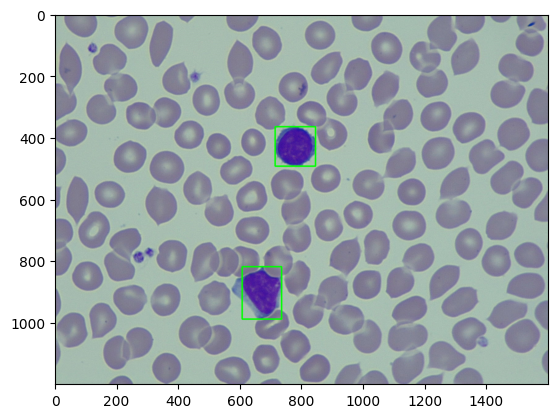

In [11]:
plt.imshow(images_list[4], cmap = "gray")
plt.show()

In [9]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the image in grayscale mode
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Otsu's thresholding
ret, mask = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Print the threshold used
print("Otsu's threshold:", ret)

# Display the original image and the mask
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(mask, cmap='gray')
plt.title('Binary Mask')
plt.show()

NameError: name 'image_path' is not defined

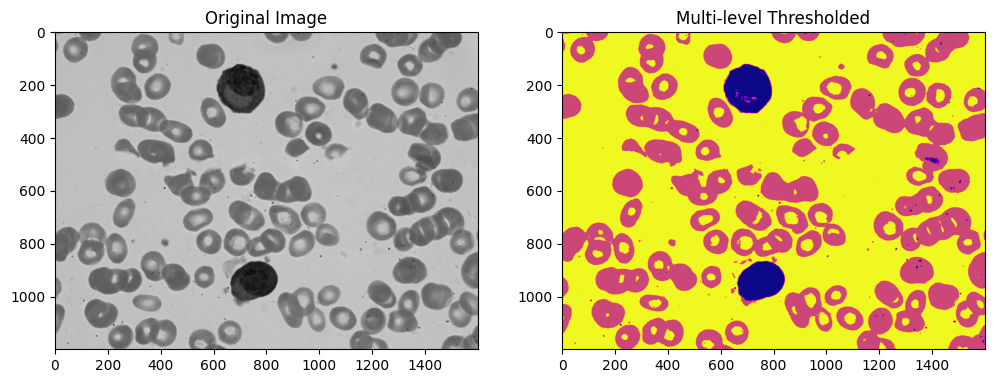

In [38]:
import matplotlib.pyplot as plt
from skimage import io
from skimage.filters import threshold_multiotsu
from skimage.color import rgb2gray

# Load the image
image = io.imread(image_path)
if len(image.shape) == 3:  # Check if the image is colored
    image = rgb2gray(image)

# Multi-level Otsu's thresholding
# The number of classes is set to 3, which means it calculates 2 thresholds dividing the image into 3 parts.
thresholds = threshold_multiotsu(image, classes=3)
regions = np.digitize(image, bins=thresholds)

# Display the original image and the resulting segmented image
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.subplot(122)
plt.imshow(regions, cmap='plasma')
plt.title('Multi-level Thresholded')
plt.show()

In [8]:
def load_paths_from_folders(data_dir):
    image_dir = []
    for file in os.listdir(data_dir):
        image_path = os.path.join(data_dir, file)
        image_dir.append(image_path)
        
    return image_dir


In [9]:
plasmatica = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Plasmatica")
thricholeukemia = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia")
monoclueosis = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis")
LLC = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC")
marginal = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal")
LLA = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Leucemia aguda linfoblastica")
normal = load_paths_from_folders(r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales")


C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image001.jpg
minima frequencies: [   0    0   16  552  606  529  439  152  113  113   97   90   74   71
   87  100  132  167  195  233 3014 2817 2671 2639 2577 2677 2728   59
    0]
Maxima Dict: {134.0: 67334, 189.0: 144720}
Minima Dict: {38: 0, 40: 0, 46: 16, 56: 552, 58: 606, 60: 529, 62: 439, 73: 152, 75: 113, 78: 113, 81: 97, 84: 90, 87: 74, 90: 71, 93: 87, 98: 100, 100: 132, 102: 167, 106: 195, 110: 233, 156: 3014, 159: 2817, 161: 2671, 163: 2639, 168: 2577, 170: 2677, 172: 2728, 207: 59, 215: 0}
Selected Threshold Value: 110


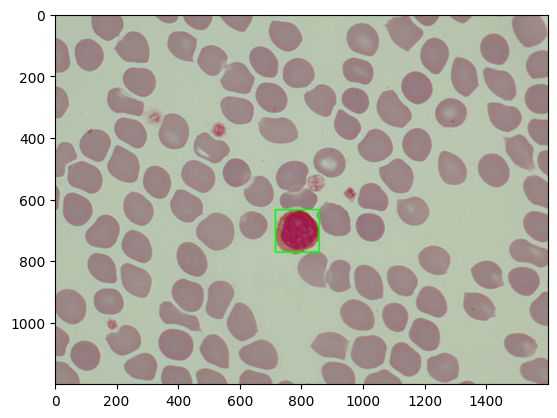

C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image003.jpg
minima frequencies: [   1  135   82   66   56   68   64   63   98  135  119  126  143 3606
 3432 3369 3297 2999 2835 2877   10    1    0    0]
Maxima Dict: {127.0: 70056, 177.0: 149510}
Minima Dict: {38: 1, 68: 135, 74: 82, 76: 66, 80: 56, 82: 68, 85: 64, 87: 63, 90: 98, 97: 135, 99: 119, 102: 126, 106: 143, 147: 3606, 150: 3432, 152: 3369, 154: 3297, 158: 2999, 160: 2835, 163: 2877, 198: 10, 202: 1, 207: 0, 252: 0}
Selected Threshold Value: 106


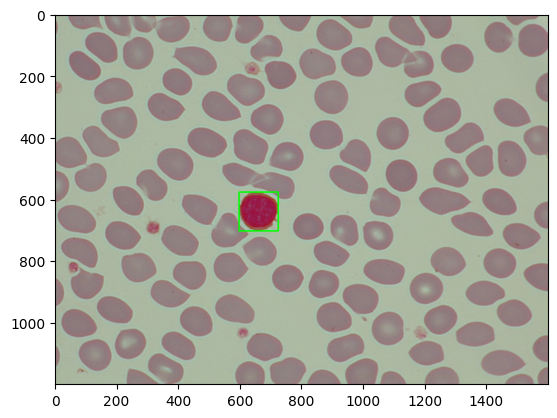

C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image004.jpg
minima frequencies: [1080 1066  477  348  290  235  180  170  183  208  221  234  195  220
  299 9151 8654 4607 4293 4326    5    2    0    0]
Maxima Dict: {128.0: 61451, 181.0: 120517}
Minima Dict: {55: 1080, 57: 1066, 69: 477, 72: 348, 75: 290, 77: 235, 82: 180, 85: 170, 90: 183, 92: 208, 94: 221, 98: 234, 100: 195, 105: 220, 108: 299, 146: 9151, 148: 8654, 164: 4607, 166: 4293, 169: 4326, 202: 5, 204: 2, 207: 0, 239: 0}
Selected Threshold Value: 108


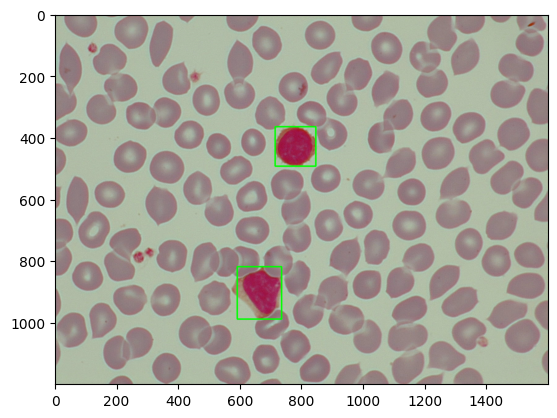

C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image006.jpg
minima frequencies: [ 536  504  449  264  213  185  126  104   87   92  144  172  212  203
  238  239  231  243  275 8205 3989]
Maxima Dict: {126.0: 66145, 178.0: 140641}
Minima Dict: {58: 536, 60: 504, 62: 449, 69: 264, 71: 213, 75: 185, 79: 126, 81: 104, 83: 87, 86: 92, 91: 144, 93: 172, 96: 212, 98: 203, 100: 238, 102: 239, 104: 231, 107: 243, 110: 275, 144: 8205, 165: 3989}
Selected Threshold Value: 110


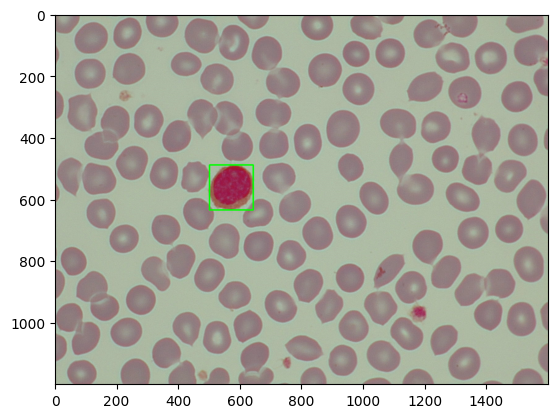

In [19]:
for line in normal: 
    print(line)
    image = cv2.imread(line)
    binary_image = main_process_visualizer_single(image)
    plt.imshow(binary_image[4], cmap = "gray")
    plt.show()


Threshold values: 152
Image: 192
Significant maxima indices: [153 217]
Intensity values of significant maxima: [153. 217.]
Frequencies of significant maxima: [ 38398 153190]
Significant minima indices: [101 103 114 118 120 123 125 128 130 132 152 192 194 196 199]
Intensity values of significant minima: [101. 103. 114. 118. 120. 123. 125. 128. 130. 132. 152. 192. 194. 196.
 199.]
Frequencies of significant minima: [  107   157   534   506   493   439   368   314   281   301 37928  4609
  4355  4511  4743]


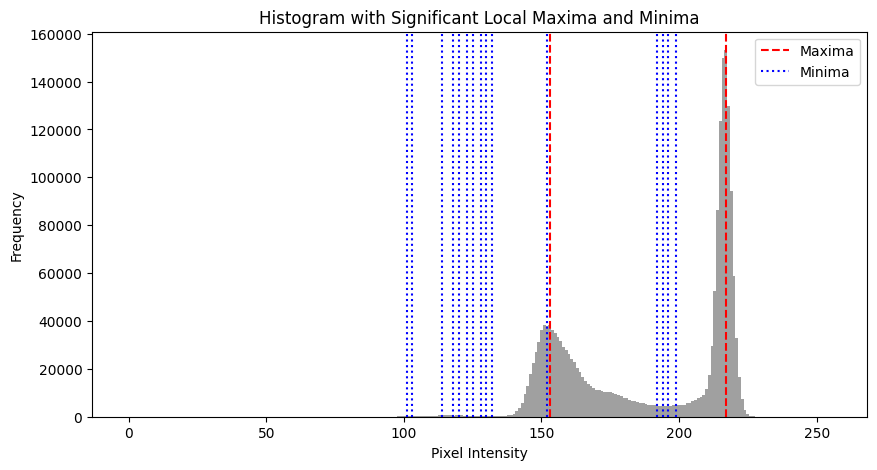

In [44]:
image_path = r"C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\4.jpg"
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):

    image = cv2.imread(image_path)

    # Load the image in grayscale
    grayscale_image = peripheral_manager.convert_grayscale(image = image, 
                                                    converter="simple")
    
    pixel_values = np.array(grayscale_image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(image_path)

for idx in maxima_indices:
    maxima_dict[bin_edges[idx]] = counts[idx]

max_value = max(maxima_dict, key=maxima_dict.get)

for line in range(len(maxima_indices)): 
    if maxima_indices[line] > 100: 
        threshold_value_max = maxima_indices[line]
        break

for line in minima_indices:
    if line > threshold_value_max: 
        break
    threshold_value_min = line

print(f"Threshold values: {threshold_value_min}")

# Print the local maxima values and their frequencies
print("Image:", line)
print("Significant maxima indices:", maxima_indices)
print("Intensity values of significant maxima:", bin_edges[maxima_indices])
print("Frequencies of significant maxima:", counts[maxima_indices])

# Print the local minima values and their frequencies
print("Significant minima indices:", minima_indices)
print("Intensity values of significant minima:", bin_edges[minima_indices])
print("Frequencies of significant minima:", counts[minima_indices])

# Plotting
plt.figure(figsize=(10, 5))
plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
for maxima in maxima_indices:
    plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
for minima in minima_indices:
    plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
plt.title('Histogram with Significant Local Maxima and Minima')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.show()

151
Image: 175
Significant maxima indices: [172 207]
Intensity values of significant maxima: [172. 207.]
Frequencies of significant maxima: [42060 90853]
Significant minima indices: [ 37  43  49  53  60  63  67  95 105 117 122 127 130 132 136 139 142 146
 151 175 193 210 214 220 247 249]
Intensity values of significant minima: [ 37.  43.  49.  53.  60.  63.  67.  95. 105. 117. 122. 127. 130. 132.
 136. 139. 142. 146. 151. 175. 193. 210. 214. 220. 247. 249.]
Frequencies of significant minima: [    1    51   158   195   106    87   162  3328  2470  1367  1158   999
   888   893   869   808   898  1116  1584 39893 23355 78524 74940 36902
    29    22]


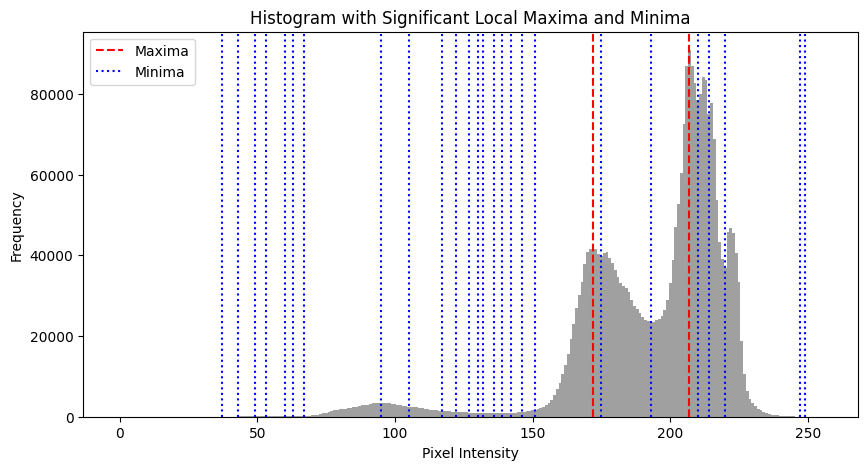

148
Image: 190
Significant maxima indices: [173 212]
Intensity values of significant maxima: [173. 212.]
Frequencies of significant maxima: [ 49944 185830]
Significant minima indices: [ 31  43  57  59  76  82  91  95 103 106 113 115 118 121 126 129 131 135
 141 144 148 190 193 199 241]
Intensity values of significant minima: [ 31.  43.  57.  59.  76.  82.  91.  95. 103. 106. 113. 115. 118. 121.
 126. 129. 131. 135. 141. 144. 148. 190. 193. 199. 241.]
Frequencies of significant minima: [    0   135   614   686  2391  2026  1189   946   650   619   654   695
   751   730   806   803   756   763   899   924  1086 23614 22811 24227
    43]


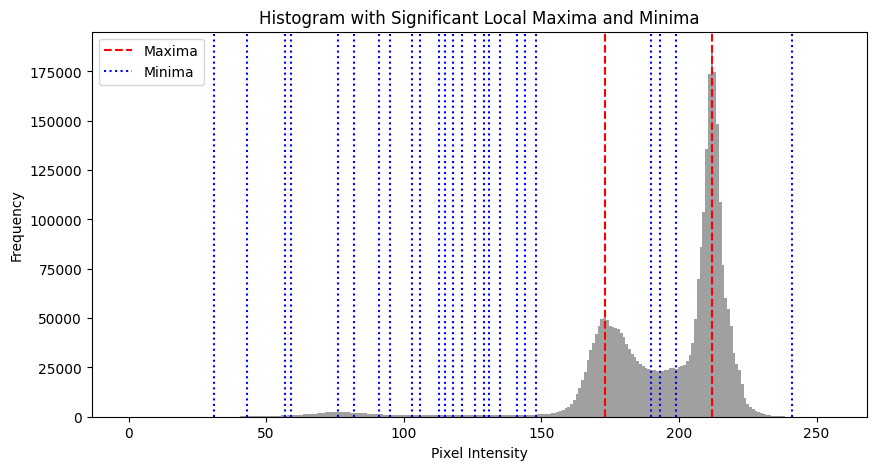

177
Image: 192
Significant maxima indices: [178 215]
Intensity values of significant maxima: [178. 215.]
Frequencies of significant maxima: [ 51969 211270]
Significant minima indices: [ 55  60  89  91  93  95 103 111 113 116 118 122 128 130 133 136 138 148
 177 192 194 228 246]
Intensity values of significant minima: [ 55.  60.  89.  91.  93.  95. 103. 111. 113. 116. 118. 122. 128. 130.
 133. 136. 138. 148. 177. 192. 194. 228. 246.]
Frequencies of significant minima: [  128    63  2703  3002  2938  2776  1710  1122  1108  1078   936   819
   820   851   811   941  1146  1546 50840 18506 18650 10338    15]


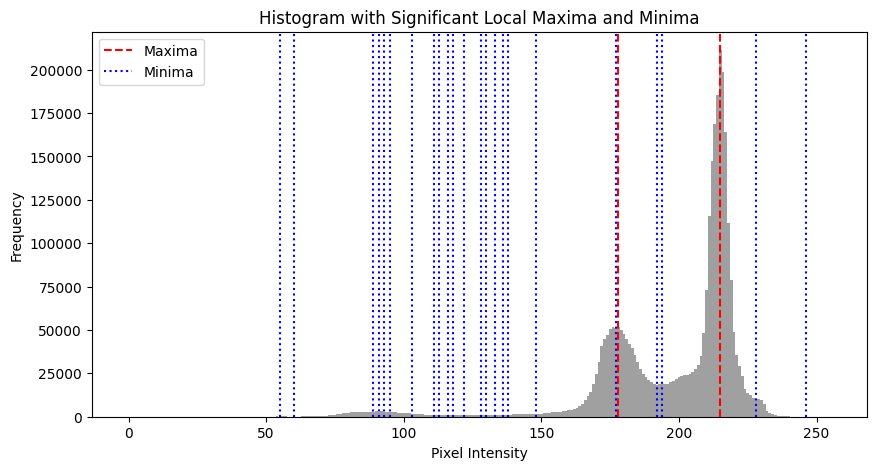

138
Image: 193
Significant maxima indices: [170 226]
Intensity values of significant maxima: [170. 226.]
Frequencies of significant maxima: [ 52210 165720]
Significant minima indices: [ 42  44  47  49  52  75  81  84 100 103 109 117 119 122 124 126 128 134
 138 193 206 208]
Intensity values of significant minima: [ 42.  44.  47.  49.  52.  75.  81.  84. 100. 103. 109. 117. 119. 122.
 124. 126. 128. 134. 138. 193. 206. 208.]
Frequencies of significant minima: [    1     1    12    31    84  4126  4076  3699  1548  1319  1029   766
   766   731   729   699   658   855   895 17130 21252 21800]


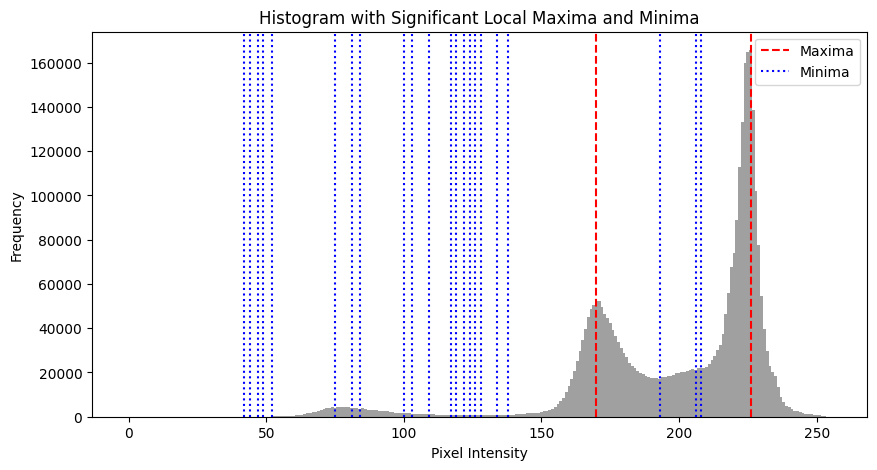

143
Image: 186
Significant maxima indices: [173 212]
Intensity values of significant maxima: [173. 212.]
Frequencies of significant maxima: [ 46158 168369]
Significant minima indices: [ 72  76  84  86  90 100 106 111 113 115 119 122 125 127 129 133 137 140
 143 186 204 240 244 246 248]
Intensity values of significant minima: [ 72.  76.  84.  86.  90. 100. 106. 111. 113. 115. 119. 122. 125. 127.
 129. 133. 137. 140. 143. 186. 204. 240. 244. 246. 248.]
Frequencies of significant minima: [ 1824  1588  1301  1308  1369   722   593   533   555   545   561   535
   538   561   573   619   705   770   815 22925 34892     2     3     0
     0]


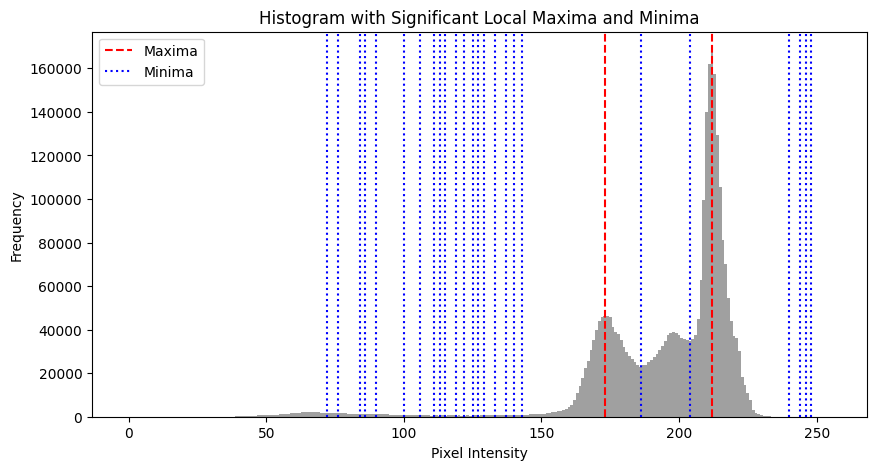

130
Image: 190
Significant maxima indices: [165 213]
Intensity values of significant maxima: [165. 213.]
Frequencies of significant maxima: [ 71862 116003]
Significant minima indices: [ 16  20  41  49  52  56  67  72  74  78  80  83  87  90  92  94  97  99
 101 103 107 111 113 115 119 123 125 127 130 190 194 197 200 202 223 250]
Intensity values of significant minima: [ 16.  20.  41.  49.  52.  56.  67.  72.  74.  78.  80.  83.  87.  90.
  92.  94.  97.  99. 101. 103. 107. 111. 113. 115. 119. 123. 125. 127.
 130. 190. 194. 197. 200. 202. 223. 250.]
Frequencies of significant minima: [    0     1   523   887   920  1079  1060   937   911   828   787   804
   819   795   742   721   674   651   633   593   618   592   534   517
   491   520   544   515   627 22165 21503 21132 20673 20584 19218     1]


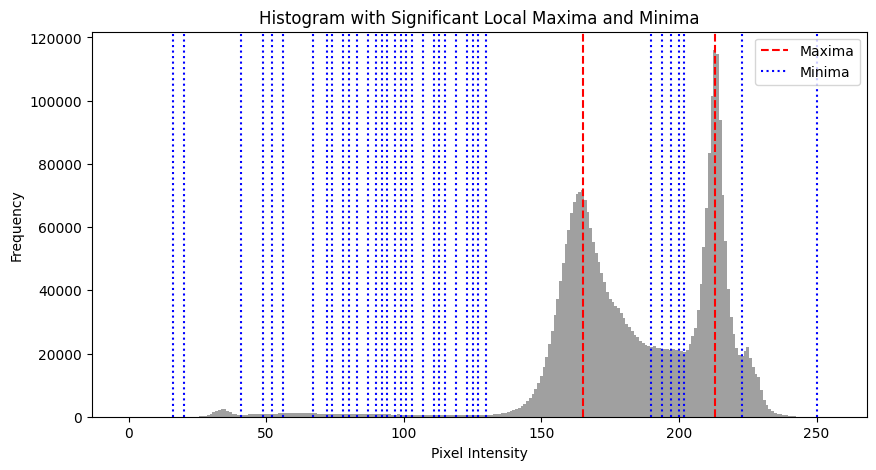

127
Image: 198
Significant maxima indices: [167 220]
Intensity values of significant maxima: [167. 220.]
Frequencies of significant maxima: [39514 46730]
Significant minima indices: [ 34  53  58  60  62  64  71  73  75  79  82  87  90  93 102 104 106 111
 116 119 122 124 127 198 200 203]
Intensity values of significant minima: [ 34.  53.  58.  60.  62.  64.  71.  73.  75.  79.  82.  87.  90.  93.
 102. 104. 106. 111. 116. 119. 122. 124. 127. 198. 200. 203.]
Frequencies of significant minima: [   0  455  542  563  536  598  527  468  444  403  349  295  270  187
  117  105  114  132  172  189  200  179  249 5908 5794 6049]


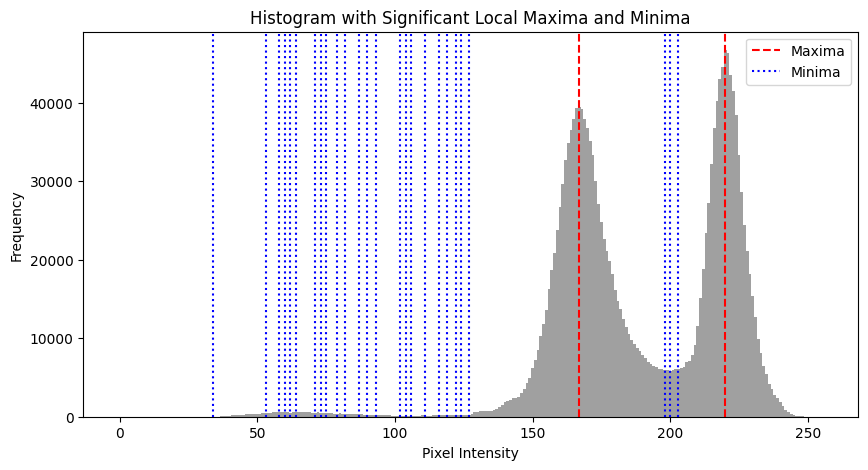

129
Image: 189
Significant maxima indices: [163 217]
Intensity values of significant maxima: [163. 217.]
Frequencies of significant maxima: [45778 63872]
Significant minima indices: [ 30  47  49  51  53  55  58  64  67  69  72  79  81  85  89  92  94  96
  98 103 107 113 118 121 129 189 191 197 202 204 215 238 243]
Intensity values of significant minima: [ 30.  47.  49.  51.  53.  55.  58.  64.  67.  69.  72.  79.  81.  85.
  89.  92.  94.  96.  98. 103. 107. 113. 118. 121. 129. 189. 191. 197.
 202. 204. 215. 238. 243.]
Frequencies of significant minima: [    8   425   436   370   384   373   414   382   365   382   426   379
   382   314   307   283   298   302   336   343   341   423   423   449
   590 14215 14154 14887 14029 13652 58647    79    32]


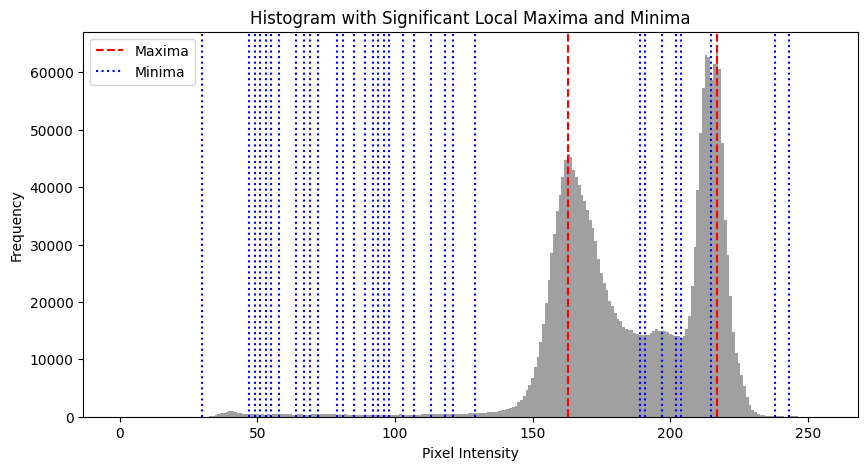

132
Image: 164
Significant maxima indices: [162 212]
Intensity values of significant maxima: [162. 212.]
Frequencies of significant maxima: [43898 66065]
Significant minima indices: [ 56  60  63  67  69  72  74  76  78  82  85  89  92  96 100 104 110 114
 118 120 123 125 129 132 164 196 198 200 222]
Intensity values of significant minima: [ 56.  60.  63.  67.  69.  72.  74.  76.  78.  82.  85.  89.  92.  96.
 100. 104. 110. 114. 118. 120. 123. 125. 129. 132. 164. 196. 198. 200.
 222.]
Frequencies of significant minima: [  394   599   726   897  1028  1090  1133  1209  1383  1282  1239  1176
  1143  1114  1025   805   701   648   577   561   574   581   676   764
 41211 13617 13374 13625 38618]


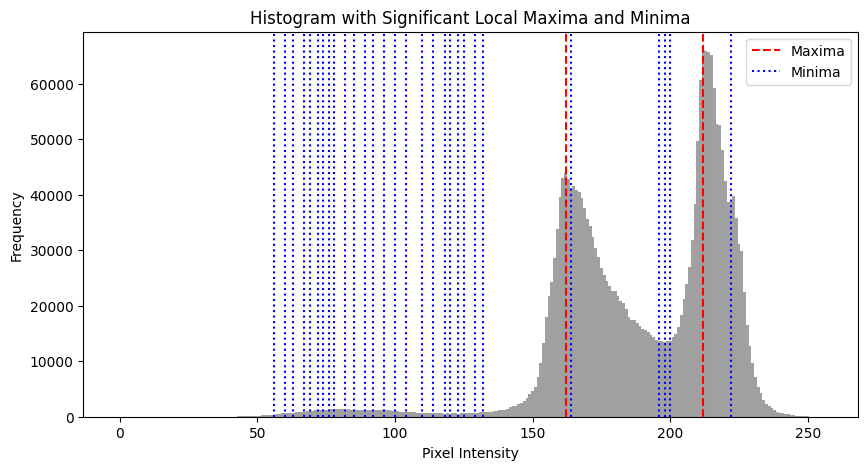

135
Image: 165
Significant maxima indices: [163 214]
Intensity values of significant maxima: [163. 214.]
Frequencies of significant maxima: [43879 96571]
Significant minima indices: [ 38  41  46  49  51  53  55  58  60  78  81  86  91  94  98 107 109 112
 114 116 122 131 135 165 181 192 194 201 248]
Intensity values of significant minima: [ 38.  41.  46.  49.  51.  53.  55.  58.  60.  78.  81.  86.  91.  94.
  98. 107. 109. 112. 114. 116. 122. 131. 135. 165. 181. 192. 194. 201.
 248.]
Frequencies of significant minima: [  102   148   193   219   202   159   156   215   170  1495  1441  1258
   873   677   490   307   271   235   219   224   265   324   373 43151
 21435 18614 18534 15708     1]


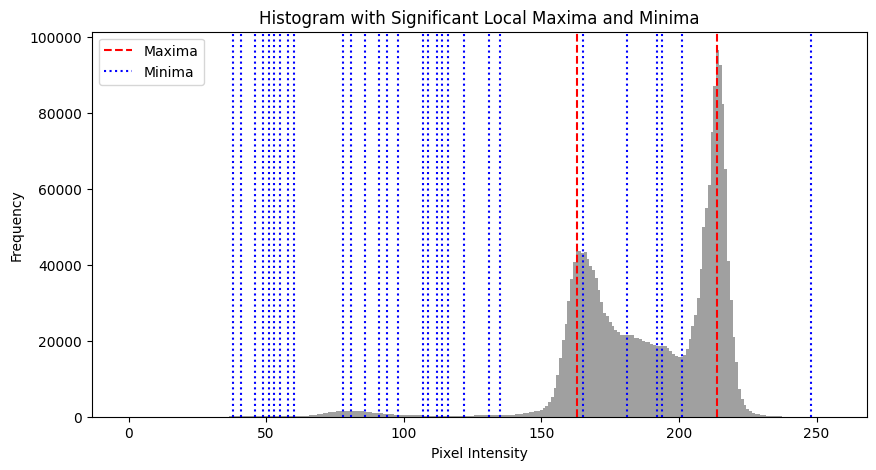

129
Image: 193
Significant maxima indices: [164 215]
Intensity values of significant maxima: [164. 215.]
Frequencies of significant maxima: [ 46884 128124]
Significant minima indices: [ 31  33  36  58  65  73  82  85  88  90  93  96 101 105 115 117 119 121
 124 127 129 193 195 198]
Intensity values of significant minima: [ 31.  33.  36.  58.  65.  73.  82.  85.  88.  90.  93.  96. 101. 105.
 115. 117. 119. 121. 124. 127. 129. 193. 195. 198.]
Frequencies of significant minima: [    1     7    14   306   479   678   649   640   599   591   503   469
   350   358   264   262   258   234   266   297   351 11426 11128 10735]


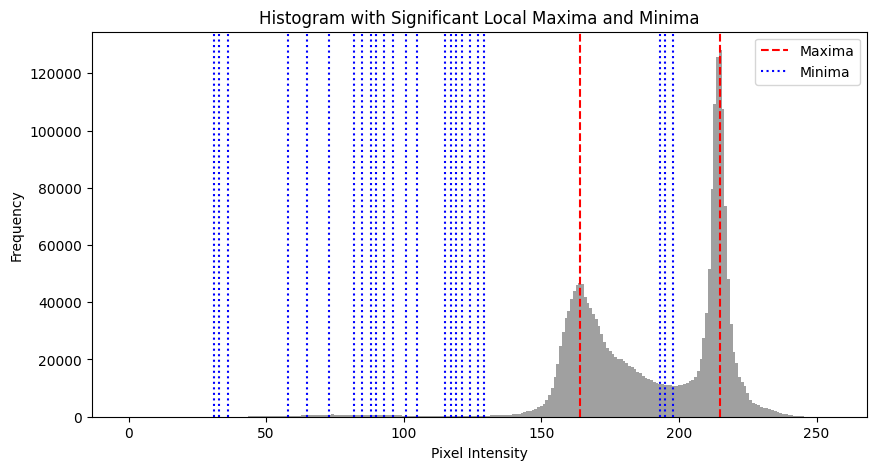

123
Image: 200
Significant maxima indices: [165 217]
Intensity values of significant maxima: [165. 217.]
Frequencies of significant maxima: [ 64722 117329]
Significant minima indices: [ 31  38  50  54  66  74  80  82  91  94  96  98 100 102 106 112 114 118
 120 123 200 203]
Intensity values of significant minima: [ 31.  38.  50.  54.  66.  74.  80.  82.  91.  94.  96.  98. 100. 102.
 106. 112. 114. 118. 120. 123. 200. 203.]
Frequencies of significant minima: [ 1073  3169  1807  1864  1343   989   764   692   505   459   409   406
   395   399   399   479   528   633   638   747 18541 18174]


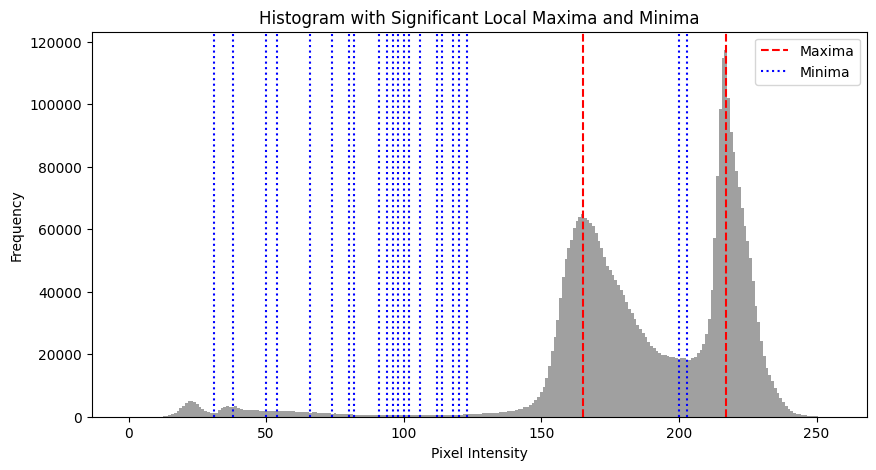

130
Image: 200
Significant maxima indices: [165 216]
Intensity values of significant maxima: [165. 216.]
Frequencies of significant maxima: [58904 95053]
Significant minima indices: [ 25  42  45  52  60  68  73  79  81  84  86  88  90  93  95  98 101 104
 108 110 115 124 130 200 202]
Intensity values of significant minima: [ 25.  42.  45.  52.  60.  68.  73.  79.  81.  84.  86.  88.  90.  93.
  95.  98. 101. 104. 108. 110. 115. 124. 130. 200. 202.]
Frequencies of significant minima: [   90  3079  2865  2316  1857  1276  1091   839   809   765   697   649
   624   587   613   588   600   559   587   657   799  1247  1282 15714
 15335]


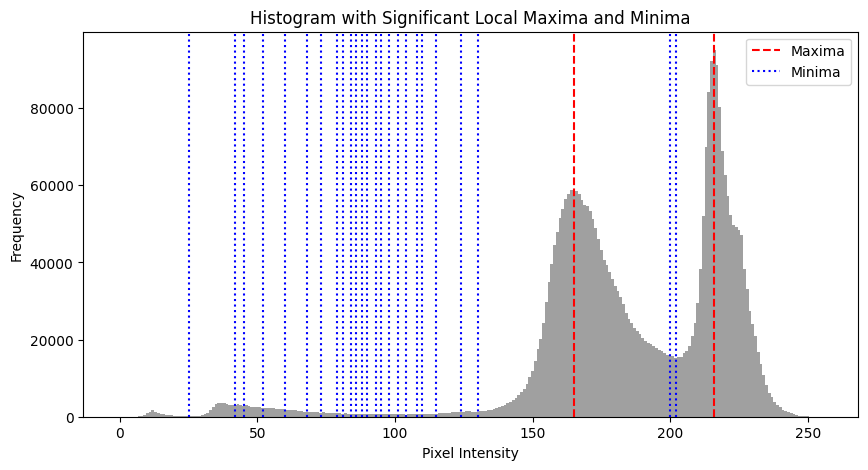

129
Image: 196
Significant maxima indices: [165 216]
Intensity values of significant maxima: [165. 216.]
Frequencies of significant maxima: [63265 83467]
Significant minima indices: [  3   6  25  28  47  53  55  57  61  63  66  70  72  75  77  81  83  86
  89  94  96  98 100 102 108 111 117 119 121 124 126 129 196 200 202]
Intensity values of significant minima: [  3.   6.  25.  28.  47.  53.  55.  57.  61.  63.  66.  70.  72.  75.
  77.  81.  83.  86.  89.  94.  96.  98. 100. 102. 108. 111. 117. 119.
 121. 124. 126. 129. 196. 200. 202.]
Frequencies of significant minima: [    0     1    47    55  1667  1578  1550  1430  1349  1280  1275  1204
  1156  1067  1032   924   909   841   796   716   711   696   650   623
   474   433   387   395   402   441   403   474 13436 12606 12602]


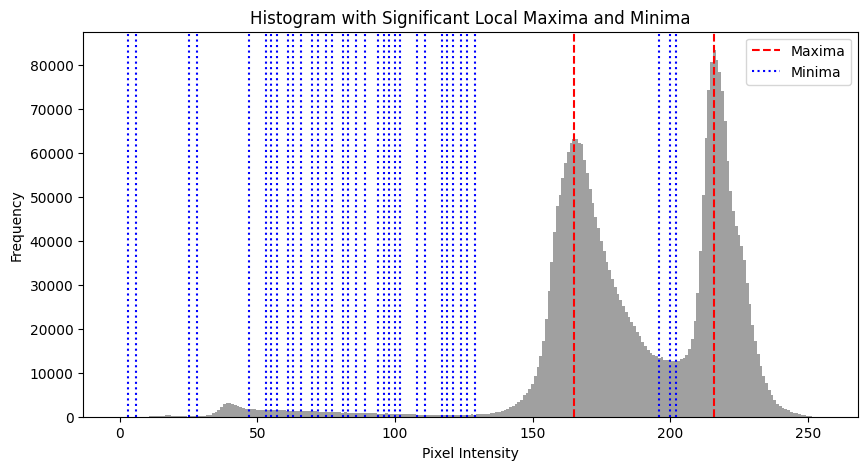

140
Image: 201
Significant maxima indices: [167 213]
Intensity values of significant maxima: [167. 213.]
Frequencies of significant maxima: [ 60814 119393]
Significant minima indices: [ 20  25  29  42  44  52  54  57  69  71  73  77  83  87  93  99 105 108
 112 115 128 140 201]
Intensity values of significant minima: [ 20.  25.  29.  42.  44.  52.  54.  57.  69.  71.  73.  77.  83.  87.
  93.  99. 105. 108. 112. 115. 128. 140. 201.]
Frequencies of significant minima: [    0     4    38  1876  1845  2291  2252  2234  1708  1709  1673  1619
  1601  1506  1074   878   686   699   729   741  1430  2431 16013]


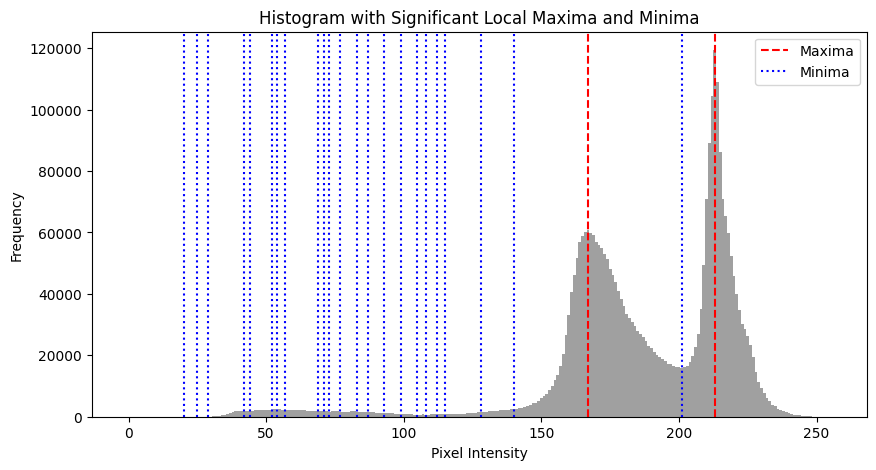

137
Image: 169
Significant maxima indices: [168 217 226]
Intensity values of significant maxima: [168. 217. 226.]
Frequencies of significant maxima: [ 53491 131125  49311]
Significant minima indices: [  6  10  29  47  56  58  65  71  75  80  83  86  89  91 110 113 115 117
 121 124 126 128 130 132 137 169 171 203 205 224]
Intensity values of significant minima: [  6.  10.  29.  47.  56.  58.  65.  71.  75.  80.  83.  86.  89.  91.
 110. 113. 115. 117. 121. 124. 126. 128. 130. 132. 137. 169. 171. 203.
 205. 224.]
Frequencies of significant minima: [   27    71    80  1035  1467  1511  1620  1557  1689  1585  1604  1743
  1723  1651   760   717   692   683   608   626   634   631   657   667
   876 51738 52047 20518 20420 36575]


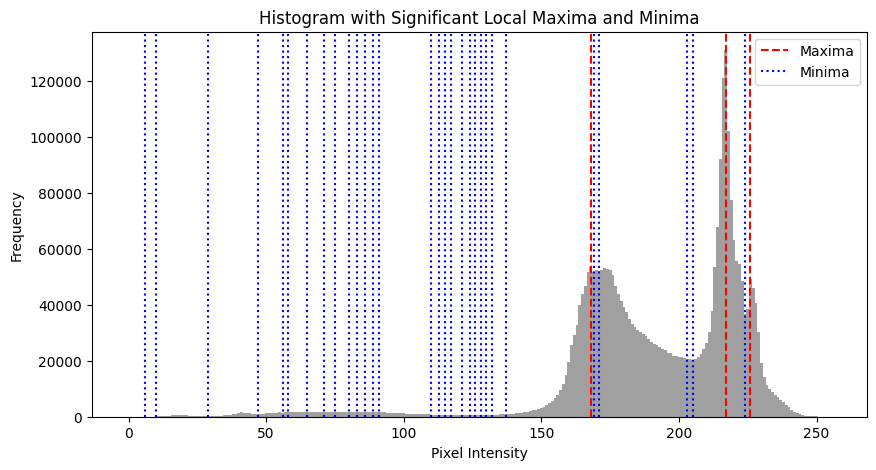

144
Image: 173
Significant maxima indices: [171 215]
Intensity values of significant maxima: [171. 215.]
Frequencies of significant maxima: [ 51346 112557]
Significant minima indices: [ 30  46  64  72  75  78  81  83  86  89  91  97 105 108 111 116 118 122
 126 131 133 136 140 144 173 193 197 207 222 241 246 248]
Intensity values of significant minima: [ 30.  46.  64.  72.  75.  78.  81.  83.  86.  89.  91.  97. 105. 108.
 111. 116. 118. 122. 126. 131. 133. 136. 140. 144. 173. 193. 197. 207.
 222. 241. 246. 248.]
Frequencies of significant minima: [    0   433  1010  1172  1208  1217  1179  1224  1216  1189  1162   946
   663   634   544   524   531   604   718   801   807   874   903   935
 48452 27692 26969 22125 41428    49     6     1]


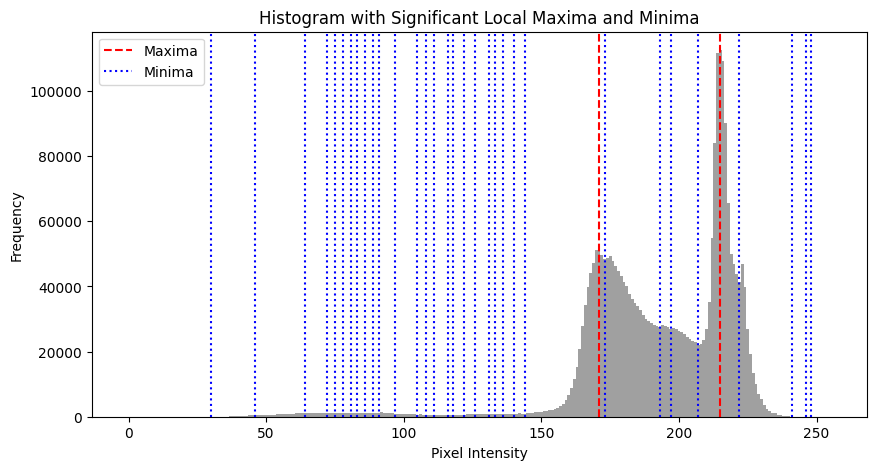

126
Image: 201
Significant maxima indices: [169 215]
Intensity values of significant maxima: [169. 215.]
Frequencies of significant maxima: [ 73050 114781]
Significant minima indices: [ 38  42  53  58  60  62  64  66  73  88  93  97 100 104 107 112 120 126
 201 218 250]
Intensity values of significant minima: [ 38.  42.  53.  58.  60.  62.  64.  66.  73.  88.  93.  97. 100. 104.
 107. 112. 120. 126. 201. 218. 250.]
Frequencies of significant minima: [  602   643  1156  1237  1252  1248  1287  1328  1557  1053   862   793
   744   665   628   620   904  1149 19644 73846    15]


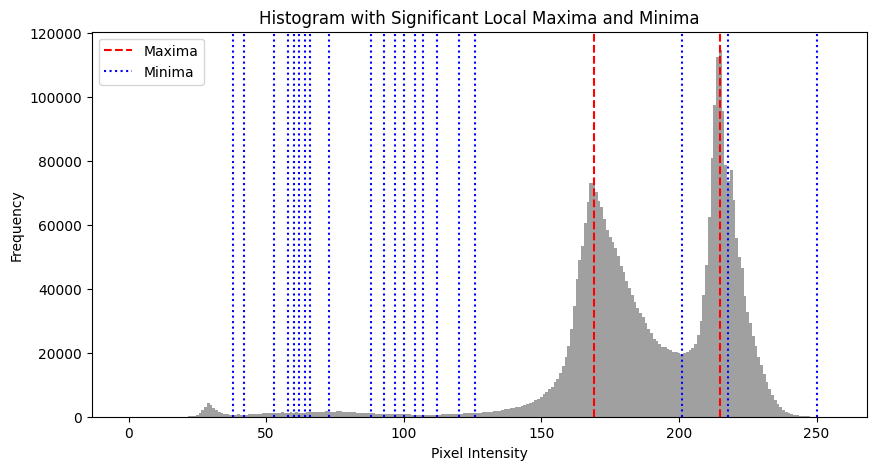

145
Image: 181
Significant maxima indices: [171 215]
Intensity values of significant maxima: [171. 215.]
Frequencies of significant maxima: [ 56296 119190]
Significant minima indices: [ 12  29  31  33  39  74  76  81  84 103 109 113 116 127 129 133 136 138
 141 145 181 193 195 205 225 243]
Intensity values of significant minima: [ 12.  29.  31.  33.  39.  74.  76.  81.  84. 103. 109. 113. 116. 127.
 129. 133. 136. 138. 141. 145. 181. 193. 195. 205. 225. 243.]
Frequencies of significant minima: [    0    23    14    11   124  2693  2665  2599  2502  1006   877   820
   845  1557  1642  1720  1775  1818  1783  1921 42308 35988 36069 29681
 24714    44]


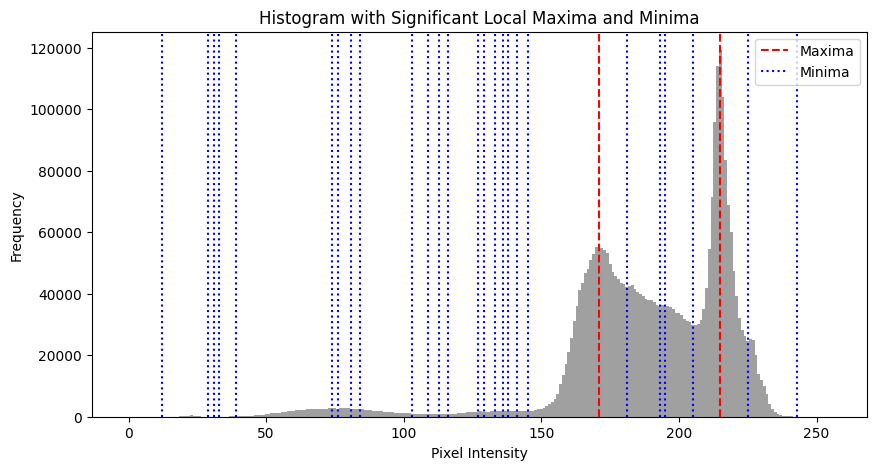

142
Image: 189
Significant maxima indices: [168 216]
Intensity values of significant maxima: [168. 216.]
Frequencies of significant maxima: [56387 88297]
Significant minima indices: [ 36  40  47  51  57  64  70  74  78  81  83  85  87  93  99 104 107 110
 116 118 120 131 134 137 142 189 200 220 251]
Intensity values of significant minima: [ 36.  40.  47.  51.  57.  64.  70.  74.  78.  81.  83.  85.  87.  93.
  99. 104. 107. 110. 116. 118. 120. 131. 134. 137. 142. 189. 200. 220.
 251.]
Frequencies of significant minima: [  144   271   724   994  1556  2120  2411  2290  2064  1970  1970  1984
  1800  1495  1270  1142  1146  1177  1298  1392  1485  2016  2022  1920
  1777 28670 25740 44119     1]


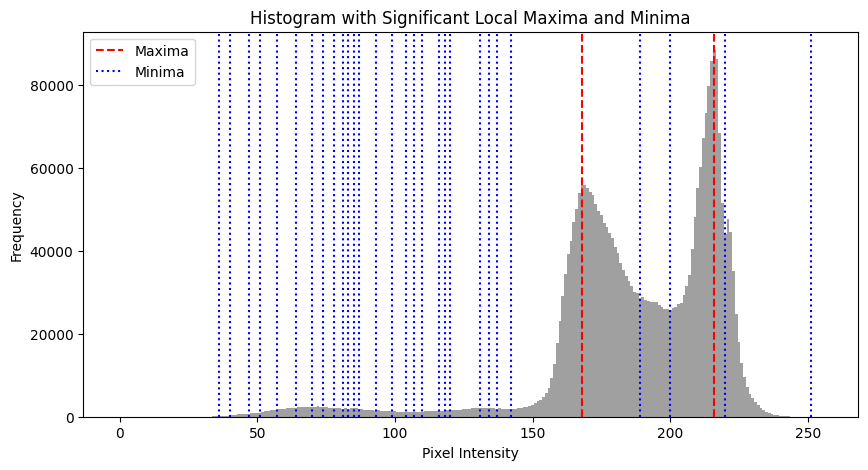

147
Image: 193
Significant maxima indices: [173 218]
Intensity values of significant maxima: [173. 218.]
Frequencies of significant maxima: [53897 83774]
Significant minima indices: [ 35  45  65  70  73  76  78  81  83 104 106 111 113 117 122 124 135 140
 144 147 193 196 206 211 243]
Intensity values of significant minima: [ 35.  45.  65.  70.  73.  76.  78.  81.  83. 104. 106. 111. 113. 117.
 122. 124. 135. 140. 144. 147. 193. 196. 206. 211. 243.]
Frequencies of significant minima: [    0   145  1597  2043  1979  2127  2106  2095  2085   751   727   762
   722   781   715   692  1199  1166  1151  1241 29771 30137 26060 29899
     0]


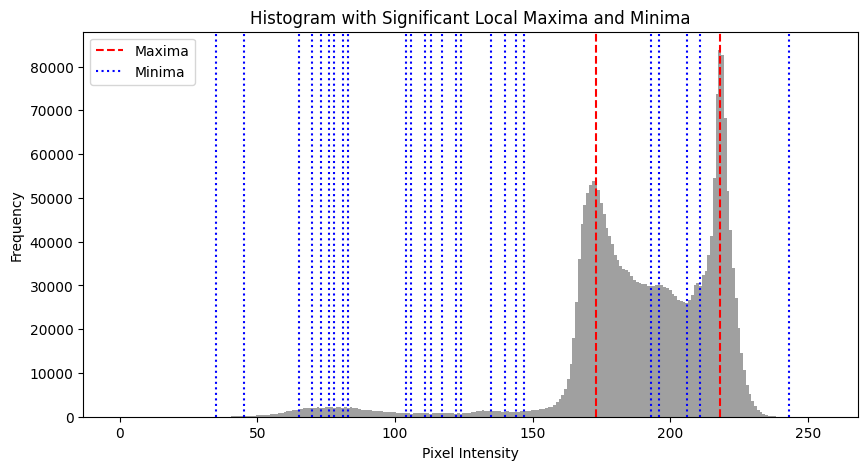

147
Image: 195
Significant maxima indices: [173 216]
Intensity values of significant maxima: [173. 216.]
Frequencies of significant maxima: [53567 58115]
Significant minima indices: [ 65  67  96 103 105 110 118 124 133 142 145 147 195 199 208 219 240 244
 249]
Intensity values of significant minima: [ 65.  67.  96. 103. 105. 110. 118. 124. 133. 142. 145. 147. 195. 199.
 208. 219. 240. 244. 249.]
Frequencies of significant minima: [  215   217  1502  1104  1078   780   548   496   803  1148  1198  1346
 18703 18861 21335 41663    24     8     4]


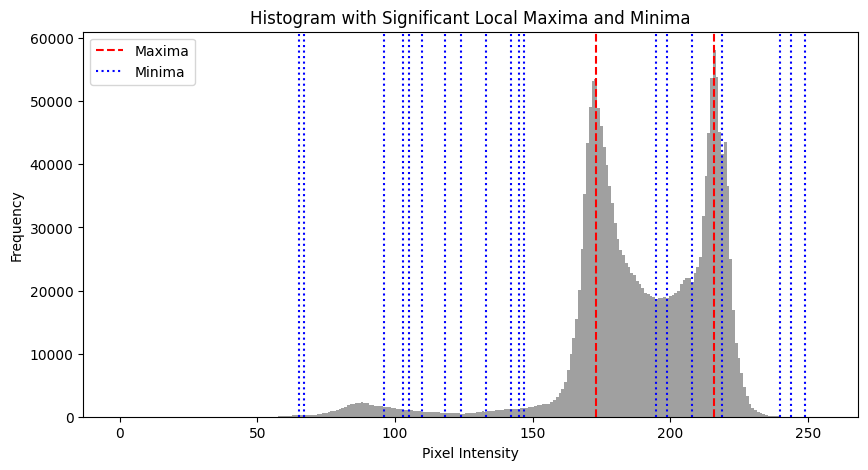

107
Image: 144
Significant maxima indices: [ 94 133 211]
Intensity values of significant maxima: [ 94. 133. 211.]
Frequencies of significant maxima: [ 14300  50252 111250]
Significant minima indices: [ 47  75 104 107 144 161 164 175 177 181 188 197]
Intensity values of significant minima: [ 47.  75. 104. 107. 144. 161. 164. 175. 177. 181. 188. 197.]
Frequencies of significant minima: [    0  2768  3454  3317 29762 14103 14625  9505  9710 10496  8973 10606]


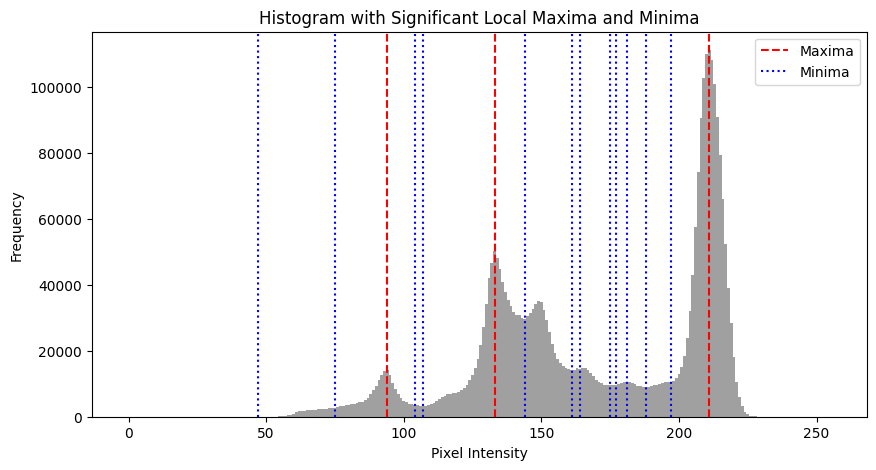

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in LLC:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    for line in range(len(maxima_indices)): 
        if maxima_indices[line] > 100: 
            threshold_value_max = maxima_indices[line]
            break

    for line in minima_indices:
        if line > threshold_value_max: 
            break
        threshold_value_min = line
    
    print(threshold_value_min)
    
    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

In [111]:
def multithreshold(image_path):
    # Load the image
    image = io.imread(image_path)
    if len(image.shape) == 3:  # Check if the image is colored
        image = color.rgb2gray(image)

    # Multi-level Otsu's thresholding
    thresholds = filters.threshold_multiotsu(image, classes=5)
    regions = np.digitize(image, bins=thresholds)

    print(thresholds)
    # Create masks for each level
    first_level_mask = (image > thresholds[0])
    second_level_mask = (image > thresholds[1])
    third_level_mask = (image > thresholds[2])
    fourth_level_mask = (image > thresholds[3])


    return image, first_level_mask, second_level_mask, third_level_mask, fourth_level_mask

In [115]:
category_dict = {}
for line in monoclueosis:
    category_dict[line.split("\\")[-1]] = multithreshold(line)

[0.51628278 0.67347982 0.76779804 0.85163646]
[0.47789756 0.63267715 0.69802854 0.7840172 ]
[0.49061924 0.65964572 0.72593062 0.81541523]
[0.48862222 0.64170513 0.7068468  0.79153097]
[0.56678525 0.69414028 0.75228062 0.83256966]
[0.53383128 0.68366257 0.73552725 0.80179878]
[0.56434741 0.70406271 0.79530536 0.88369667]
[0.52659216 0.69530095 0.74941509 0.82581152]
[0.49985228 0.65658537 0.71536028 0.80025737]
[0.47089516 0.64322797 0.71418854 0.81556079]
[0.53590958 0.7219275  0.78758088 0.83955647]
[0.53599468 0.7090646  0.75851315 0.82444455]
[0.30559951 0.52352951 0.68697701 0.78232138]
[0.53251448 0.67368109 0.73706202 0.8148477 ]
[0.55930075 0.70673038 0.78739942 0.84859663]
[0.49948471 0.65393236 0.72055684 0.80535163]
[0.48440484 0.65851442 0.72602629 0.81130446]
[0.5713083  0.71292533 0.76290781 0.82399751]
[0.53423624 0.67703378 0.73934543 0.81463868]
[0.42487521 0.63464949 0.71287041 0.80531332]


In [114]:
print(list(category_dict.keys()))

['2.jpg', '3.jpg', '4.jpg', '5.jpg', '71-6.JPG', '71-7.JPG', 'image001.jpg', 'image002.jpg', 'image003.jpg', 'image005.jpg', 'image006.jpg', 'image007.jpg']


0


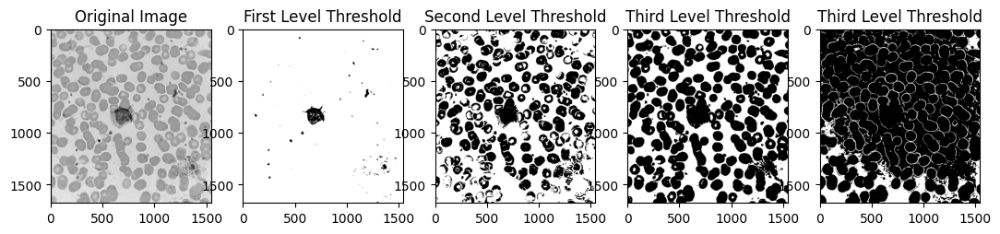

1


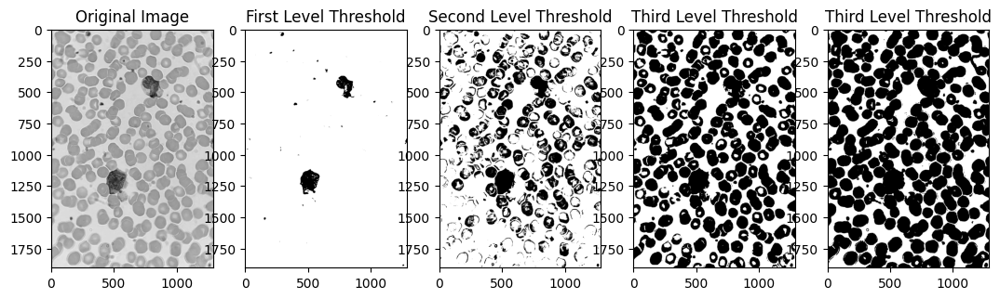

2


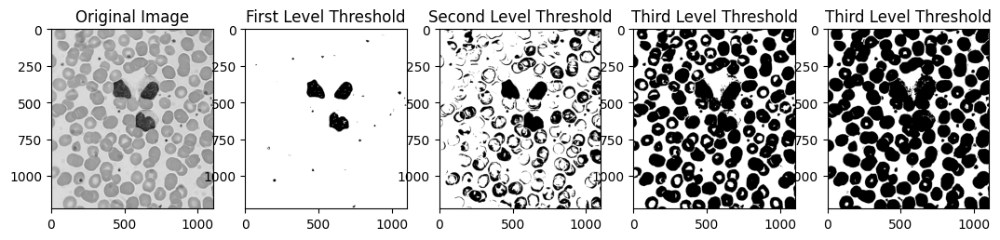

3


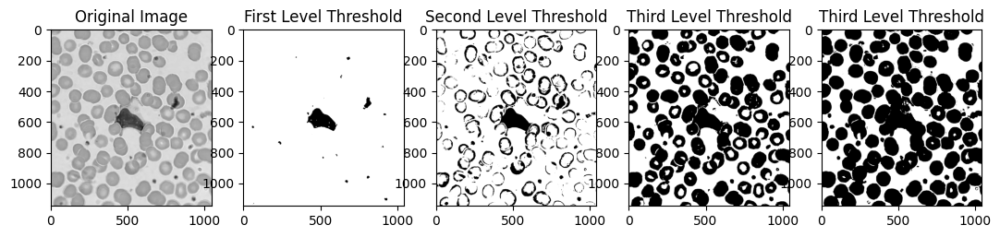

4


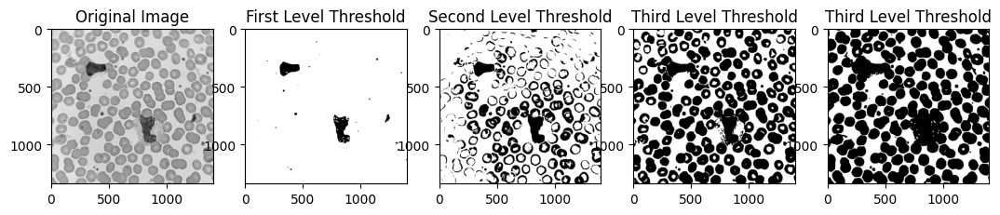

5


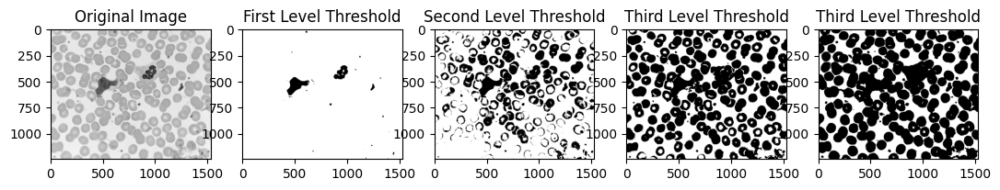

6


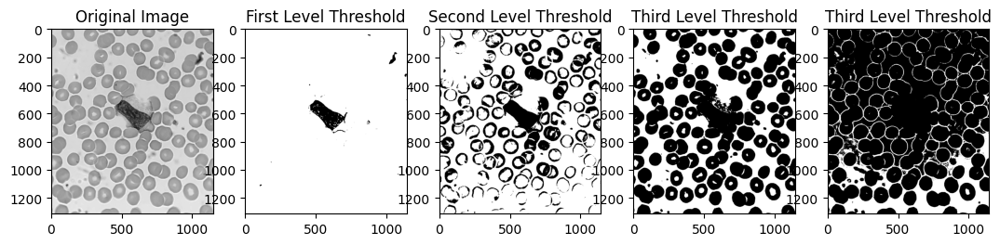

7


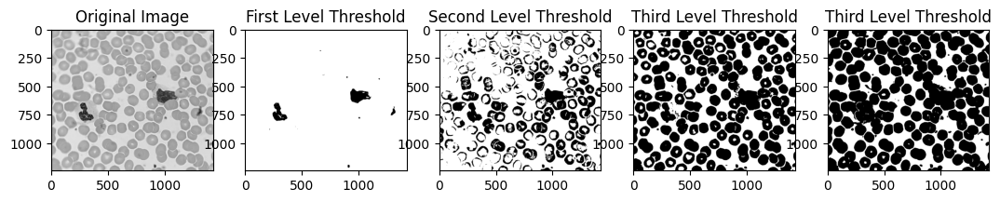

8


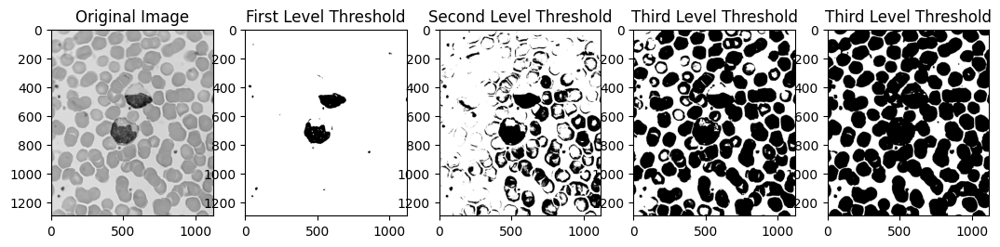

9


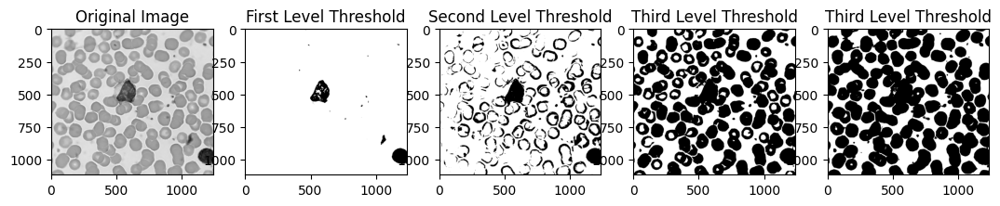

10


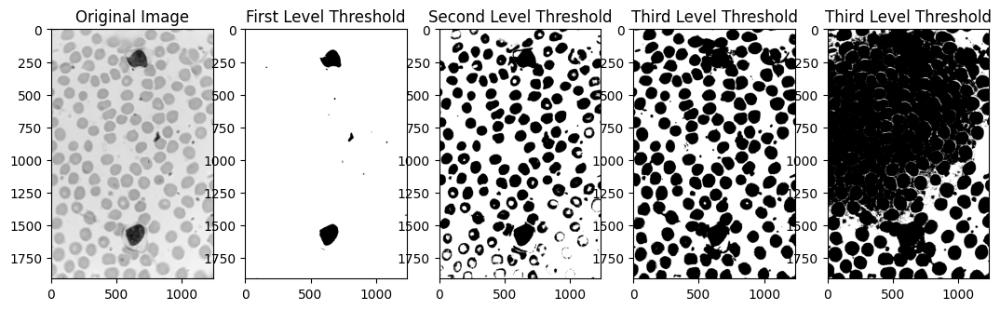

11


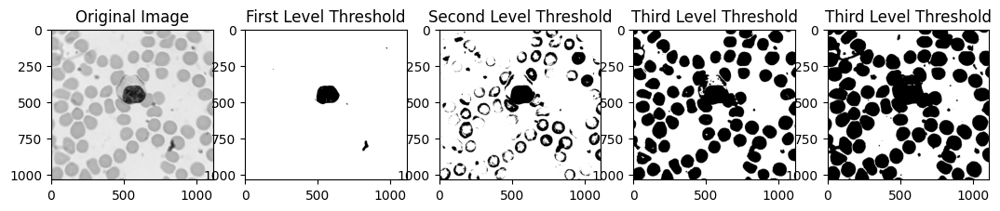

12


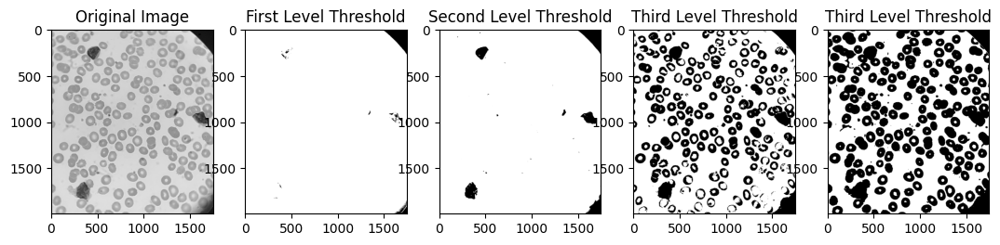

13


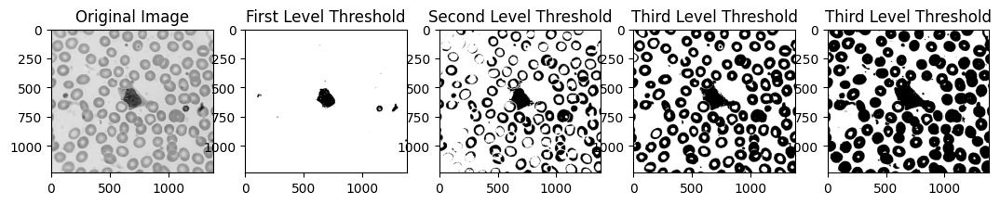

14


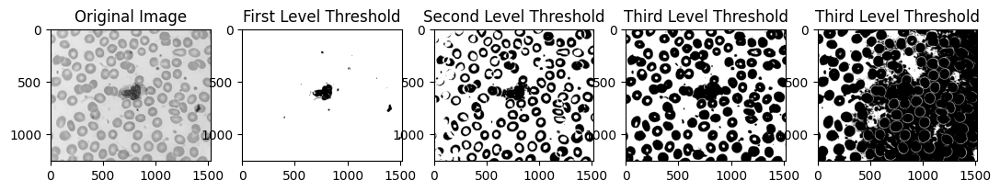

15


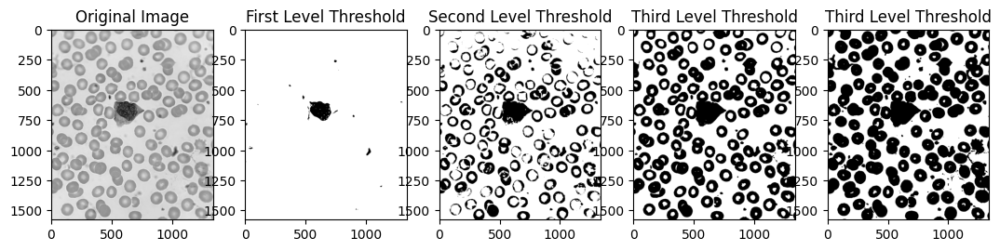

16


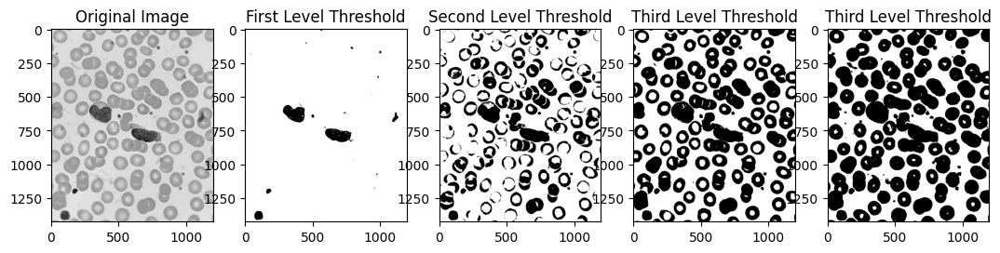

17


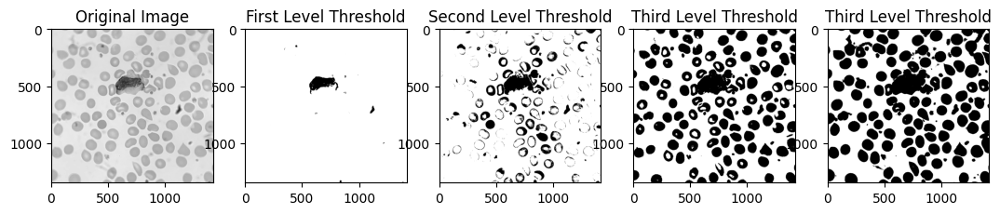

18


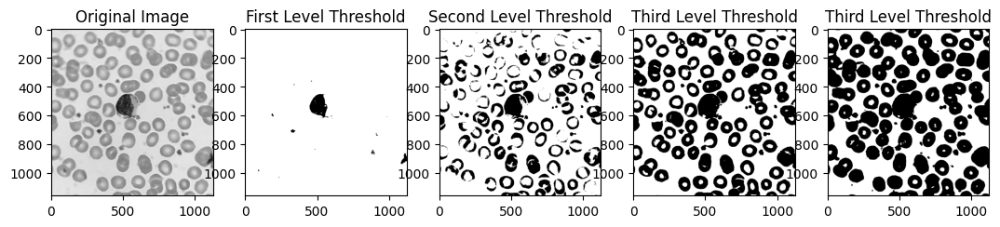

19


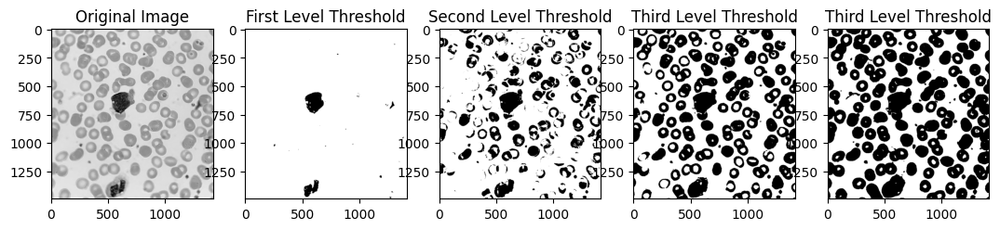

In [116]:
for line in range(len(list(category_dict.keys()))):
    print(line)

    image, first_level_mask, second_level_mask, third_level_mask, fourth_level_mask = category_dict[list(category_dict.keys())[line]]

    plt.figure(figsize=(13, 4))
    plt.subplot(151)
    plt.imshow(image, cmap='gray')
    plt.title('Original Image')

    plt.subplot(152)
    plt.imshow(first_level_mask, cmap='gray')
    plt.title('First Level Threshold')

    plt.subplot(153)
    plt.imshow(second_level_mask, cmap='gray')
    plt.title('Second Level Threshold')

    plt.subplot(154)
    plt.imshow(third_level_mask, cmap='gray')
    plt.title('Third Level Threshold')

    plt.subplot(154)
    plt.imshow(third_level_mask, cmap='gray')
    plt.title('Third Level Threshold')

    plt.subplot(155)
    plt.imshow(fourth_level_mask, cmap='gray')
    plt.title('Third Level Threshold')


    plt.show()

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7830.jpg
Significant maxima indices: [168 212]
Intensity values of significant maxima: [168. 212.]
Frequencies of significant maxima: [82007 90225]
Significant minima indices: [ 42  44  48  50  52  54  56  62  66  70  75  79  85  89  93  96  98 100
 104 106 110 114 116 120 122 126 129 132 135 193 195 198 200 225]
Intensity values of significant minima: [ 42.  44.  48.  50.  52.  54.  56.  62.  66.  70.  75.  79.  85.  89.
  93.  96.  98. 100. 104. 106. 110. 114. 116. 120. 122. 126. 129. 132.
 135. 193. 195. 198. 200. 225.]
Frequencies of significant minima: [    3    11    27    35    38    48    42    67    90   113   140   177
   273   316   358   357   402   382   469   489   471   464   478   511
   543   585   675   701   808 11509 11344 11311 11606 21102]


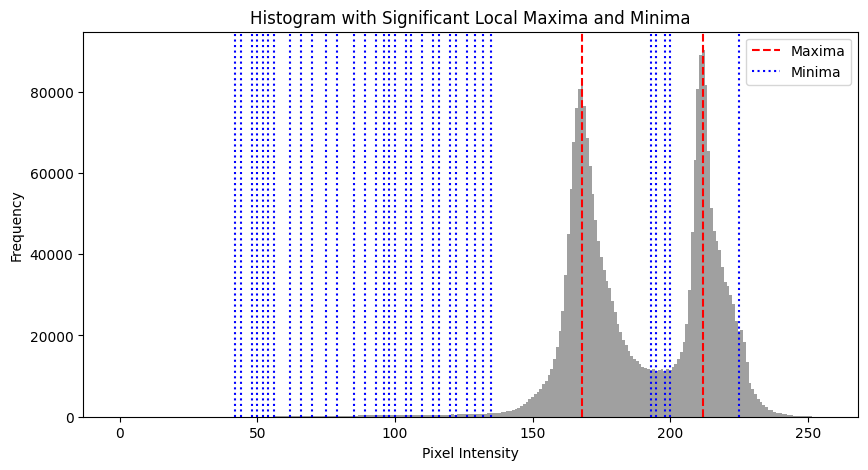

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7831.jpg
Significant maxima indices: [163 209]
Intensity values of significant maxima: [163. 209.]
Frequencies of significant maxima: [74512 66312]
Significant minima indices: [ 37  43  54  56  59  77  79  83  85  90  92  94  96  98 100 102 104 106
 109 111 113 116 119 123 125 127 130 187 192 195 208 240 245]
Intensity values of significant minima: [ 37.  43.  54.  56.  59.  77.  79.  83.  85.  90.  92.  94.  96.  98.
 100. 102. 104. 106. 109. 111. 113. 116. 119. 123. 125. 127. 130. 187.
 192. 195. 208. 240. 245.]
Frequencies of significant minima: [    1     2    22    24    26   440   517   580   628   731   764   767
   798   773   733   753   706   671   659   613   594   556   513   513
   505   553   659 13930 13005 12746 60602     6     0]


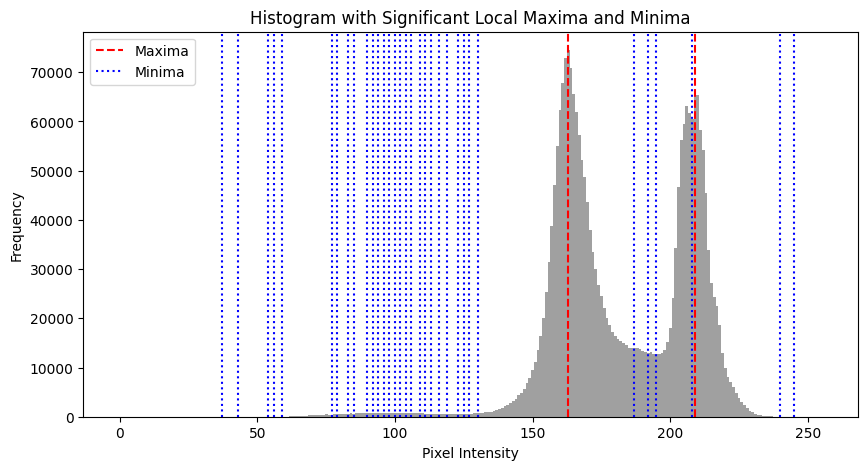

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7832.jpg
Significant maxima indices: [171 218]
Intensity values of significant maxima: [171. 218.]
Frequencies of significant maxima: [43374 56853]
Significant minima indices: [ 53  55  58  63  66  71  79  86  96 102 106 109 116 121 127 129 132 134
 137 140 193 197 199 201 203 207 250]
Intensity values of significant minima: [ 53.  55.  58.  63.  66.  71.  79.  86.  96. 102. 106. 109. 116. 121.
 127. 129. 132. 134. 137. 140. 193. 197. 199. 201. 203. 207. 250.]
Frequencies of significant minima: [   0    1    5   30   45   96  216  566 1153 1007  803  687  373  306
  259  270  265  272  336  377 5889 5529 5417 5246 5368 5692   14]


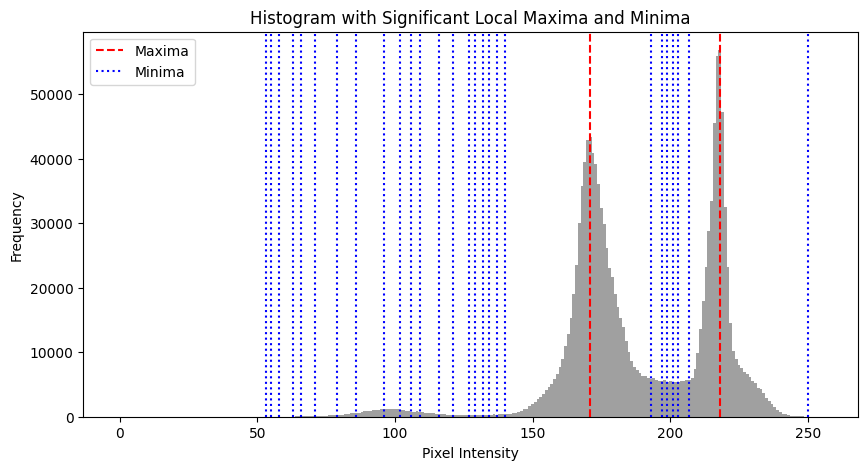

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7833.jpg
Significant maxima indices: [170 211]
Intensity values of significant maxima: [170. 211.]
Frequencies of significant maxima: [36584 64799]
Significant minima indices: [ 43  50  53  55  57  60  63  66  68  77  81  84  86  98 101 104 108 113
 119 122 124 127 132 137 142 184 190 196 198]
Intensity values of significant minima: [ 43.  50.  53.  55.  57.  60.  63.  66.  68.  77.  81.  84.  86.  98.
 101. 104. 108. 113. 119. 122. 124. 127. 132. 137. 142. 184. 190. 196.
 198.]
Frequencies of significant minima: [   1   11   22   25   24   33   34   22   29   85  129  149  170  630
  594  510  408  367  260  229  210  205  211  241  434 8055 6484 5953
 5864]


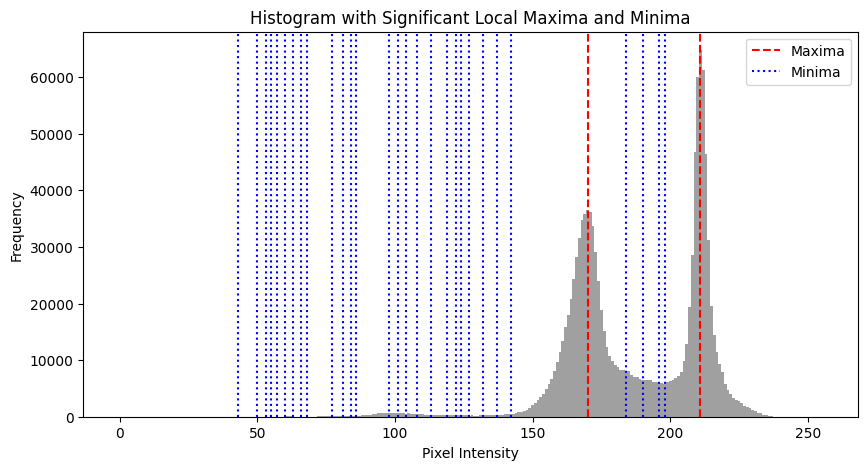

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7834.jpg
Significant maxima indices: [179 220]
Intensity values of significant maxima: [179. 220.]
Frequencies of significant maxima: [50488 71654]
Significant minima indices: [ 83  91  98 102 105 108 118 122 139 144 148 209 212 222]
Intensity values of significant minima: [ 83.  91.  98. 102. 105. 108. 118. 122. 139. 144. 148. 209. 212. 222.]
Frequencies of significant minima: [    0    13    44    56   108   122  1021  1119   739   599   565  8591
  8266 48044]


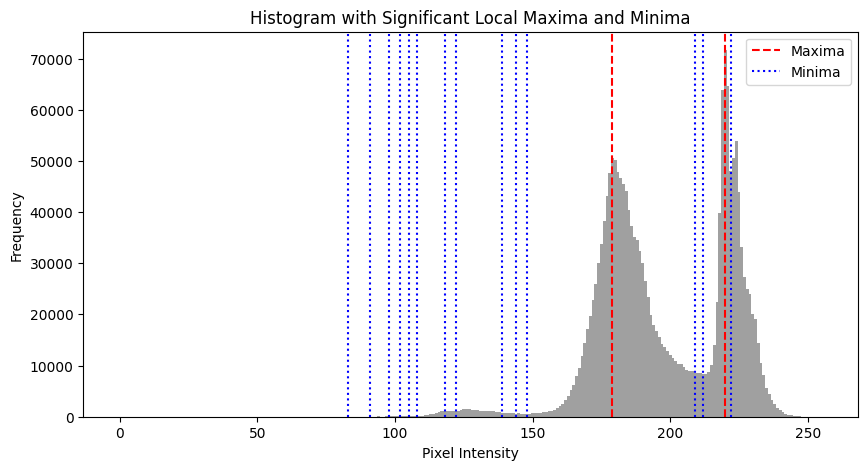

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7835.jpg
Significant maxima indices: [174 212]
Intensity values of significant maxima: [174. 212.]
Frequencies of significant maxima: [58654 77151]
Significant minima indices: [ 59  62  66  73  80  82  87  92  94  97 100 106 109 111 113 117 131 133
 136 138 140 145 199 202]
Intensity values of significant minima: [ 59.  62.  66.  73.  80.  82.  87.  92.  94.  97. 100. 106. 109. 111.
 113. 117. 131. 133. 136. 138. 140. 145. 199. 202.]
Frequencies of significant minima: [    4     6    10    77   159   210   268   257   257   277   360   623
   675   705   782   925   415   386   391   379   380   420 12503 12031]


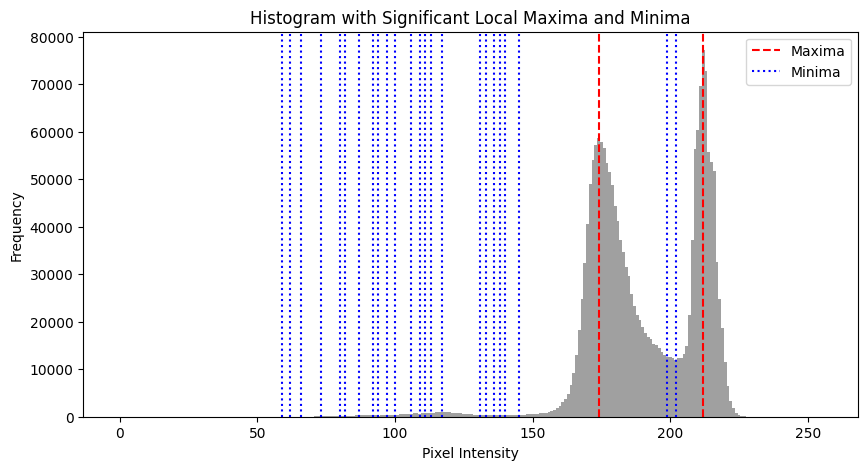

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7836.jpg
Significant maxima indices: [182 219 232]
Intensity values of significant maxima: [182. 219. 232.]
Frequencies of significant maxima: [44154 55493 34928]
Significant minima indices: [ 74  77  88  95  99 109 113 115 118 126 130 132 136 138 140 144 146 206
 208 210 221 227 230]
Intensity values of significant minima: [ 74.  77.  88.  95.  99. 109. 113. 115. 118. 126. 130. 132. 136. 138.
 140. 144. 146. 206. 208. 210. 221. 227. 230.]
Frequencies of significant minima: [    0     0    19    78   145   447   611   661   712   689   593   537
   490   525   488   453   427  5191  5287  5413 47083 22731 20374]


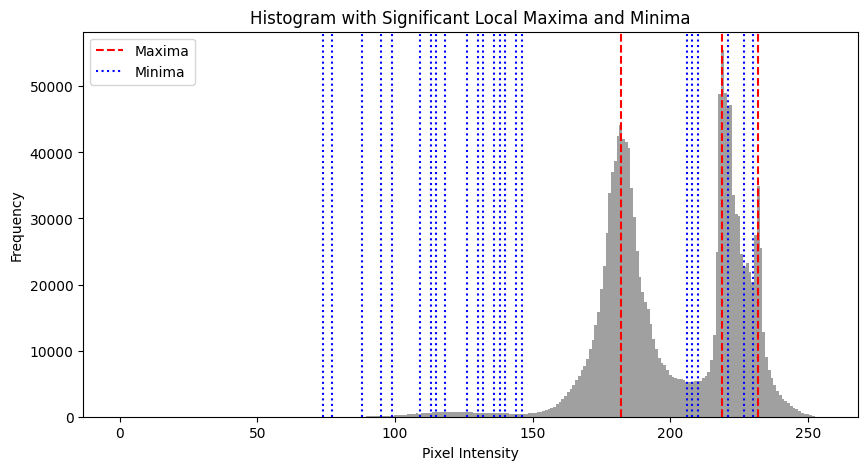

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7837.jpg
Significant maxima indices: [179 219]
Intensity values of significant maxima: [179. 219.]
Frequencies of significant maxima: [72246 64389]
Significant minima indices: [ 57  60  64  66  71  75  86  88  97 101 104 108 110 113 117 120 124 126
 132 135 137 141 145 148 152 206 209 249]
Intensity values of significant minima: [ 57.  60.  64.  66.  71.  75.  86.  88.  97. 101. 104. 108. 110. 113.
 117. 120. 124. 126. 132. 135. 137. 141. 145. 148. 152. 206. 209. 249.]
Frequencies of significant minima: [   0    2    9    8   43   81  264  289  758  700  631  592  577  502
  444  425  348  310  239  225  226  219  261  289  314 8854 8699    3]


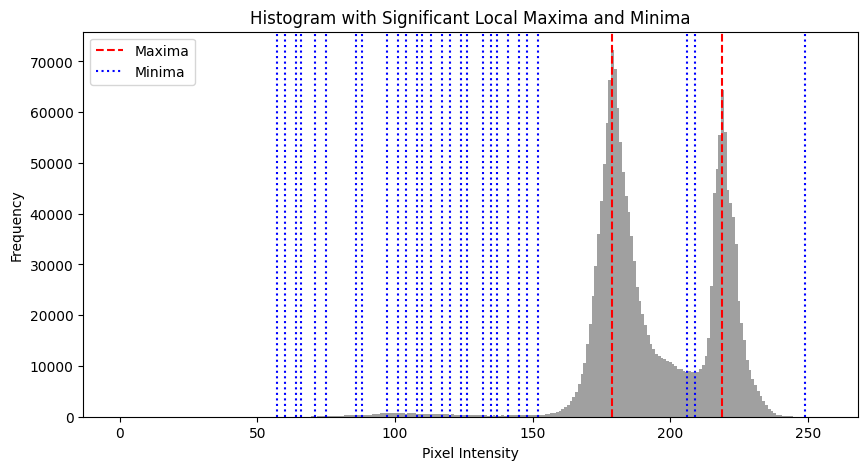

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7838.jpg
Significant maxima indices: [171 217]
Intensity values of significant maxima: [171. 217.]
Frequencies of significant maxima: [47222 43390]
Significant minima indices: [ 55  68  71  77  80  92  95  98 101 106 123 130 132 135 201 242 246]
Intensity values of significant minima: [ 55.  68.  71.  77.  80.  92.  95.  98. 101. 106. 123. 130. 132. 135.
 201. 242. 246.]
Frequencies of significant minima: [   4   88  134  207  241  631  575  676  816  954  408  317  314  282
 5984   10    0]


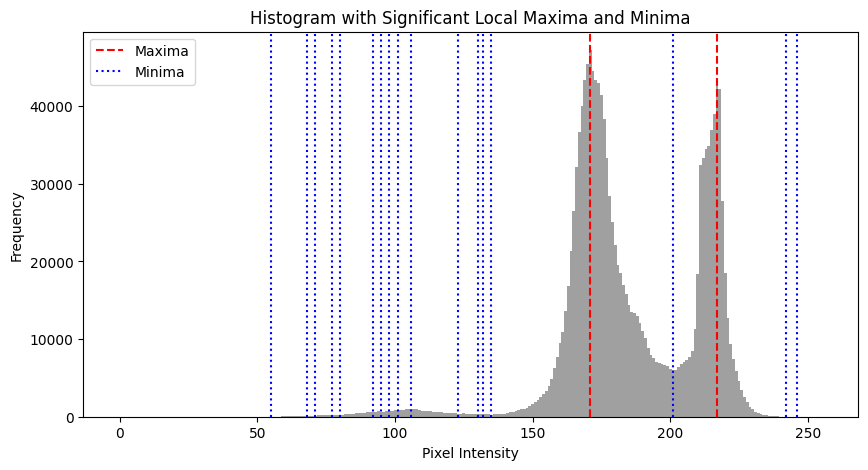

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7839.jpg
Significant maxima indices: [171 219]
Intensity values of significant maxima: [171. 219.]
Frequencies of significant maxima: [45296 52914]
Significant minima indices: [ 54  57  72  74  77  80  83  85  88  97 100 102 105 108 111 116 119 125
 127 131 137 188 190 195 199 203 207]
Intensity values of significant minima: [ 54.  57.  72.  74.  77.  80.  83.  85.  88.  97. 100. 102. 105. 108.
 111. 116. 119. 125. 127. 131. 137. 188. 190. 195. 199. 203. 207.]
Frequencies of significant minima: [  37   49  422  489  485  495  430  437  427  470  475  471  432  435
  460  382  347  339  298  273  338 6518 6146 5639 5319 4452 4261]


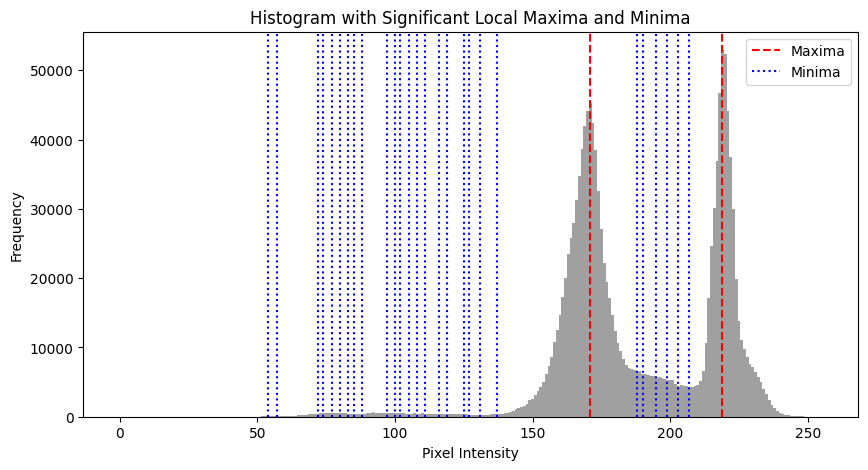

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7840.jpg
Significant maxima indices: [178 209]
Intensity values of significant maxima: [178. 209.]
Frequencies of significant maxima: [ 59801 145400]
Significant minima indices: [ 59  66  68  70  73  77  79  98 102 105 108 111 118 122 126 129 131 133
 136 139 141 145 149 196 198 202 204 212 219]
Intensity values of significant minima: [ 59.  66.  68.  70.  73.  77.  79.  98. 102. 105. 108. 111. 118. 122.
 126. 129. 131. 133. 136. 139. 141. 145. 149. 196. 198. 202. 204. 212.
 219.]
Frequencies of significant minima: [    0     8     7     9    11    21    35   946   920   863   883   904
   542   453   329   282   246   223   221   215   232   264   300 20864
 20806 20974 21271 94018 26508]


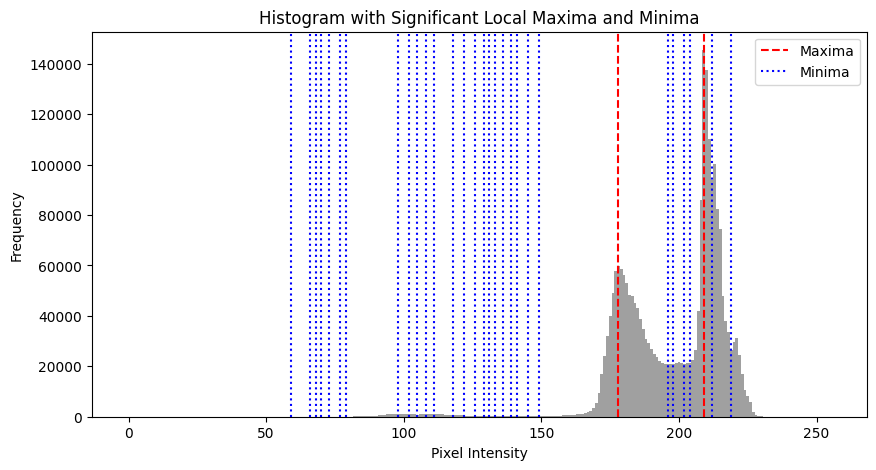

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7842.jpg
Significant maxima indices: [185 218]
Intensity values of significant maxima: [185. 218.]
Frequencies of significant maxima: [ 48512 153902]
Significant minima indices: [ 73  75  79  92  95  97  99 107 110 116 119 123 127 131 133 138 143 145
 147 150 154 156 161 164 194 197 202 206 208 233]
Intensity values of significant minima: [ 73.  75.  79.  92.  95.  97.  99. 107. 110. 116. 119. 123. 127. 131.
 133. 138. 143. 145. 147. 150. 154. 156. 161. 164. 194. 197. 202. 206.
 208. 233.]
Frequencies of significant minima: [   2    3   10  374  385  436  504  341  338  344  308  254  213  139
  144  125  114  127  136  151  205  218  270  307 8164 8269 8530 7838
 7549    8]


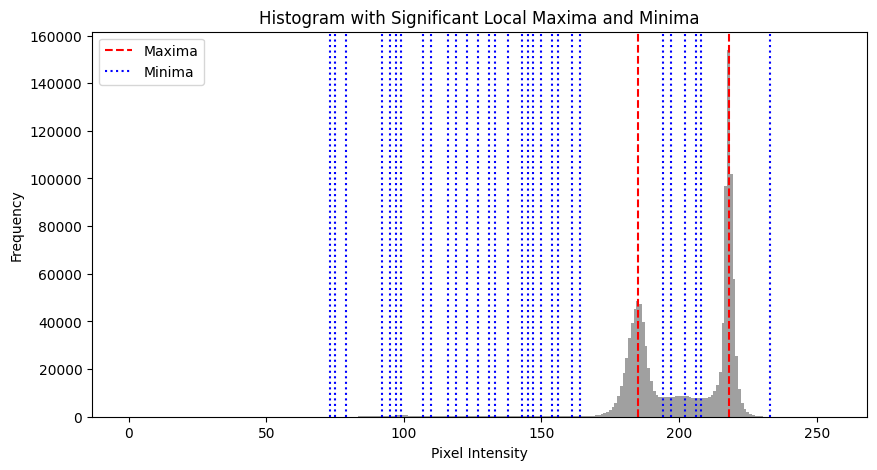

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7844.jpg
Significant maxima indices: [170 219]
Intensity values of significant maxima: [170. 219.]
Frequencies of significant maxima: [ 36077 107551]
Significant minima indices: [ 61  65  73  76  78  82  87 101 103 106 109 112 115 124 129 133 135 140
 142 147 194 200 202 207 242]
Intensity values of significant minima: [ 61.  65.  73.  76.  78.  82.  87. 101. 103. 106. 109. 112. 115. 124.
 129. 133. 135. 140. 142. 147. 194. 200. 202. 207. 242.]
Frequencies of significant minima: [   1    2   13   13   32   32   61  355  395  472  495  519  595  463
  351  333  310  306  339  381 9824 8710 8811 8831    8]


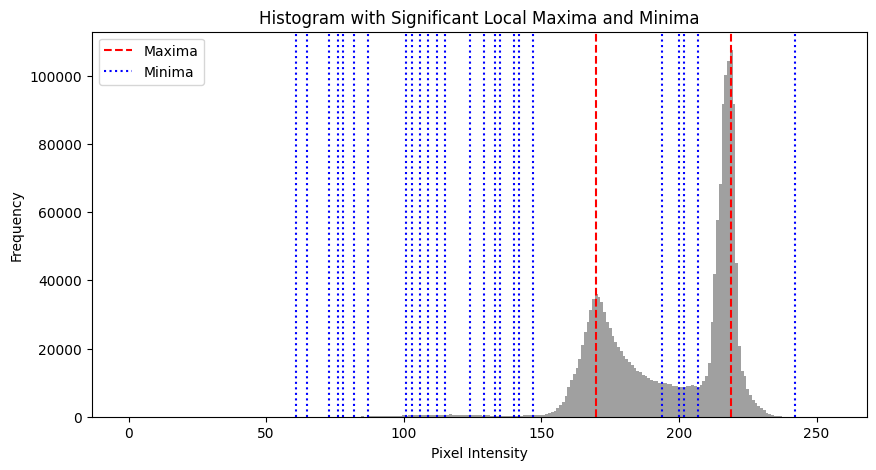

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7845.jpg
Significant maxima indices: [174 215]
Intensity values of significant maxima: [174. 215.]
Frequencies of significant maxima: [ 47781 105487]
Significant minima indices: [ 67  80  83  86  88  90  94 105 112 117 120 123 131 133 135 141 143 145
 147 149 151 201 204 213 219 221 239]
Intensity values of significant minima: [ 67.  80.  83.  86.  88.  90.  94. 105. 112. 117. 120. 123. 131. 133.
 135. 141. 143. 145. 147. 149. 151. 201. 204. 213. 219. 221. 239.]
Frequencies of significant minima: [    0    23    30    26    21    26    37   382   573   528   488   485
   321   333   338   300   304   303   352   357   380 10044 10091 75684
 38526 41733     4]


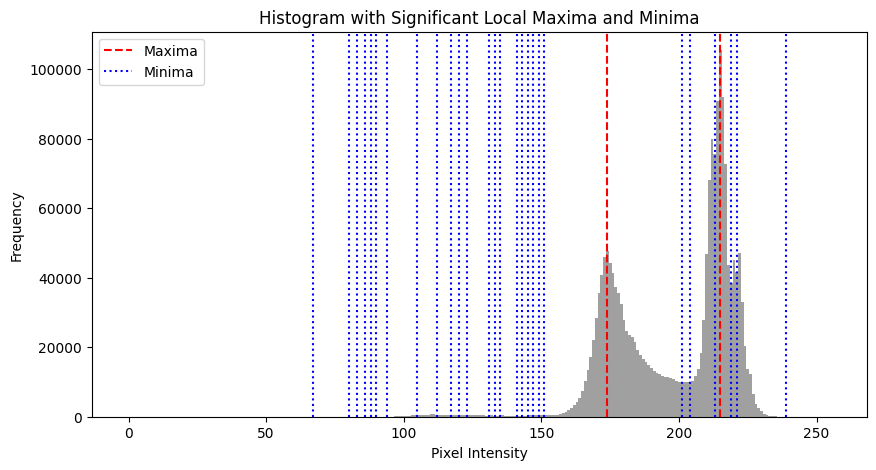

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7846.jpg
Significant maxima indices: [165 214]
Intensity values of significant maxima: [165. 214.]
Frequencies of significant maxima: [ 47313 127655]
Significant minima indices: [ 56  61  63  67  71  87  91  94 101 105 109 112 114 117 119 122 124 126
 129 134 136 140 193 199 201]
Intensity values of significant minima: [ 56.  61.  63.  67.  71.  87.  91.  94. 101. 105. 109. 112. 114. 117.
 119. 122. 124. 126. 129. 134. 136. 140. 193. 199. 201.]
Frequencies of significant minima: [   0    6   13   19   48  400  495  519  539  493  428  426  414  381
  387  381  361  361  335  359  395  436 9793 9389 9878]


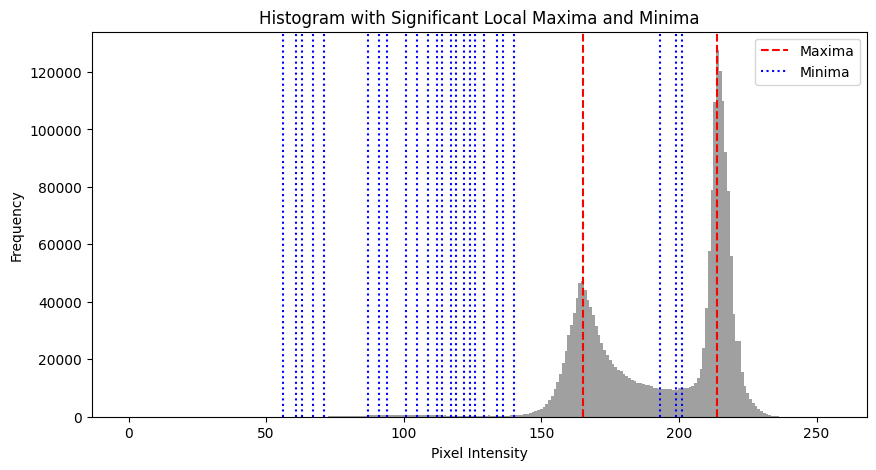

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7847.jpg
Significant maxima indices: [165 217]
Intensity values of significant maxima: [165. 217.]
Frequencies of significant maxima: [ 39612 100716]
Significant minima indices: [ 32  34  37  39  42  44  46  48  50  53  58  60  74  81  83  97  99 101
 108 111 115 118 121 124 127 130 132 134 137 142 198 202 204]
Intensity values of significant minima: [ 32.  34.  37.  39.  42.  44.  46.  48.  50.  53.  58.  60.  74.  81.
  83.  97.  99. 101. 108. 111. 115. 118. 121. 124. 127. 130. 132. 134.
 137. 142. 198. 202. 204.]
Frequencies of significant minima: [   1    0    4    4   19   30   37   38   39   45   50   60  283  568
  645  815  776  761  610  530  408  369  369  371  323  330  332  334
  353  452 7484 7480 7382]


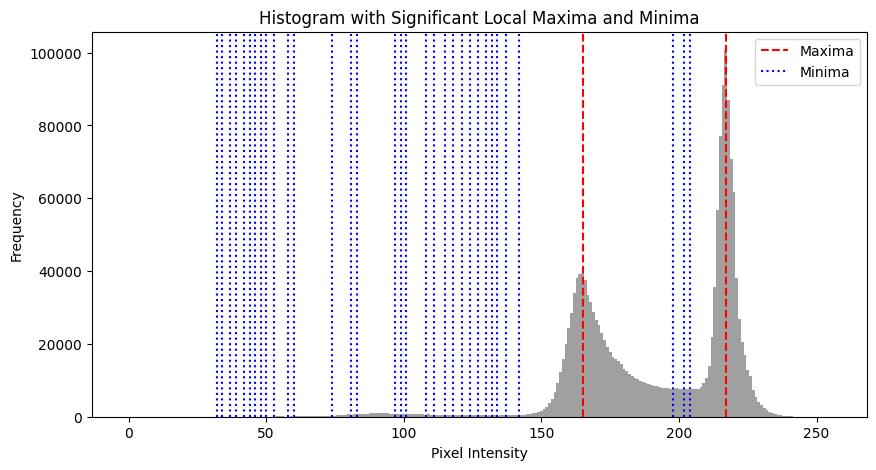

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7848.jpg
Significant maxima indices: [185 216 220]
Intensity values of significant maxima: [185. 216. 220.]
Frequencies of significant maxima: [ 55971 118019 112634]
Significant minima indices: [ 73  75  79  82  89  91 109 113 115 118 120 123 129 135 138 140 144 147
 149 152 158 161 205 218 233]
Intensity values of significant minima: [ 73.  75.  79.  82.  89.  91. 109. 113. 115. 118. 120. 123. 129. 135.
 138. 140. 144. 147. 149. 152. 158. 161. 205. 218. 233.]
Frequencies of significant minima: [    1     5     8     8    29    43   423   515   530   593   621   590
   441   355   302   276   280   288   304   321   384   452 10504 89827
    96]


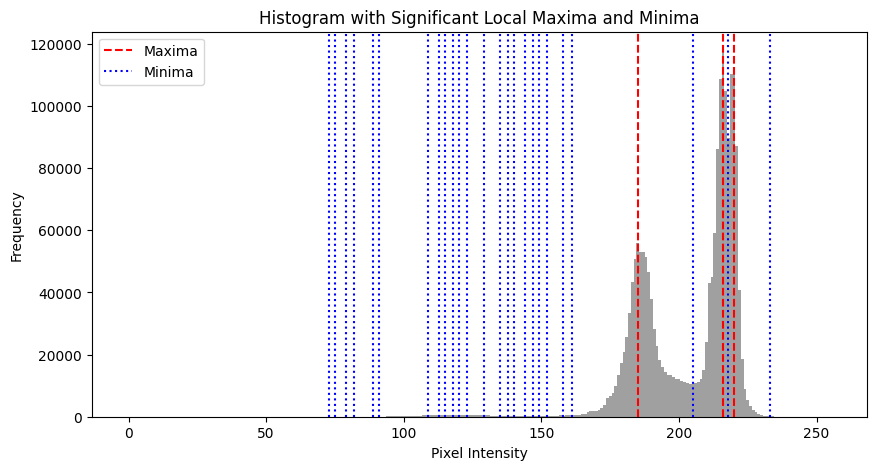

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7849.jpg
Significant maxima indices: [169 219]
Intensity values of significant maxima: [169. 219.]
Frequencies of significant maxima: [23566 82422]
Significant minima indices: [ 75  78  81  84  88  93 104 108 110 119 121 123 127 130 132 137 141 201
 204 217]
Intensity values of significant minima: [ 75.  78.  81.  84.  88.  93. 104. 108. 110. 119. 121. 123. 127. 130.
 132. 137. 141. 201. 204. 217.]
Frequencies of significant minima: [    0     1     4    13    38    60   593   488   554   306   287   256
   242   222   187   215   226  7526  7530 63226]


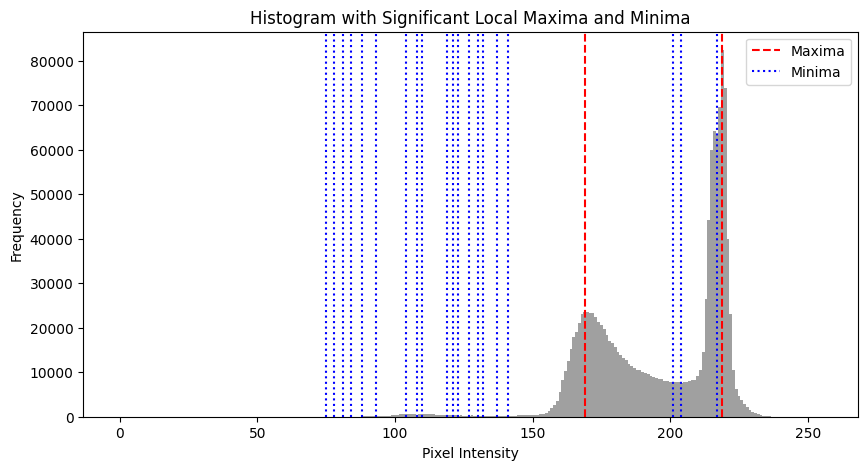

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Mononucleosis\IMG_7850.jpg
Significant maxima indices: [159 218]
Intensity values of significant maxima: [159. 218.]
Frequencies of significant maxima: [ 30809 114442]
Significant minima indices: [ 31  43  46  49  60  63  66  68  78  81  86  91  94  96 100 103 105 107
 111 115 118 120 125 127 129 134 158 192 194 197 203 246]
Intensity values of significant minima: [ 31.  43.  46.  49.  60.  63.  66.  68.  78.  81.  86.  91.  94.  96.
 100. 103. 105. 107. 111. 115. 118. 120. 125. 127. 129. 134. 158. 192.
 194. 197. 203. 246.]
Frequencies of significant minima: [    4   276   255   255   604   647   681   680   603   520   419   383
   399   336   297   278   280   258   286   309   315   316   386   406
   465   508 30757  9768  9771  9329  9308     6]


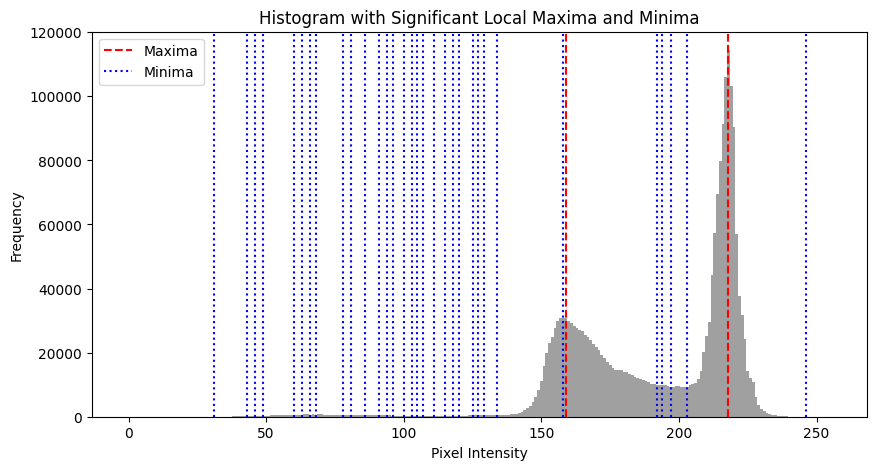

In [194]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in monoclueosis:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()


Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7806.jpg
Significant maxima indices: [172 207]
Intensity values of significant maxima: [172. 207.]
Frequencies of significant maxima: [42060 90853]
Significant minima indices: [ 37  43  49  53  60  63  67  95 105 117 122 127 130 132 136 139 142 146
 151 175 193 210 214 220 247 249]
Intensity values of significant minima: [ 37.  43.  49.  53.  60.  63.  67.  95. 105. 117. 122. 127. 130. 132.
 136. 139. 142. 146. 151. 175. 193. 210. 214. 220. 247. 249.]
Frequencies of significant minima: [    1    51   158   195   106    87   162  3328  2470  1367  1158   999
   888   893   869   808   898  1116  1584 39893 23355 78524 74940 36902
    29    22]


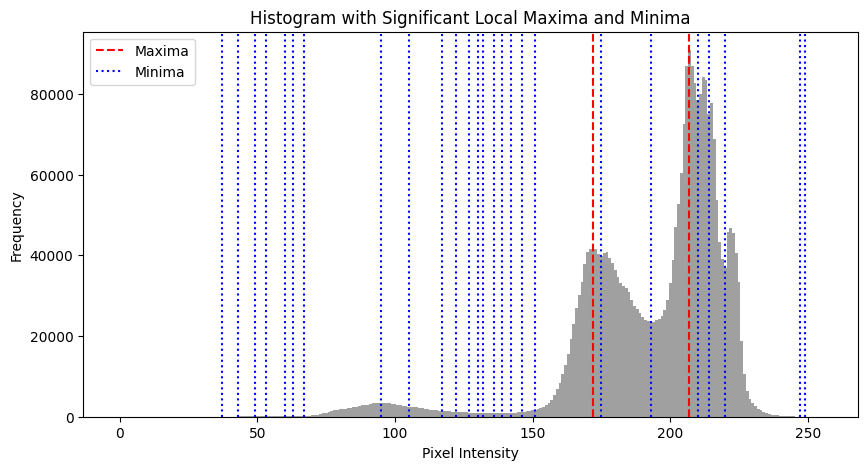

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7807.jpg
Significant maxima indices: [173 212]
Intensity values of significant maxima: [173. 212.]
Frequencies of significant maxima: [ 49944 185830]
Significant minima indices: [ 31  43  57  59  76  82  91  95 103 106 113 115 118 121 126 129 131 135
 141 144 148 190 193 199 241]
Intensity values of significant minima: [ 31.  43.  57.  59.  76.  82.  91.  95. 103. 106. 113. 115. 118. 121.
 126. 129. 131. 135. 141. 144. 148. 190. 193. 199. 241.]
Frequencies of significant minima: [    0   135   614   686  2391  2026  1189   946   650   619   654   695
   751   730   806   803   756   763   899   924  1086 23614 22811 24227
    43]


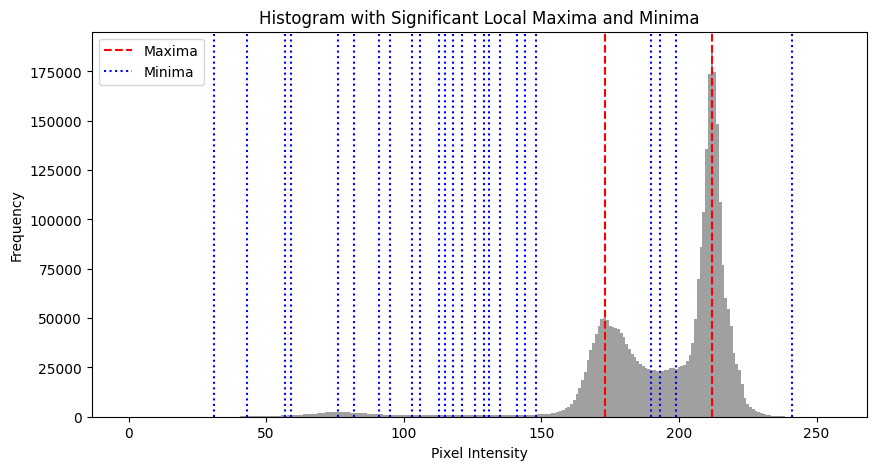

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7808.jpg
Significant maxima indices: [178 215]
Intensity values of significant maxima: [178. 215.]
Frequencies of significant maxima: [ 51969 211270]
Significant minima indices: [ 55  60  89  91  93  95 103 111 113 116 118 122 128 130 133 136 138 148
 177 192 194 228 246]
Intensity values of significant minima: [ 55.  60.  89.  91.  93.  95. 103. 111. 113. 116. 118. 122. 128. 130.
 133. 136. 138. 148. 177. 192. 194. 228. 246.]
Frequencies of significant minima: [  128    63  2703  3002  2938  2776  1710  1122  1108  1078   936   819
   820   851   811   941  1146  1546 50840 18506 18650 10338    15]


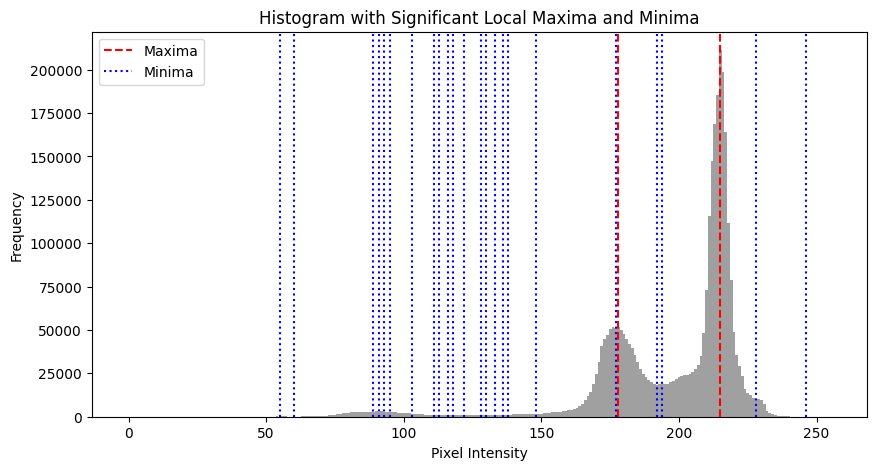

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7810.jpg
Significant maxima indices: [170 226]
Intensity values of significant maxima: [170. 226.]
Frequencies of significant maxima: [ 52210 165720]
Significant minima indices: [ 42  44  47  49  52  75  81  84 100 103 109 117 119 122 124 126 128 134
 138 193 206 208]
Intensity values of significant minima: [ 42.  44.  47.  49.  52.  75.  81.  84. 100. 103. 109. 117. 119. 122.
 124. 126. 128. 134. 138. 193. 206. 208.]
Frequencies of significant minima: [    1     1    12    31    84  4126  4076  3699  1548  1319  1029   766
   766   731   729   699   658   855   895 17130 21252 21800]


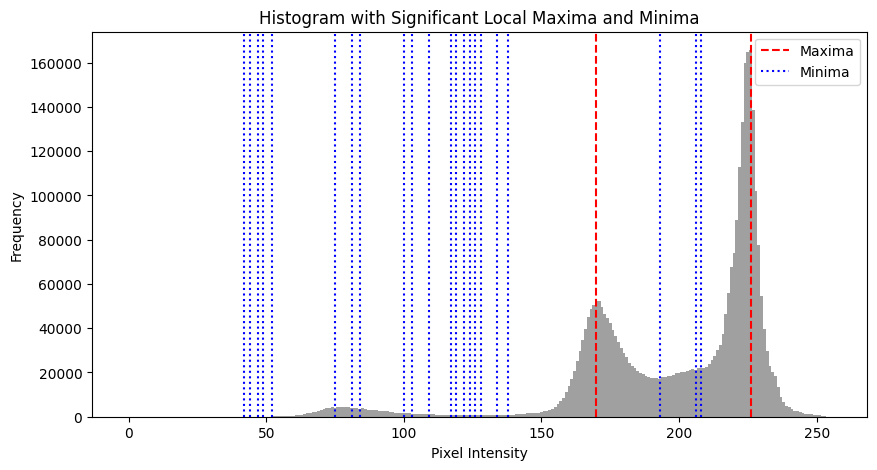

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7812.jpg
Significant maxima indices: [173 212]
Intensity values of significant maxima: [173. 212.]
Frequencies of significant maxima: [ 46158 168369]
Significant minima indices: [ 72  76  84  86  90 100 106 111 113 115 119 122 125 127 129 133 137 140
 143 186 204 240 244 246 248]
Intensity values of significant minima: [ 72.  76.  84.  86.  90. 100. 106. 111. 113. 115. 119. 122. 125. 127.
 129. 133. 137. 140. 143. 186. 204. 240. 244. 246. 248.]
Frequencies of significant minima: [ 1824  1588  1301  1308  1369   722   593   533   555   545   561   535
   538   561   573   619   705   770   815 22925 34892     2     3     0
     0]


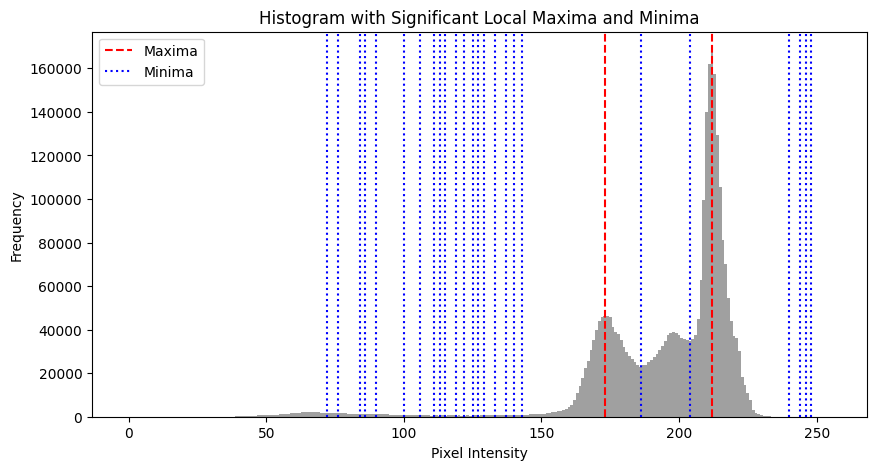

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7813.jpg
Significant maxima indices: [165 213]
Intensity values of significant maxima: [165. 213.]
Frequencies of significant maxima: [ 71862 116003]
Significant minima indices: [ 16  20  41  49  52  56  67  72  74  78  80  83  87  90  92  94  97  99
 101 103 107 111 113 115 119 123 125 127 130 190 194 197 200 202 223 250]
Intensity values of significant minima: [ 16.  20.  41.  49.  52.  56.  67.  72.  74.  78.  80.  83.  87.  90.
  92.  94.  97.  99. 101. 103. 107. 111. 113. 115. 119. 123. 125. 127.
 130. 190. 194. 197. 200. 202. 223. 250.]
Frequencies of significant minima: [    0     1   523   887   920  1079  1060   937   911   828   787   804
   819   795   742   721   674   651   633   593   618   592   534   517
   491   520   544   515   627 22165 21503 21132 20673 20584 19218     1]


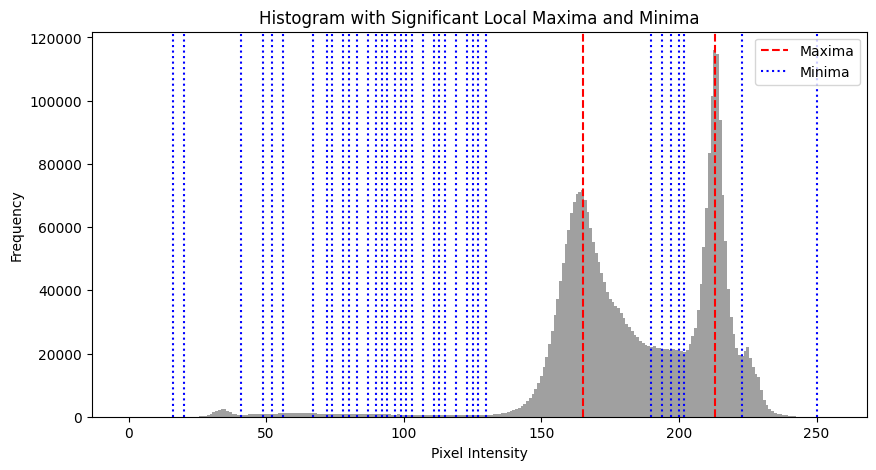

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7814.jpg
Significant maxima indices: [167 220]
Intensity values of significant maxima: [167. 220.]
Frequencies of significant maxima: [39514 46730]
Significant minima indices: [ 34  53  58  60  62  64  71  73  75  79  82  87  90  93 102 104 106 111
 116 119 122 124 127 198 200 203]
Intensity values of significant minima: [ 34.  53.  58.  60.  62.  64.  71.  73.  75.  79.  82.  87.  90.  93.
 102. 104. 106. 111. 116. 119. 122. 124. 127. 198. 200. 203.]
Frequencies of significant minima: [   0  455  542  563  536  598  527  468  444  403  349  295  270  187
  117  105  114  132  172  189  200  179  249 5908 5794 6049]


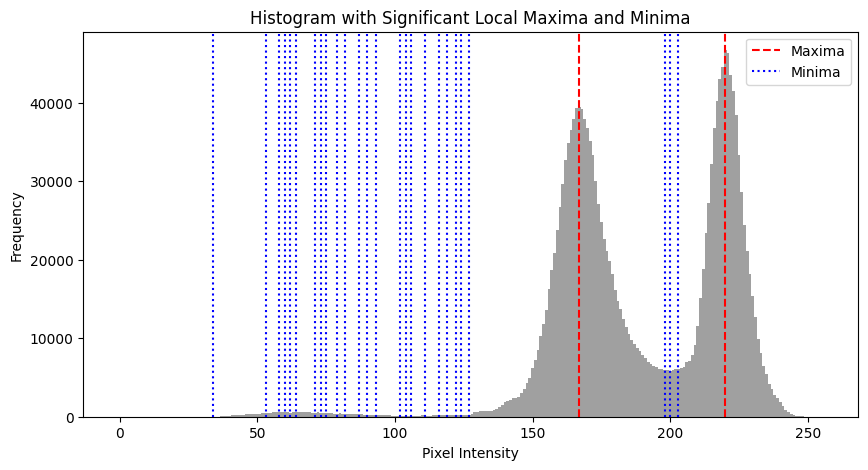

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7815.jpg
Significant maxima indices: [163 217]
Intensity values of significant maxima: [163. 217.]
Frequencies of significant maxima: [45778 63872]
Significant minima indices: [ 30  47  49  51  53  55  58  64  67  69  72  79  81  85  89  92  94  96
  98 103 107 113 118 121 129 189 191 197 202 204 215 238 243]
Intensity values of significant minima: [ 30.  47.  49.  51.  53.  55.  58.  64.  67.  69.  72.  79.  81.  85.
  89.  92.  94.  96.  98. 103. 107. 113. 118. 121. 129. 189. 191. 197.
 202. 204. 215. 238. 243.]
Frequencies of significant minima: [    8   425   436   370   384   373   414   382   365   382   426   379
   382   314   307   283   298   302   336   343   341   423   423   449
   590 14215 14154 14887 14029 13652 58647    79    32]


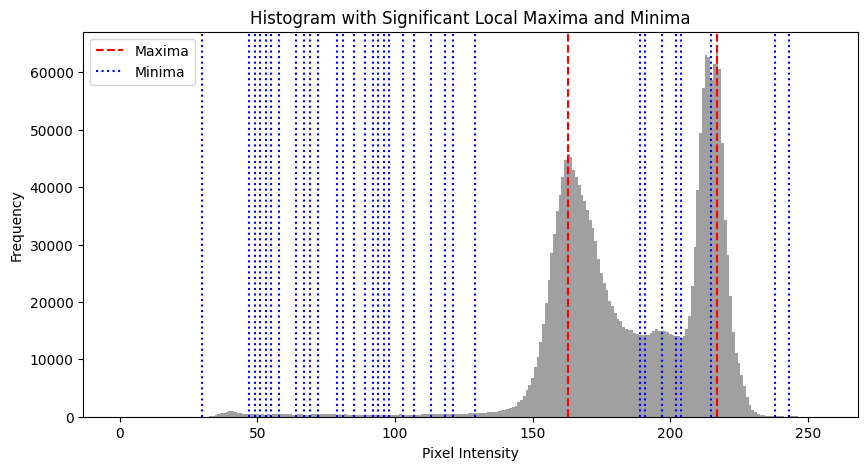

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7816.jpg
Significant maxima indices: [162 212]
Intensity values of significant maxima: [162. 212.]
Frequencies of significant maxima: [43898 66065]
Significant minima indices: [ 56  60  63  67  69  72  74  76  78  82  85  89  92  96 100 104 110 114
 118 120 123 125 129 132 164 196 198 200 222]
Intensity values of significant minima: [ 56.  60.  63.  67.  69.  72.  74.  76.  78.  82.  85.  89.  92.  96.
 100. 104. 110. 114. 118. 120. 123. 125. 129. 132. 164. 196. 198. 200.
 222.]
Frequencies of significant minima: [  394   599   726   897  1028  1090  1133  1209  1383  1282  1239  1176
  1143  1114  1025   805   701   648   577   561   574   581   676   764
 41211 13617 13374 13625 38618]


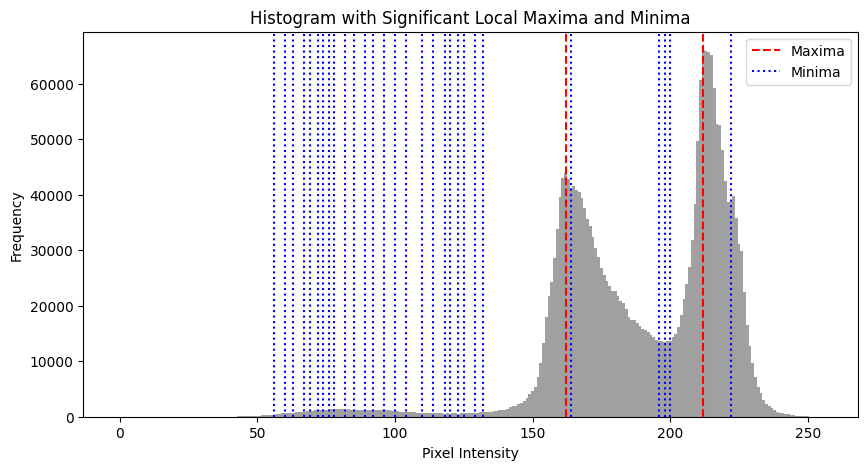

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7817.jpg
Significant maxima indices: [163 214]
Intensity values of significant maxima: [163. 214.]
Frequencies of significant maxima: [43879 96571]
Significant minima indices: [ 38  41  46  49  51  53  55  58  60  78  81  86  91  94  98 107 109 112
 114 116 122 131 135 165 181 192 194 201 248]
Intensity values of significant minima: [ 38.  41.  46.  49.  51.  53.  55.  58.  60.  78.  81.  86.  91.  94.
  98. 107. 109. 112. 114. 116. 122. 131. 135. 165. 181. 192. 194. 201.
 248.]
Frequencies of significant minima: [  102   148   193   219   202   159   156   215   170  1495  1441  1258
   873   677   490   307   271   235   219   224   265   324   373 43151
 21435 18614 18534 15708     1]


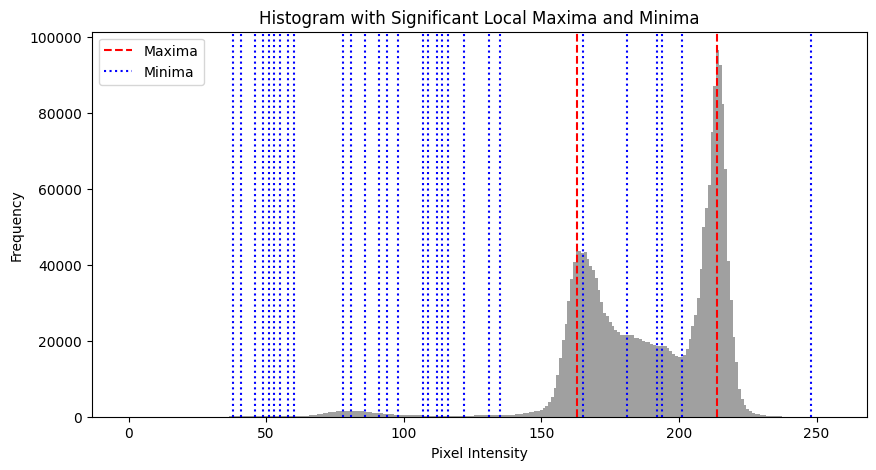

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7818.jpg
Significant maxima indices: [164 215]
Intensity values of significant maxima: [164. 215.]
Frequencies of significant maxima: [ 46884 128124]
Significant minima indices: [ 31  33  36  58  65  73  82  85  88  90  93  96 101 105 115 117 119 121
 124 127 129 193 195 198]
Intensity values of significant minima: [ 31.  33.  36.  58.  65.  73.  82.  85.  88.  90.  93.  96. 101. 105.
 115. 117. 119. 121. 124. 127. 129. 193. 195. 198.]
Frequencies of significant minima: [    1     7    14   306   479   678   649   640   599   591   503   469
   350   358   264   262   258   234   266   297   351 11426 11128 10735]


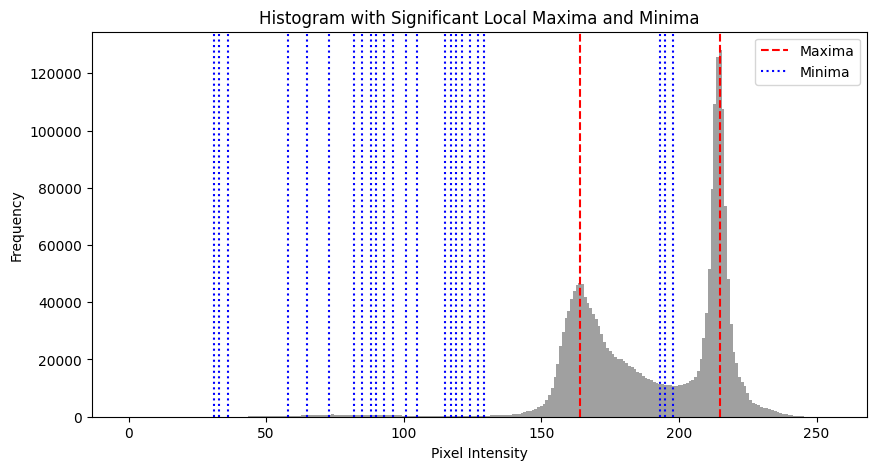

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7819.jpg
Significant maxima indices: [165 217]
Intensity values of significant maxima: [165. 217.]
Frequencies of significant maxima: [ 64722 117329]
Significant minima indices: [ 31  38  50  54  66  74  80  82  91  94  96  98 100 102 106 112 114 118
 120 123 200 203]
Intensity values of significant minima: [ 31.  38.  50.  54.  66.  74.  80.  82.  91.  94.  96.  98. 100. 102.
 106. 112. 114. 118. 120. 123. 200. 203.]
Frequencies of significant minima: [ 1073  3169  1807  1864  1343   989   764   692   505   459   409   406
   395   399   399   479   528   633   638   747 18541 18174]


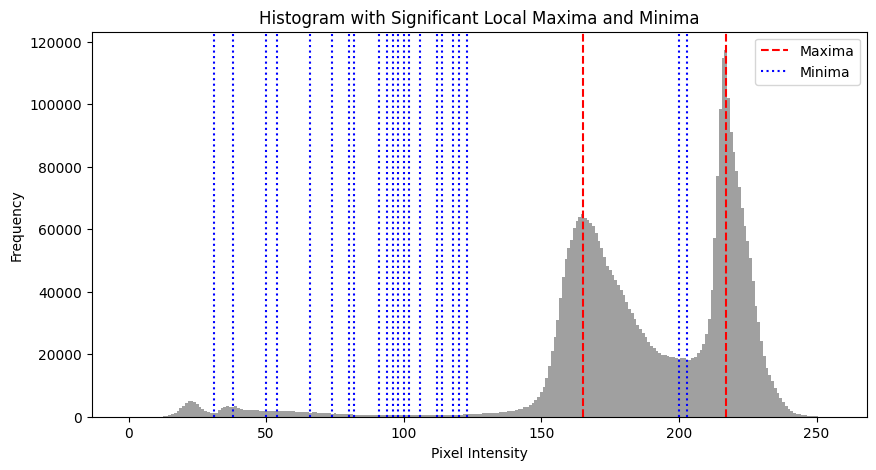

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7820.jpg
Significant maxima indices: [165 216]
Intensity values of significant maxima: [165. 216.]
Frequencies of significant maxima: [58904 95053]
Significant minima indices: [ 25  42  45  52  60  68  73  79  81  84  86  88  90  93  95  98 101 104
 108 110 115 124 130 200 202]
Intensity values of significant minima: [ 25.  42.  45.  52.  60.  68.  73.  79.  81.  84.  86.  88.  90.  93.
  95.  98. 101. 104. 108. 110. 115. 124. 130. 200. 202.]
Frequencies of significant minima: [   90  3079  2865  2316  1857  1276  1091   839   809   765   697   649
   624   587   613   588   600   559   587   657   799  1247  1282 15714
 15335]


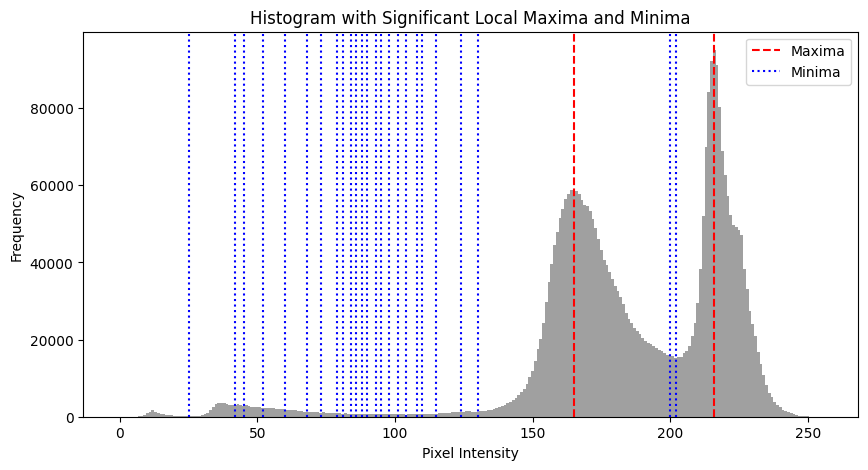

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7821.jpg
Significant maxima indices: [165 216]
Intensity values of significant maxima: [165. 216.]
Frequencies of significant maxima: [63265 83467]
Significant minima indices: [  3   6  25  28  47  53  55  57  61  63  66  70  72  75  77  81  83  86
  89  94  96  98 100 102 108 111 117 119 121 124 126 129 196 200 202]
Intensity values of significant minima: [  3.   6.  25.  28.  47.  53.  55.  57.  61.  63.  66.  70.  72.  75.
  77.  81.  83.  86.  89.  94.  96.  98. 100. 102. 108. 111. 117. 119.
 121. 124. 126. 129. 196. 200. 202.]
Frequencies of significant minima: [    0     1    47    55  1667  1578  1550  1430  1349  1280  1275  1204
  1156  1067  1032   924   909   841   796   716   711   696   650   623
   474   433   387   395   402   441   403   474 13436 12606 12602]


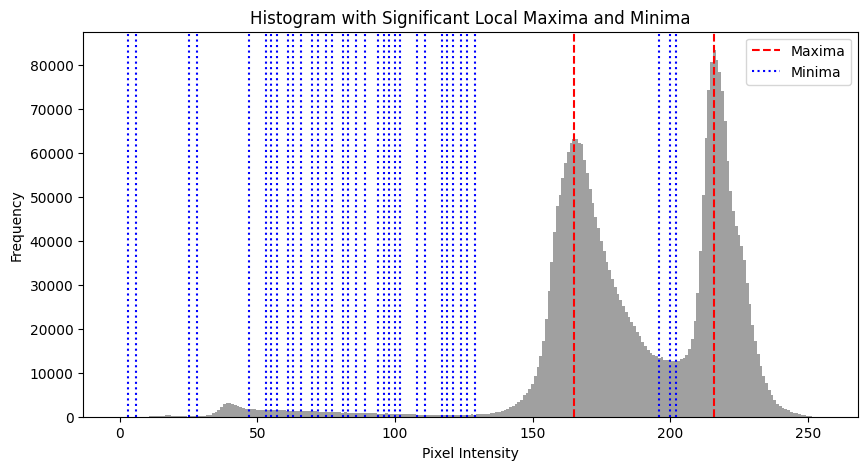

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7822.jpg
Significant maxima indices: [167 213]
Intensity values of significant maxima: [167. 213.]
Frequencies of significant maxima: [ 60814 119393]
Significant minima indices: [ 20  25  29  42  44  52  54  57  69  71  73  77  83  87  93  99 105 108
 112 115 128 140 201]
Intensity values of significant minima: [ 20.  25.  29.  42.  44.  52.  54.  57.  69.  71.  73.  77.  83.  87.
  93.  99. 105. 108. 112. 115. 128. 140. 201.]
Frequencies of significant minima: [    0     4    38  1876  1845  2291  2252  2234  1708  1709  1673  1619
  1601  1506  1074   878   686   699   729   741  1430  2431 16013]


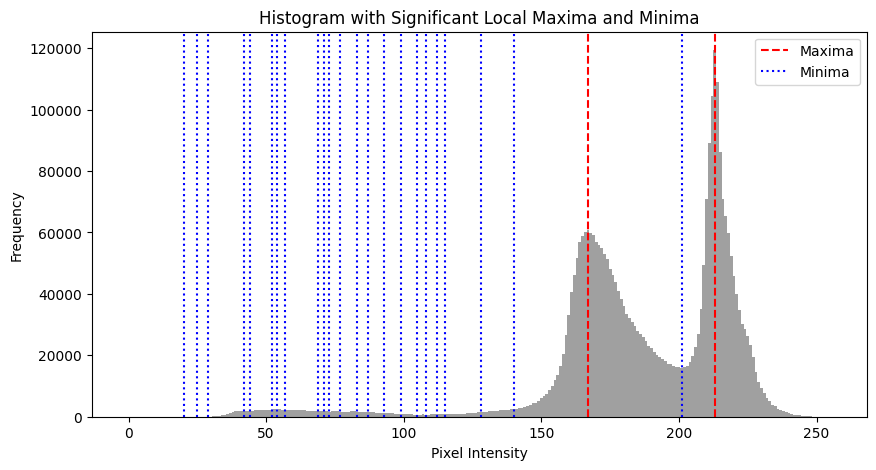

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7823.jpg
Significant maxima indices: [168 217 226]
Intensity values of significant maxima: [168. 217. 226.]
Frequencies of significant maxima: [ 53491 131125  49311]
Significant minima indices: [  6  10  29  47  56  58  65  71  75  80  83  86  89  91 110 113 115 117
 121 124 126 128 130 132 137 169 171 203 205 224]
Intensity values of significant minima: [  6.  10.  29.  47.  56.  58.  65.  71.  75.  80.  83.  86.  89.  91.
 110. 113. 115. 117. 121. 124. 126. 128. 130. 132. 137. 169. 171. 203.
 205. 224.]
Frequencies of significant minima: [   27    71    80  1035  1467  1511  1620  1557  1689  1585  1604  1743
  1723  1651   760   717   692   683   608   626   634   631   657   667
   876 51738 52047 20518 20420 36575]


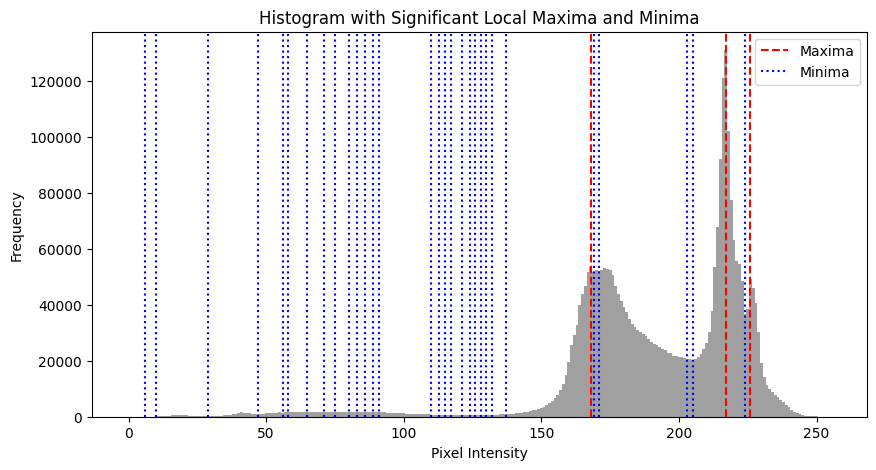

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7824.jpg
Significant maxima indices: [171 215]
Intensity values of significant maxima: [171. 215.]
Frequencies of significant maxima: [ 51346 112557]
Significant minima indices: [ 30  46  64  72  75  78  81  83  86  89  91  97 105 108 111 116 118 122
 126 131 133 136 140 144 173 193 197 207 222 241 246 248]
Intensity values of significant minima: [ 30.  46.  64.  72.  75.  78.  81.  83.  86.  89.  91.  97. 105. 108.
 111. 116. 118. 122. 126. 131. 133. 136. 140. 144. 173. 193. 197. 207.
 222. 241. 246. 248.]
Frequencies of significant minima: [    0   433  1010  1172  1208  1217  1179  1224  1216  1189  1162   946
   663   634   544   524   531   604   718   801   807   874   903   935
 48452 27692 26969 22125 41428    49     6     1]


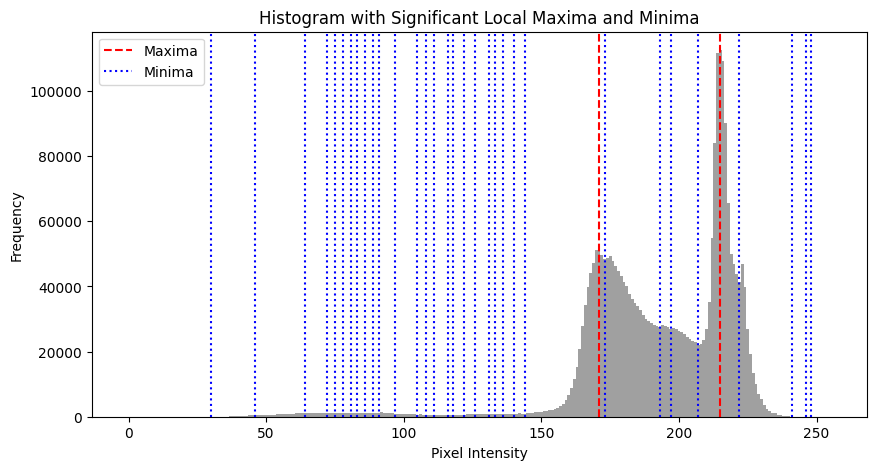

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7825.jpg
Significant maxima indices: [169 215]
Intensity values of significant maxima: [169. 215.]
Frequencies of significant maxima: [ 73050 114781]
Significant minima indices: [ 38  42  53  58  60  62  64  66  73  88  93  97 100 104 107 112 120 126
 201 218 250]
Intensity values of significant minima: [ 38.  42.  53.  58.  60.  62.  64.  66.  73.  88.  93.  97. 100. 104.
 107. 112. 120. 126. 201. 218. 250.]
Frequencies of significant minima: [  602   643  1156  1237  1252  1248  1287  1328  1557  1053   862   793
   744   665   628   620   904  1149 19644 73846    15]


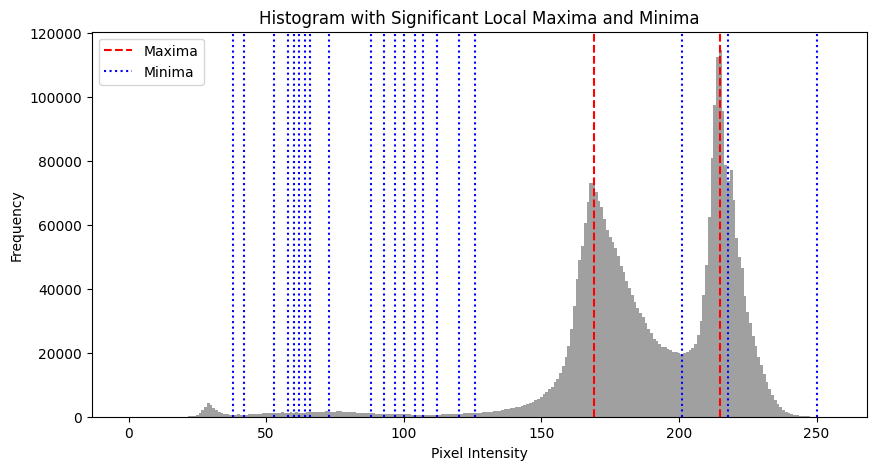

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7826.jpg
Significant maxima indices: [171 215]
Intensity values of significant maxima: [171. 215.]
Frequencies of significant maxima: [ 56296 119190]
Significant minima indices: [ 12  29  31  33  39  74  76  81  84 103 109 113 116 127 129 133 136 138
 141 145 181 193 195 205 225 243]
Intensity values of significant minima: [ 12.  29.  31.  33.  39.  74.  76.  81.  84. 103. 109. 113. 116. 127.
 129. 133. 136. 138. 141. 145. 181. 193. 195. 205. 225. 243.]
Frequencies of significant minima: [    0    23    14    11   124  2693  2665  2599  2502  1006   877   820
   845  1557  1642  1720  1775  1818  1783  1921 42308 35988 36069 29681
 24714    44]


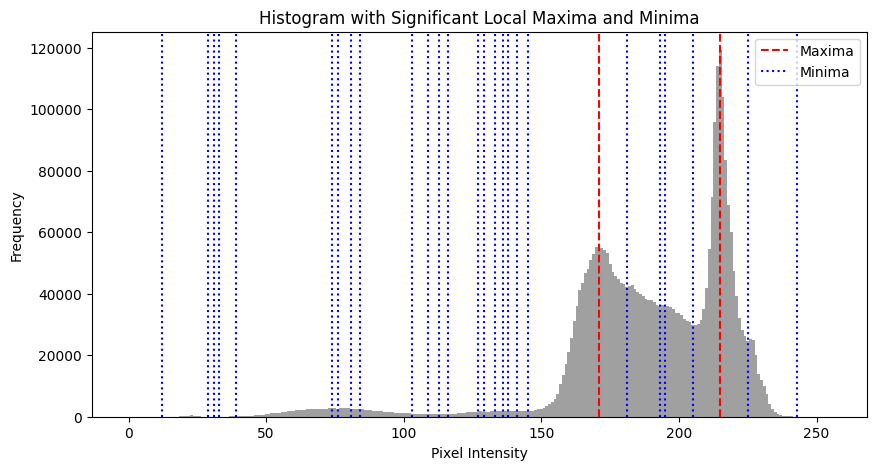

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7827.jpg
Significant maxima indices: [168 216]
Intensity values of significant maxima: [168. 216.]
Frequencies of significant maxima: [56387 88297]
Significant minima indices: [ 36  40  47  51  57  64  70  74  78  81  83  85  87  93  99 104 107 110
 116 118 120 131 134 137 142 189 200 220 251]
Intensity values of significant minima: [ 36.  40.  47.  51.  57.  64.  70.  74.  78.  81.  83.  85.  87.  93.
  99. 104. 107. 110. 116. 118. 120. 131. 134. 137. 142. 189. 200. 220.
 251.]
Frequencies of significant minima: [  144   271   724   994  1556  2120  2411  2290  2064  1970  1970  1984
  1800  1495  1270  1142  1146  1177  1298  1392  1485  2016  2022  1920
  1777 28670 25740 44119     1]


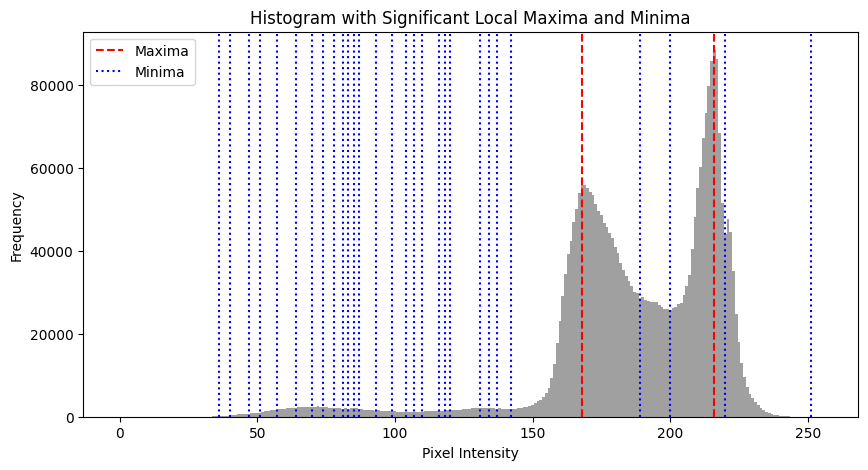

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7828.jpg
Significant maxima indices: [173 218]
Intensity values of significant maxima: [173. 218.]
Frequencies of significant maxima: [53897 83774]
Significant minima indices: [ 35  45  65  70  73  76  78  81  83 104 106 111 113 117 122 124 135 140
 144 147 193 196 206 211 243]
Intensity values of significant minima: [ 35.  45.  65.  70.  73.  76.  78.  81.  83. 104. 106. 111. 113. 117.
 122. 124. 135. 140. 144. 147. 193. 196. 206. 211. 243.]
Frequencies of significant minima: [    0   145  1597  2043  1979  2127  2106  2095  2085   751   727   762
   722   781   715   692  1199  1166  1151  1241 29771 30137 26060 29899
     0]


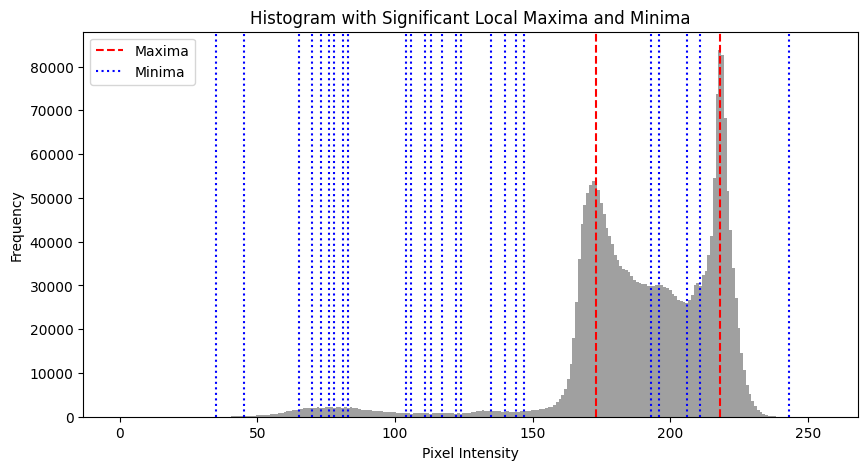

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\IMG_7829.jpg
Significant maxima indices: [173 216]
Intensity values of significant maxima: [173. 216.]
Frequencies of significant maxima: [53567 58115]
Significant minima indices: [ 65  67  96 103 105 110 118 124 133 142 145 147 195 199 208 219 240 244
 249]
Intensity values of significant minima: [ 65.  67.  96. 103. 105. 110. 118. 124. 133. 142. 145. 147. 195. 199.
 208. 219. 240. 244. 249.]
Frequencies of significant minima: [  215   217  1502  1104  1078   780   548   496   803  1148  1198  1346
 18703 18861 21335 41663    24     8     4]


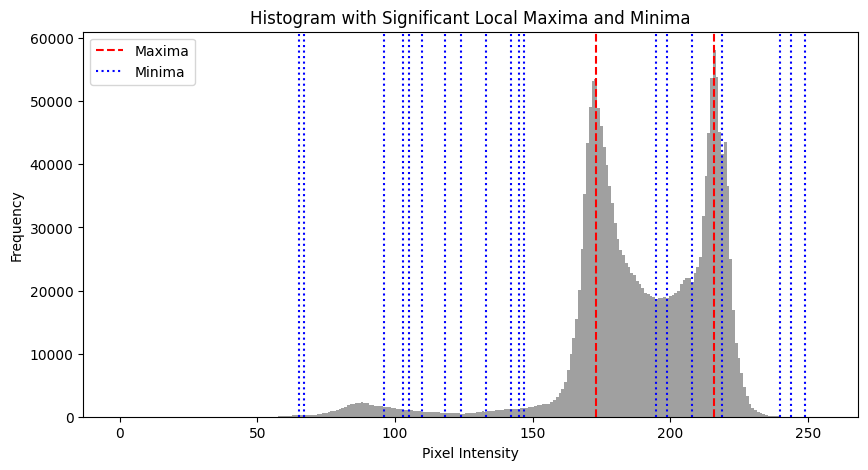

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\LLC\LLC-3.jpg
Significant maxima indices: [ 94 133 211]
Intensity values of significant maxima: [ 94. 133. 211.]
Frequencies of significant maxima: [ 14300  50252 111250]
Significant minima indices: [ 47  75 104 107 144 161 164 175 177 181 188 197]
Intensity values of significant minima: [ 47.  75. 104. 107. 144. 161. 164. 175. 177. 181. 188. 197.]
Frequencies of significant minima: [    0  2768  3454  3317 29762 14103 14625  9505  9710 10496  8973 10606]


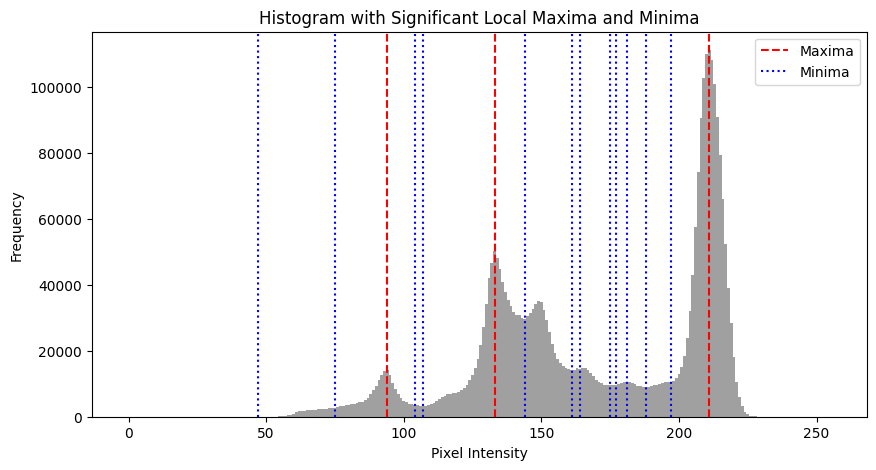

In [195]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in LLC:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image001.jpg
Significant maxima indices: [134 189]
Intensity values of significant maxima: [134. 189.]
Frequencies of significant maxima: [ 67334 144720]
Significant minima indices: [ 38  40  46  56  58  60  62  73  75  78  81  84  87  90  93  98 100 102
 106 110 156 159 161 163 168 170 172 207 215]
Intensity values of significant minima: [ 38.  40.  46.  56.  58.  60.  62.  73.  75.  78.  81.  84.  87.  90.
  93.  98. 100. 102. 106. 110. 156. 159. 161. 163. 168. 170. 172. 207.
 215.]
Frequencies of significant minima: [   0    0   16  552  606  529  439  152  113  113   97   90   74   71
   87  100  132  167  195  233 3014 2817 2671 2639 2577 2677 2728   59
    0]


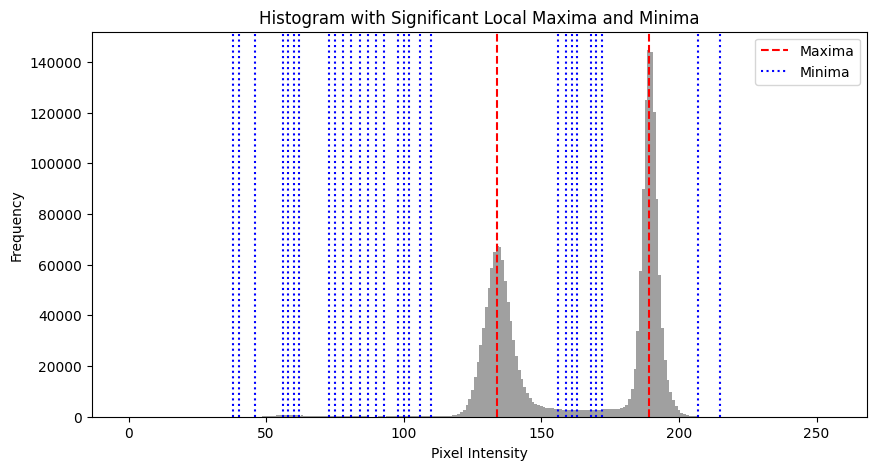

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image003.jpg
Significant maxima indices: [127 177]
Intensity values of significant maxima: [127. 177.]
Frequencies of significant maxima: [ 70056 149510]
Significant minima indices: [ 38  68  74  76  80  82  85  87  90  97  99 102 106 147 150 152 154 158
 160 163 198 202 207 252]
Intensity values of significant minima: [ 38.  68.  74.  76.  80.  82.  85.  87.  90.  97.  99. 102. 106. 147.
 150. 152. 154. 158. 160. 163. 198. 202. 207. 252.]
Frequencies of significant minima: [   1  135   82   66   56   68   64   63   98  135  119  126  143 3606
 3432 3369 3297 2999 2835 2877   10    1    0    0]


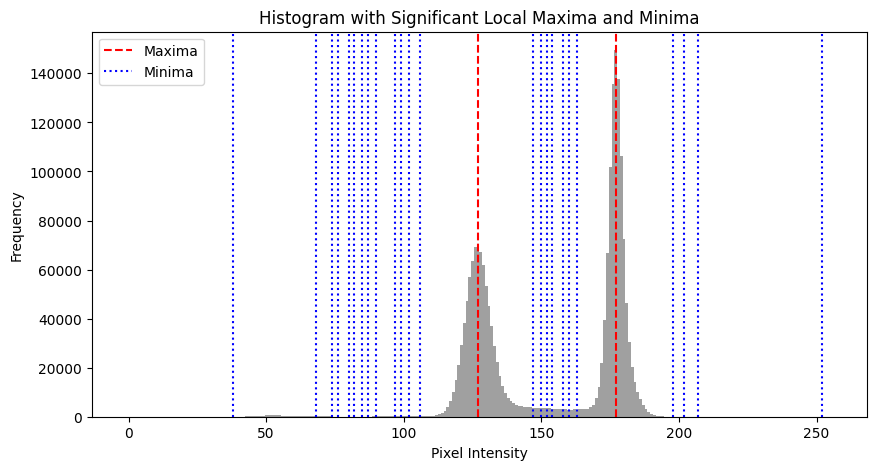

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image004.jpg
Significant maxima indices: [128 181]
Intensity values of significant maxima: [128. 181.]
Frequencies of significant maxima: [ 61451 120517]
Significant minima indices: [ 55  57  69  72  75  77  82  85  90  92  94  98 100 105 108 146 148 164
 166 169 202 204 207 239]
Intensity values of significant minima: [ 55.  57.  69.  72.  75.  77.  82.  85.  90.  92.  94.  98. 100. 105.
 108. 146. 148. 164. 166. 169. 202. 204. 207. 239.]
Frequencies of significant minima: [1080 1066  477  348  290  235  180  170  183  208  221  234  195  220
  299 9151 8654 4607 4293 4326    5    2    0    0]


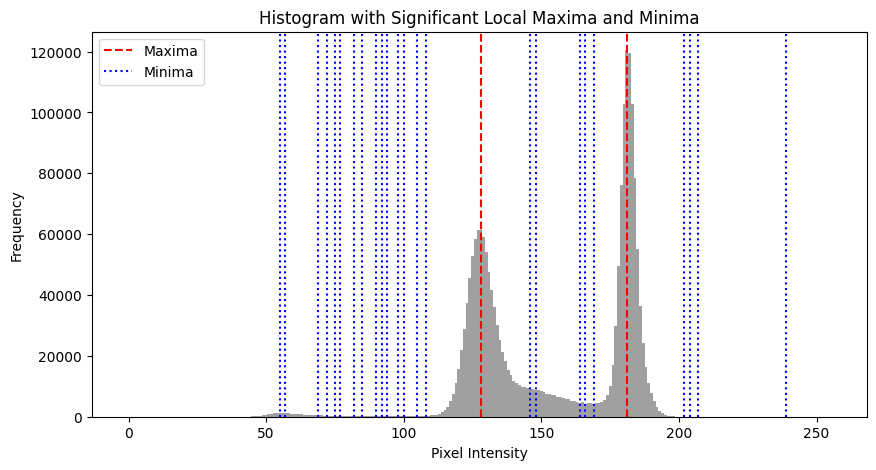

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Linfocitos normales\image006.jpg
Significant maxima indices: [126 178]
Intensity values of significant maxima: [126. 178.]
Frequencies of significant maxima: [ 66145 140641]
Significant minima indices: [ 58  60  62  69  71  75  79  81  83  86  91  93  96  98 100 102 104 107
 110 144 165]
Intensity values of significant minima: [ 58.  60.  62.  69.  71.  75.  79.  81.  83.  86.  91.  93.  96.  98.
 100. 102. 104. 107. 110. 144. 165.]
Frequencies of significant minima: [ 536  504  449  264  213  185  126  104   87   92  144  172  212  203
  238  239  231  243  275 8205 3989]


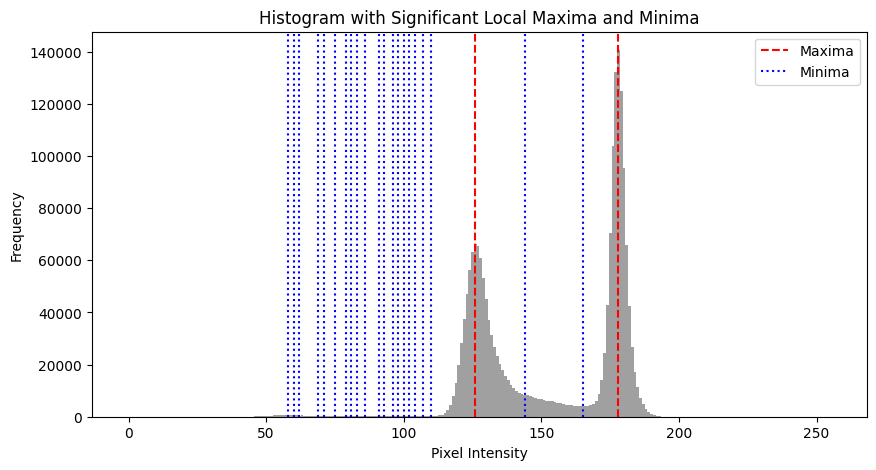

In [196]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in normal:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\2.jpg
Significant maxima indices: [154 216]
Intensity values of significant maxima: [154. 216.]
Frequencies of significant maxima: [ 38892 167876]
Significant minima indices: [ 51  55  61  63  65  71  74  79  81  83  89  91  94  96  99 101 108 121
 123 125 128 132 136 173 193 195 199 231]
Intensity values of significant minima: [ 51.  55.  61.  63.  65.  71.  74.  79.  81.  83.  89.  91.  94.  96.
  99. 101. 108. 121. 123. 125. 128. 132. 136. 173. 193. 195. 199. 231.]
Frequencies of significant minima: [    2    13    59    57    43    23    18    12    14    14    16    26
    19    16    15    16    55   710   744   695   597   511   485 11341
  5339  5258  5163     0]


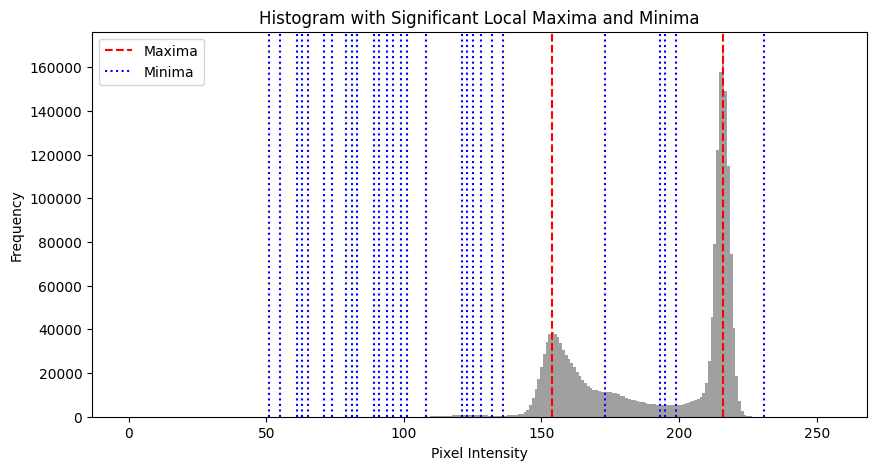

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\3.jpg
Significant maxima indices: [151 213]
Intensity values of significant maxima: [151. 213.]
Frequencies of significant maxima: [ 36387 189617]
Significant minima indices: [ 75  81  85  89  91  94 102 108 111 113 116 120 123 125 127 129 131 133
 171 174 193 196 199 229]
Intensity values of significant minima: [ 75.  81.  85.  89.  91.  94. 102. 108. 111. 113. 116. 120. 123. 125.
 127. 129. 131. 133. 171. 174. 193. 196. 199. 229.]
Frequencies of significant minima: [   0   22   39   88  120  161  285  356  354  343  411  375  336  289
  267  252  211  250 9452 9750 4728 4763 4727    0]


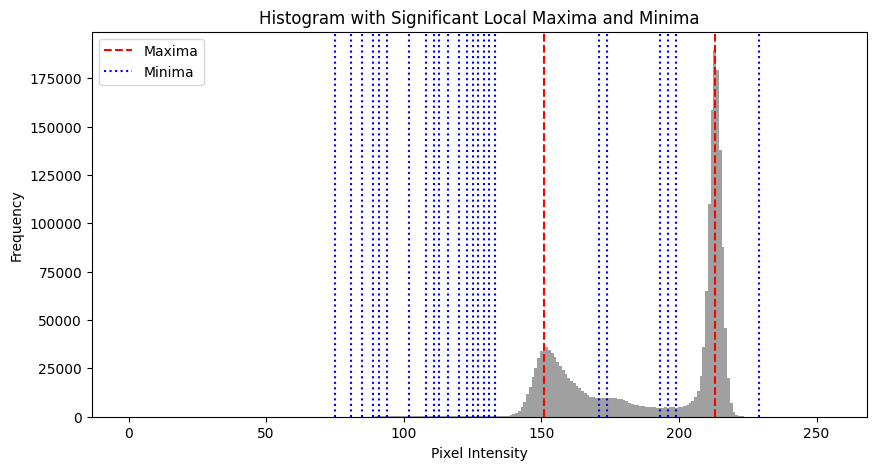

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\4.jpg
Significant maxima indices: [153 217]
Intensity values of significant maxima: [153. 217.]
Frequencies of significant maxima: [ 38398 153190]
Significant minima indices: [101 103 114 118 120 123 125 128 130 132 152 192 194 196 199]
Intensity values of significant minima: [101. 103. 114. 118. 120. 123. 125. 128. 130. 132. 152. 192. 194. 196.
 199.]
Frequencies of significant minima: [  107   157   534   506   493   439   368   314   281   301 37928  4609
  4355  4511  4743]


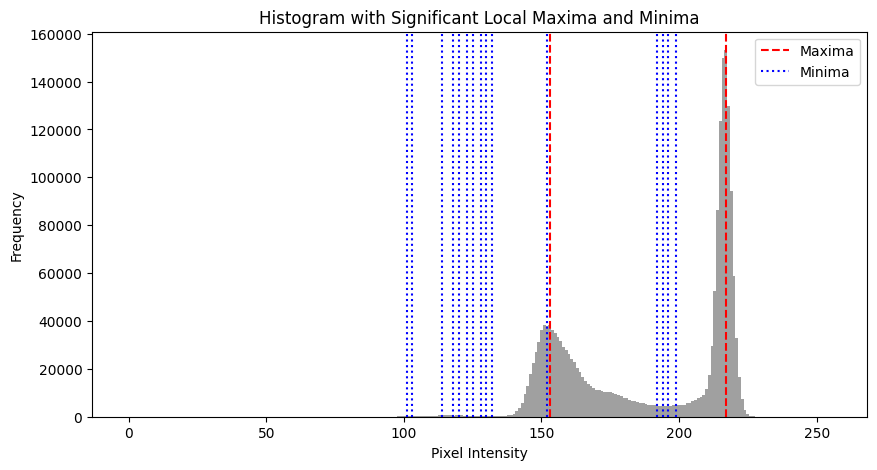

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\5.jpg
Significant maxima indices: [164 216]
Intensity values of significant maxima: [164. 216.]
Frequencies of significant maxima: [ 35916 147397]
Significant minima indices: [ 88  96 109 121 128 133 136 138 143 146 171 192 196 199 244 246]
Intensity values of significant minima: [ 88.  96. 109. 121. 128. 133. 136. 138. 143. 146. 171. 192. 196. 199.
 244. 246.]
Frequencies of significant minima: [    1    30   343   519   283   191   178   170   204   243 25604 10099
  9678  9669     0     0]


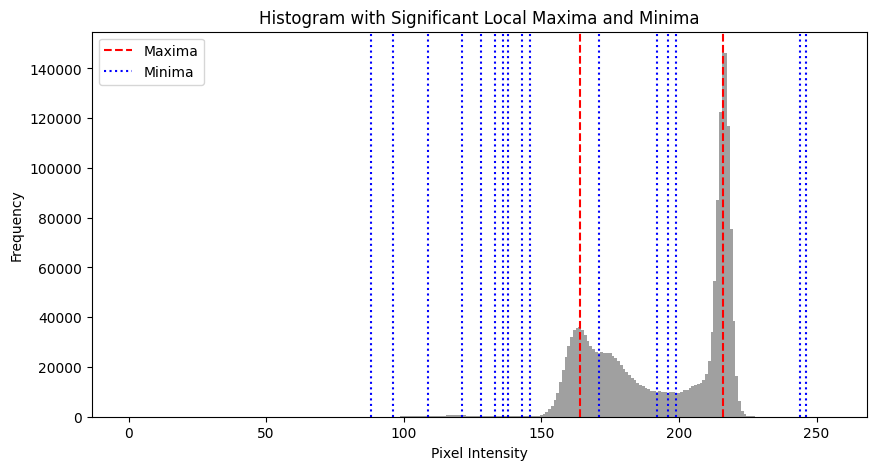

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\71-6.JPG
Significant maxima indices: [112 151]
Intensity values of significant maxima: [112. 151.]
Frequencies of significant maxima: [150691 137541]
Significant minima indices: [ 63  65  67  70  77  80 130 132 172]
Intensity values of significant minima: [ 63.  65.  67.  70.  77.  80. 130. 132. 172.]
Frequencies of significant minima: [ 1204  1267  1274  1247   832   853 18129 18240     6]


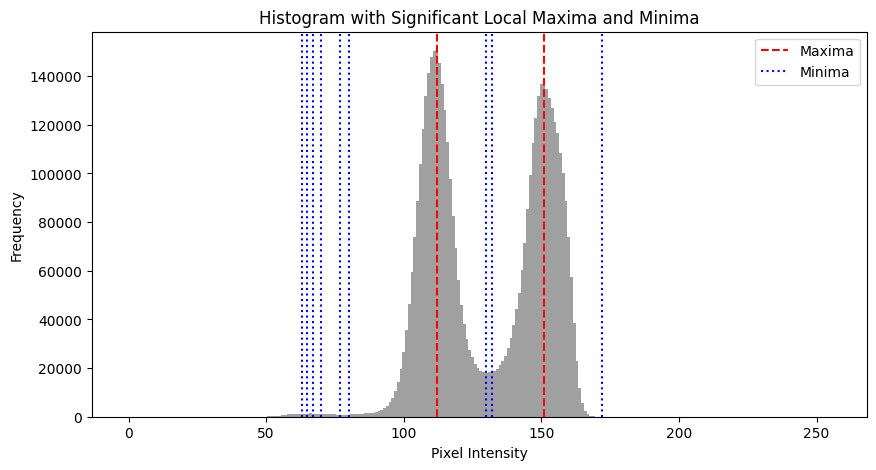

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\71-7.JPG
Significant maxima indices: [107 160]
Intensity values of significant maxima: [107. 160.]
Frequencies of significant maxima: [137849 147517]
Significant minima indices: [ 82  84 131]
Intensity values of significant minima: [ 82.  84. 131.]
Frequencies of significant minima: [ 1717  1577 18718]


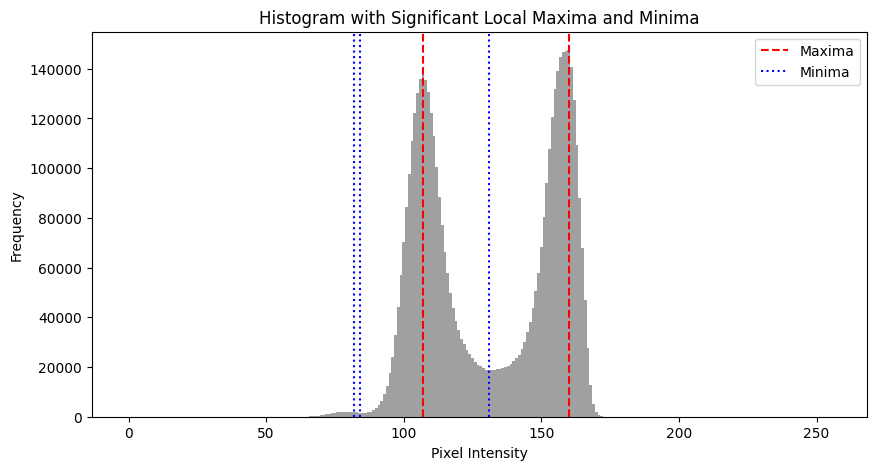

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image001.jpg
Significant maxima indices: [165 218]
Intensity values of significant maxima: [165. 218.]
Frequencies of significant maxima: [ 32130 149238]
Significant minima indices: [ 92 106 108 112 119 124 130 136 141 143 150 169 171 198 200 208 231 234
 240]
Intensity values of significant minima: [ 92. 106. 108. 112. 119. 124. 130. 136. 141. 143. 150. 169. 171. 198.
 200. 208. 231. 234. 240.]
Frequencies of significant minima: [    0   279   269   338   502   458   266   195   171   166   252 26424
 25964 10488 10567 13056     1     0     1]


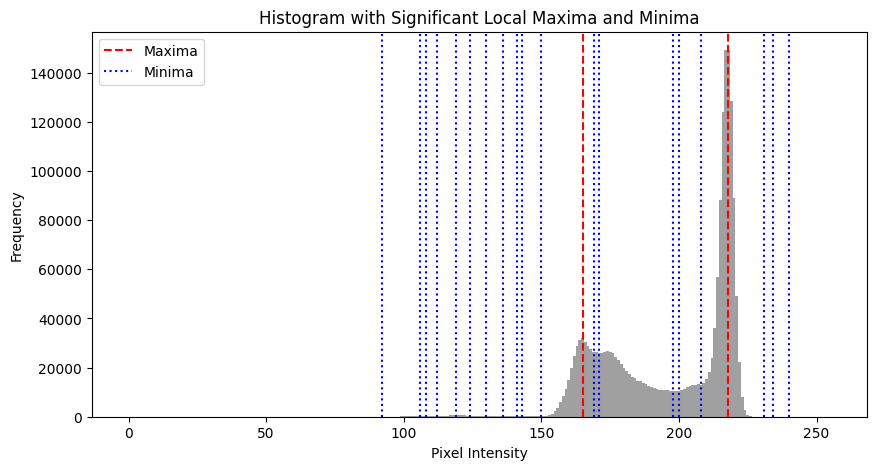

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image002.jpg
Significant maxima indices: [148 193]
Intensity values of significant maxima: [148. 193.]
Frequencies of significant maxima: [ 51382 194829]
Significant minima indices: [ 80 100 102 106 109 116 123 125 128 130 170 175 177 209 213 215]
Intensity values of significant minima: [ 80. 100. 102. 106. 109. 116. 123. 125. 128. 130. 170. 175. 177. 209.
 213. 215.]
Frequencies of significant minima: [    0   733   722   624   534   282   174   194   202   212 15339 15354
 15340     0     0     0]


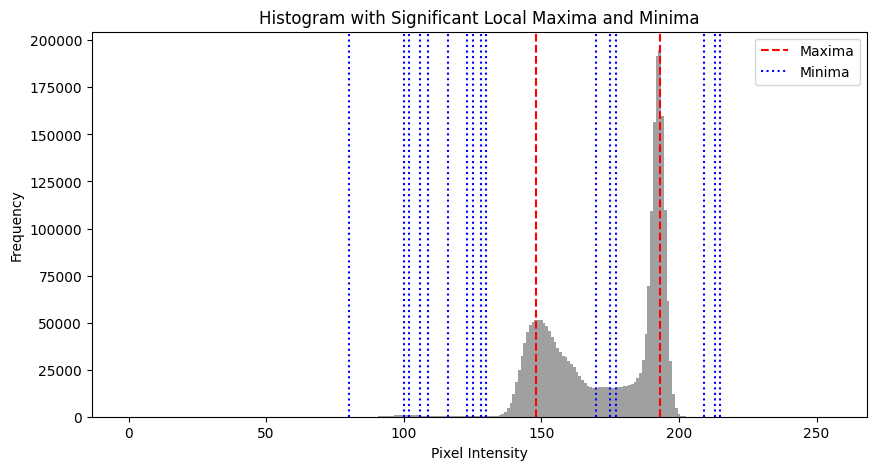

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image003.jpg
Significant maxima indices: [149 195]
Intensity values of significant maxima: [149. 195.]
Frequencies of significant maxima: [ 76200 213410]
Significant minima indices: [ 88 108 117 121 123 125 130 169 178 181 183 210 216]
Intensity values of significant minima: [ 88. 108. 117. 121. 123. 125. 130. 169. 178. 181. 183. 210. 216.]
Frequencies of significant minima: [    1   817   481   446   406   374   357 11720 10583 10938 10903    10
     2]


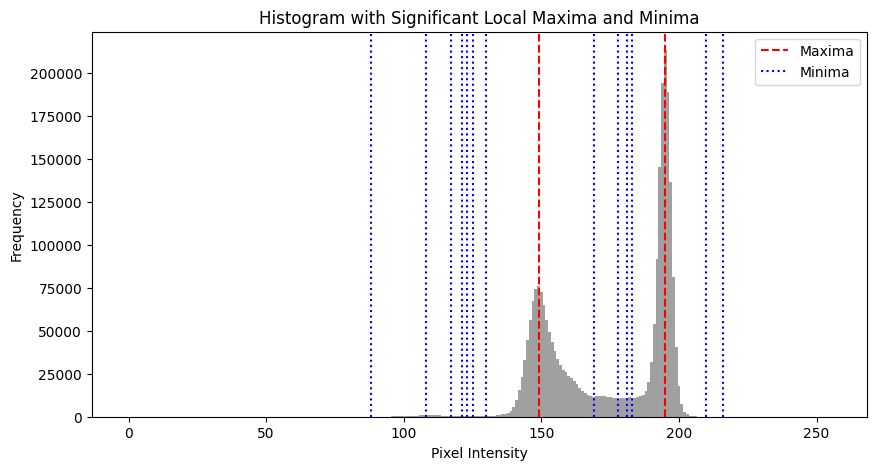

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image005.jpg
Significant maxima indices: [145 197]
Intensity values of significant maxima: [145. 197.]
Frequencies of significant maxima: [ 55463 193343]
Significant minima indices: [ 11  92 108 111 114 116 122 129 169 173 175 179 182 184 213 216 229 237
 240]
Intensity values of significant minima: [ 11.  92. 108. 111. 114. 116. 122. 129. 169. 173. 175. 179. 182. 184.
 213. 216. 229. 237. 240.]
Frequencies of significant minima: [    0     1   780   826   793   784   662   376 14246 14210 14168 13626
 13548 13384     1     0     0     0     0]


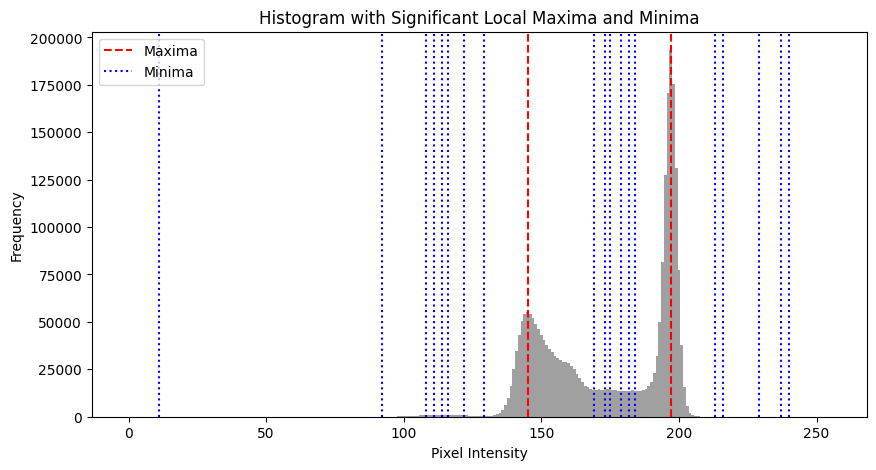

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image006.jpg
Significant maxima indices: [143 196]
Intensity values of significant maxima: [143. 196.]
Frequencies of significant maxima: [ 60231 204878]
Significant minima indices: [ 12  85 100 104 114 117 119 123 125 127 169 173 180 183 185 209 216 223
 239 241]
Intensity values of significant minima: [ 12.  85. 100. 104. 114. 117. 119. 123. 125. 127. 169. 173. 180. 183.
 185. 209. 216. 223. 239. 241.]
Frequencies of significant minima: [    0     0   469   532   676   595   567   497   463   439 10301 10234
  8853  8843  8701    16     0     0     0     0]


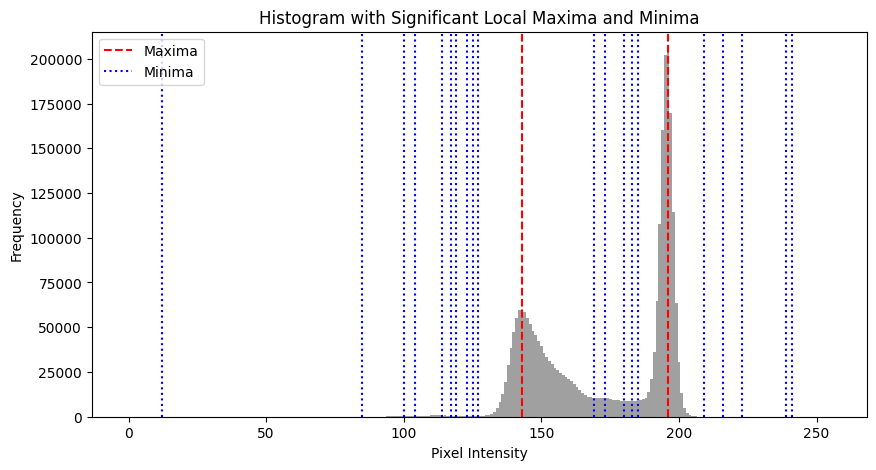

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Tricholeukemia\image007.jpg
Significant maxima indices: [142 195]
Intensity values of significant maxima: [142. 195.]
Frequencies of significant maxima: [ 55250 200805]
Significant minima indices: [110 112 114 116 118 121 125 169 180 184 214 216 218 221 238]
Intensity values of significant minima: [110. 112. 114. 116. 118. 121. 125. 169. 180. 184. 214. 216. 218. 221.
 238.]
Frequencies of significant minima: [  764   736   691   632   589   646   595 11538  9503  9917     0     0
     0     0     0]


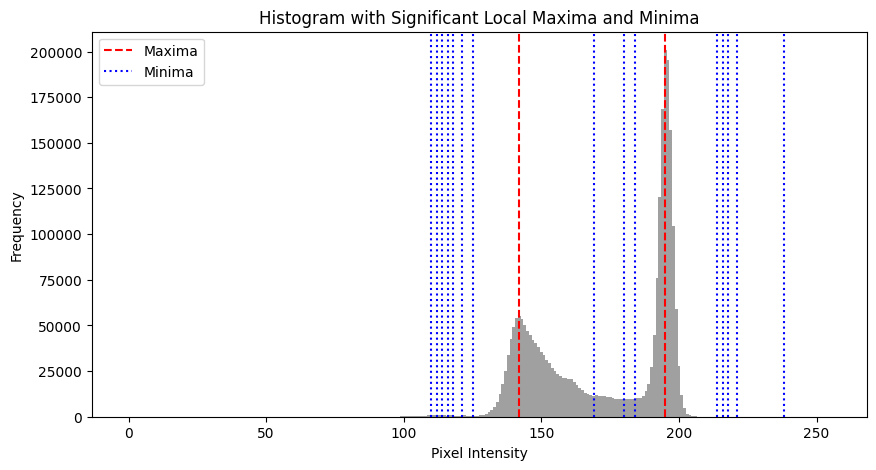

In [197]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in thricholeukemia:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Leucemia aguda linfoblastica\image1.jpg
Significant maxima indices: [ 97 199]
Intensity values of significant maxima: [ 97. 199.]
Frequencies of significant maxima: [ 32926 189336]
Significant minima indices: [ 72  76  80  98 136 146 150 152 156 158 160 162 164 169 224 226 228 231
 233]
Intensity values of significant minima: [ 72.  76.  80.  98. 136. 146. 150. 152. 156. 158. 160. 162. 164. 169.
 224. 226. 228. 231. 233.]
Frequencies of significant minima: [ 1222  1047  1019 30994  2758  2257  2241  2177  2194  2173  2173  2217
  2138  2376     5     4     3     1     0]


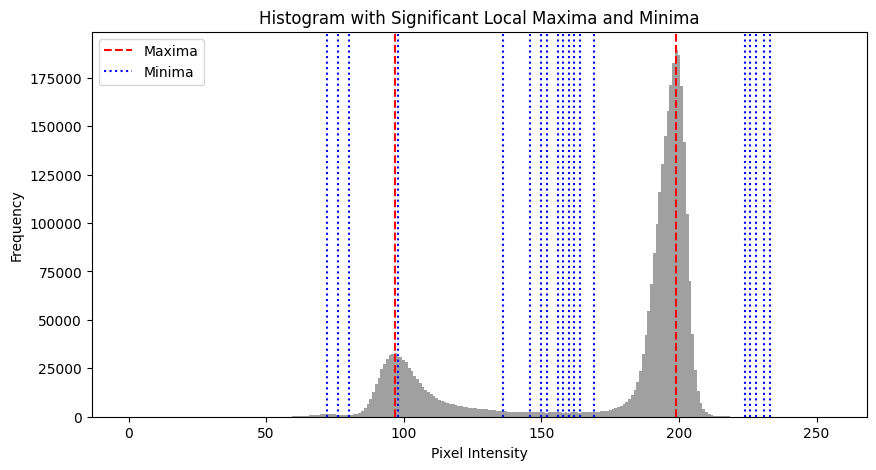

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Leucemia aguda linfoblastica\image2.jpg
Significant maxima indices: [121 189]
Intensity values of significant maxima: [121. 189.]
Frequencies of significant maxima: [44032 54121]
Significant minima indices: [ 56  62  67  70  75  82  88 122 126 128 157 159 221 223 226 229 231 236]
Intensity values of significant minima: [ 56.  62.  67.  70.  75.  82.  88. 122. 126. 128. 157. 159. 221. 223.
 226. 229. 231. 236.]
Frequencies of significant minima: [    0   151   208   191   246   323   398 43423 40706 40575  8322  8158
     9     8     2     2     3     0]


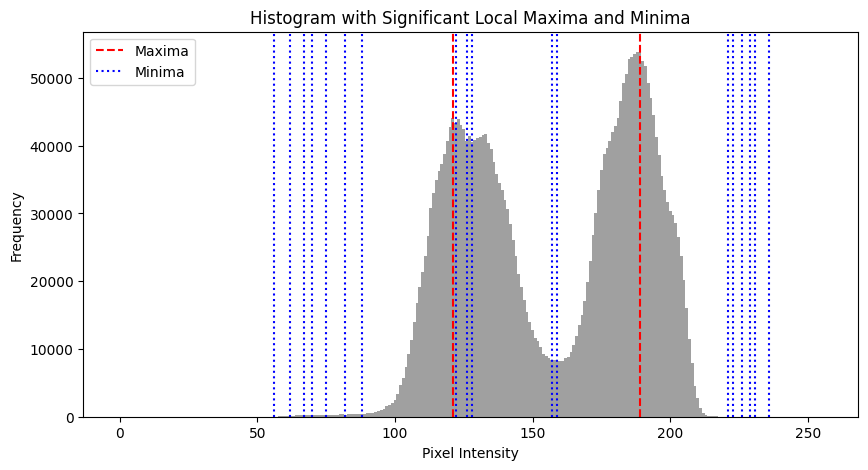

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Leucemia aguda linfoblastica\image3.jpg
Significant maxima indices: [139 190]
Intensity values of significant maxima: [139. 190.]
Frequencies of significant maxima: [ 45108 292953]
Significant minima indices: [ 11 110 112 116 169 173 210 212 236 240]
Intensity values of significant minima: [ 11. 110. 112. 116. 169. 173. 210. 212. 236. 240.]
Frequencies of significant minima: [   0  559  493  479 5788 5773    0    0    0    0]


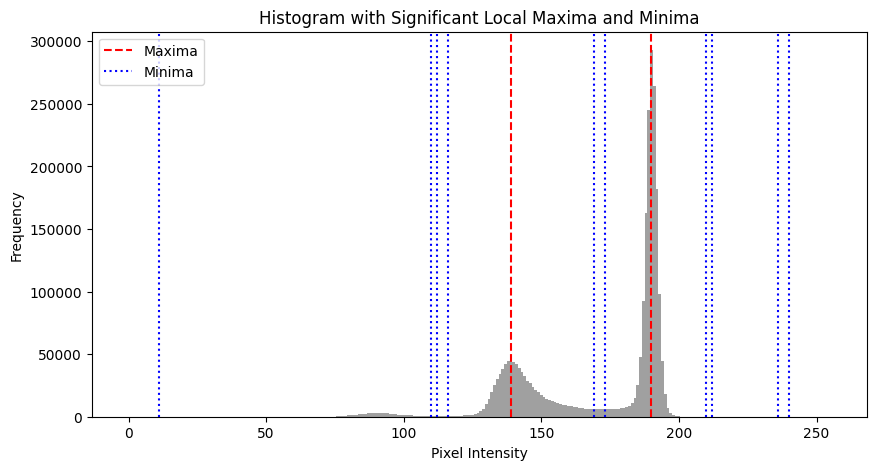

In [198]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in LLA:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7852.jpg
Significant maxima indices: [162 214]
Intensity values of significant maxima: [162. 214.]
Frequencies of significant maxima: [ 39450 164482]
Significant minima indices: [ 40  42  49  56  60  62  65  71  73  76  78  81  83  87  89  91  93  95
  98 101 103 105 107 112 114 118 122 125 128 146 177 197 200 202]
Intensity values of significant minima: [ 40.  42.  49.  56.  60.  62.  65.  71.  73.  76.  78.  81.  83.  87.
  89.  91.  93.  95.  98. 101. 103. 105. 107. 112. 114. 118. 122. 125.
 128. 146. 177. 197. 200. 202.]
Frequencies of significant minima: [   27    22   118   207   259   270   308   428   413   404   416   507
   520   498   444   440   413   440   398   331   313   313   310   274
   284   281   271   285   324   742 21368 12314 12233 12362]


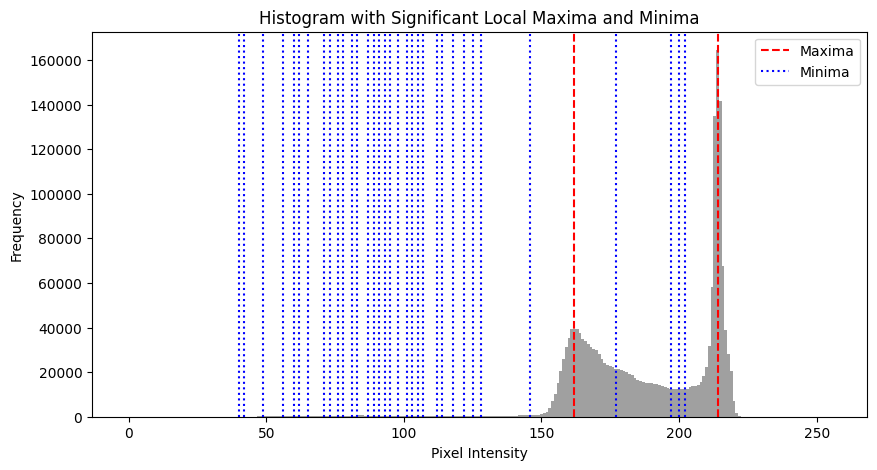

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7853.jpg
Significant maxima indices: [164 210]
Intensity values of significant maxima: [164. 210.]
Frequencies of significant maxima: [34187 88805]
Significant minima indices: [ 33  39  47  49  54  57  59  62  67  72  77  80  82  87  90  93  95  98
 101 103 106 108 110 113 119 123 126 132 136 192 194 213 224 227]
Intensity values of significant minima: [ 33.  39.  47.  49.  54.  57.  59.  62.  67.  72.  77.  80.  82.  87.
  90.  93.  95.  98. 101. 103. 106. 108. 110. 113. 119. 123. 126. 132.
 136. 192. 194. 213. 224. 227.]
Frequencies of significant minima: [    2    91   110    90   142   181   180   200   176   170   197   195
   197   169   155   160   144   116   105    90   101    83   102    91
    94   121   124   126   135  7148  7267 39151     2     0]


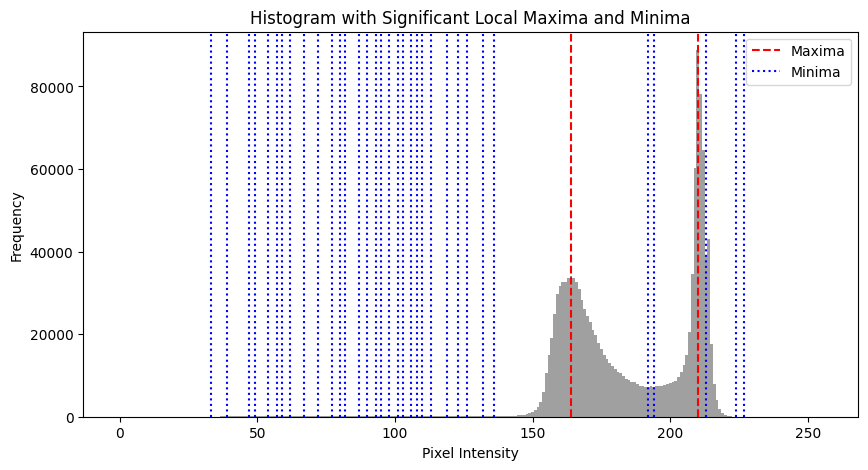

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7855.jpg
Significant maxima indices: [168 211]
Intensity values of significant maxima: [168. 211.]
Frequencies of significant maxima: [ 37887 134982]
Significant minima indices: [ 47  57  65  68  73  76  78  80  89  95  98 102 104 106 114 116 118 120
 129 134 137 141 149 151 199 201 233]
Intensity values of significant minima: [ 47.  57.  65.  68.  73.  76.  78.  80.  89.  95.  98. 102. 104. 106.
 114. 116. 118. 120. 129. 134. 137. 141. 149. 151. 199. 201. 233.]
Frequencies of significant minima: [    2   111   208   241   310   291   247   264   141   109    89    80
    70    76    71    73    78    75   117   143   152   201   297   349
 12229 12497     0]


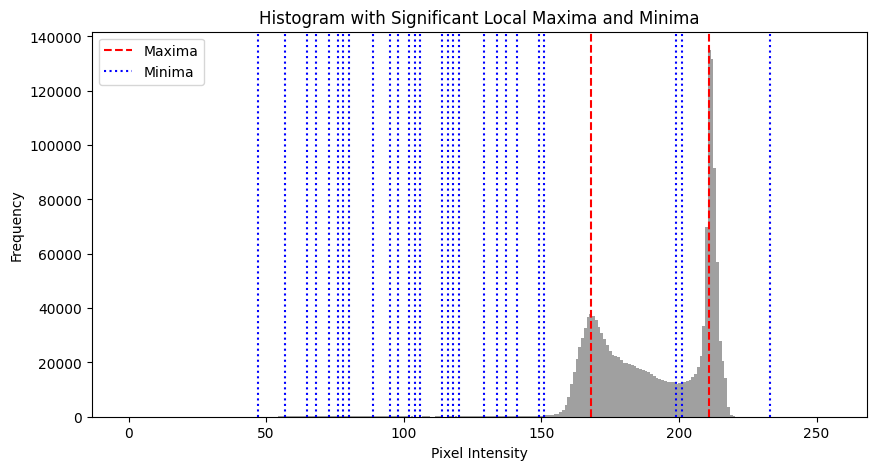

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7856.jpg
Significant maxima indices: [171 213]
Intensity values of significant maxima: [171. 213.]
Frequencies of significant maxima: [48895 93877]
Significant minima indices: [ 30  35  38  40  43  46  49  53  56  58  65  69  72  74  80  85  88  93
  99 103 107 109 111 115 117 123 128 132 139 143 148 153 195 199 219 225
 235 237]
Intensity values of significant minima: [ 30.  35.  38.  40.  43.  46.  49.  53.  56.  58.  65.  69.  72.  74.
  80.  85.  88.  93.  99. 103. 107. 109. 111. 115. 117. 123. 128. 132.
 139. 143. 148. 153. 195. 199. 219. 225. 235. 237.]
Frequencies of significant minima: [    2     1     5     3     2     3     3     2     3     5    14    28
    49    55   106   165   231   273   388   355   318   344   292   302
   268   191   145   137   188   211   273   354  8573  8100 24810  4811
     2     3]


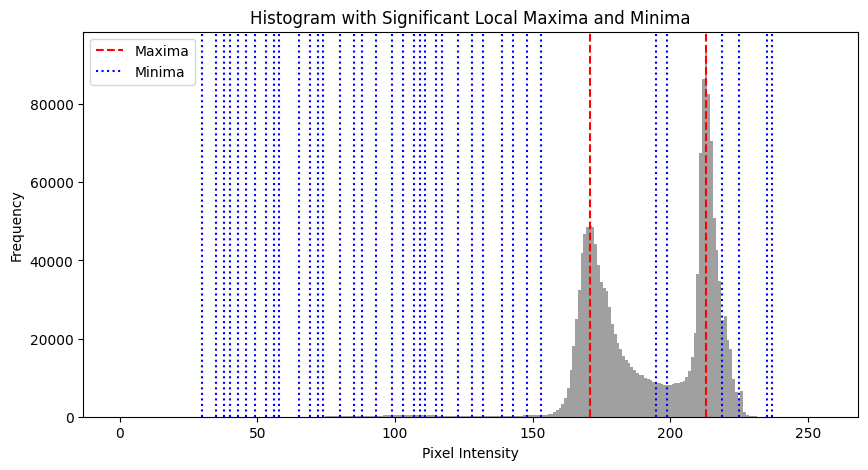

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7857.jpg
Significant maxima indices: [182 215]
Intensity values of significant maxima: [182. 215.]
Frequencies of significant maxima: [ 61063 124514]
Significant minima indices: [ 65  70  83  89  97  99 101 106 110 113 121 124 126 128 132 134 141 145
 155 162 206 223]
Intensity values of significant minima: [ 65.  70.  83.  89.  97.  99. 101. 106. 110. 113. 121. 124. 126. 128.
 132. 134. 141. 145. 155. 162. 206. 223.]
Frequencies of significant minima: [    1     3    25   125   282   328   372   420   412   440   302   301
   288   262   267   282   287   349   756  1505 18167  7517]


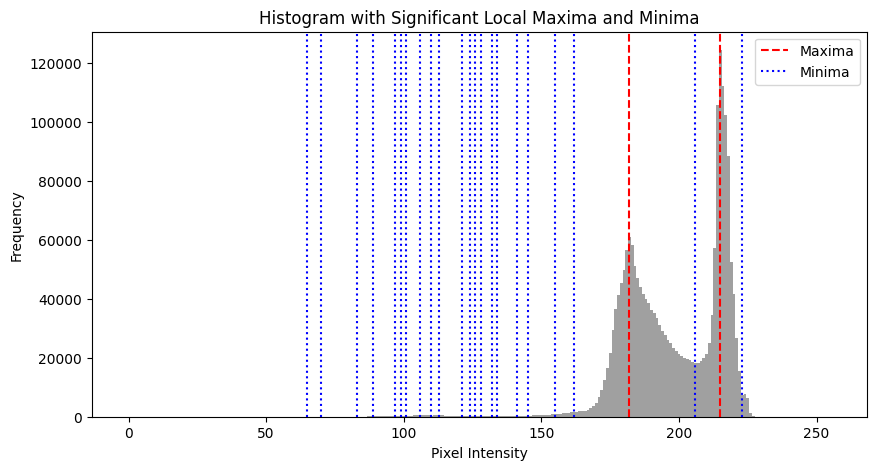

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7858.jpg
Significant maxima indices: [182 220]
Intensity values of significant maxima: [182. 220.]
Frequencies of significant maxima: [38764 65829]
Significant minima indices: [ 88  91 106 108 110 113 124 128 133 136 139 142 145 154 156 158 186 193
 213 221]
Intensity values of significant minima: [ 88.  91. 106. 108. 110. 113. 124. 128. 133. 136. 139. 142. 145. 154.
 156. 158. 186. 193. 213. 221.]
Frequencies of significant minima: [  116   138   360   376   347   327   242   173   125   127   106   121
   133   224   221   217 32052 23406 13016 61652]


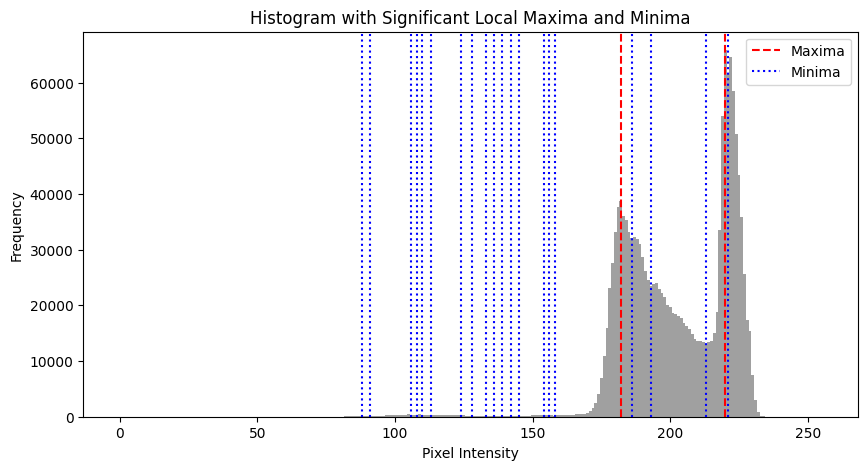

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7859.jpg
Significant maxima indices: [182 210]
Intensity values of significant maxima: [182. 210.]
Frequencies of significant maxima: [43489 80135]
Significant minima indices: [ 69  74  97  99 101 104 106 108 110 113 116 120 123 126 129 133 138 141
 144 152 154 156 159 162 166 198 202 225]
Intensity values of significant minima: [ 69.  74.  97.  99. 101. 104. 106. 108. 110. 113. 116. 120. 123. 126.
 129. 133. 138. 141. 144. 152. 154. 156. 159. 162. 166. 198. 202. 225.]
Frequencies of significant minima: [   0    3  373  381  404  358  352  370  374  330  231  194  142  130
  129  115  139  156  149  348  407  409  419  456  651 7718 7809    0]


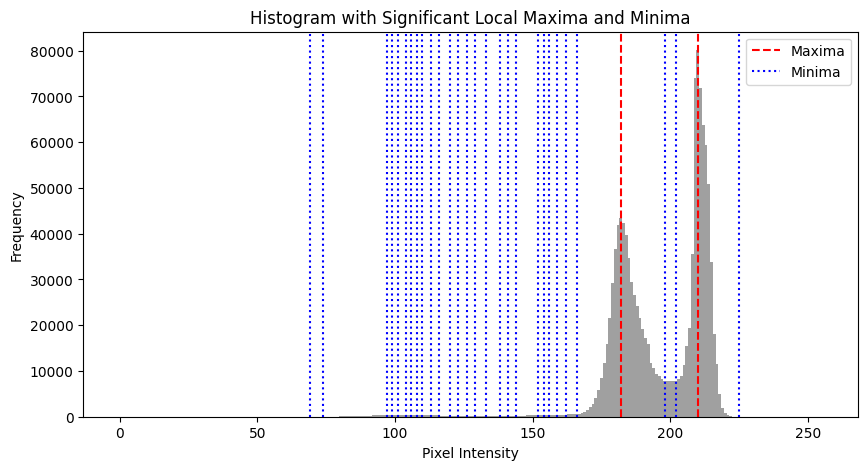

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7861.jpg
Significant maxima indices: [176 210]
Intensity values of significant maxima: [176. 210.]
Frequencies of significant maxima: [25263 85934]
Significant minima indices: [ 63  69  75  77  82  95  97 100 103 109 112 115 118 120 122 127 129 131
 136 138 140 144 148 151 154 156 200 203]
Intensity values of significant minima: [ 63.  69.  75.  77.  82.  95.  97. 100. 103. 109. 112. 115. 118. 120.
 122. 127. 129. 131. 136. 138. 140. 144. 148. 151. 154. 156. 200. 203.]
Frequencies of significant minima: [   0    4    9    8   25  259  287  338  388  417  425  428  406  396
  372  267  264  252  244  234  247  214  221  257  269  284 7700 7711]


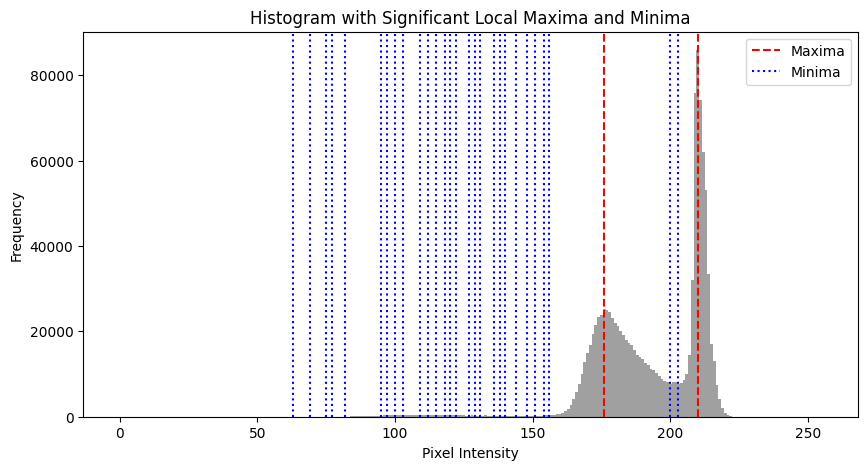

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7862.jpg
Significant maxima indices: [183 210]
Intensity values of significant maxima: [183. 210.]
Frequencies of significant maxima: [ 45140 120692]
Significant minima indices: [ 18  29  31  35  38  40  42  47  49  53  57  59  64  66  68  74  83  85
  88 100 103 105 107 109 114 117 120 131 136 140 142 144 148 151 154 156
 181 204 217 229]
Intensity values of significant minima: [ 18.  29.  31.  35.  38.  40.  42.  47.  49.  53.  57.  59.  64.  66.
  68.  74.  83.  85.  88. 100. 103. 105. 107. 109. 114. 117. 120. 131.
 136. 140. 142. 144. 148. 151. 154. 156. 181. 204. 217. 229.]
Frequencies of significant minima: [    0    35    26    15    12    14    17    16     9     7    12     9
    25    41    39    67   326   403   453   881   892   870   811   738
   775   736   760   481   358   289   281   292   313   315   352   337
 44273 18169 22667     0]


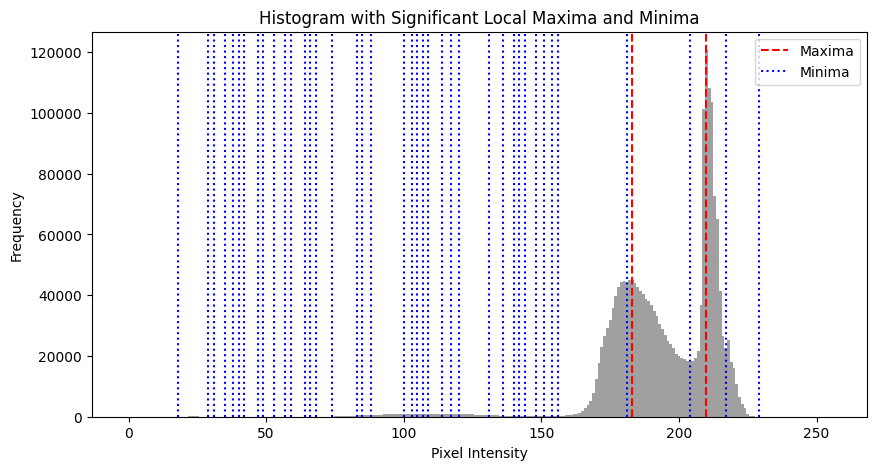

Image: C:\Users\JCardeteLl\Documents\TFG\Bases_de_datos\images_x60_reales_fundacion\Marginal\IMG_7863.jpg
Significant maxima indices: [184 222]
Intensity values of significant maxima: [184. 222.]
Frequencies of significant maxima: [ 66519 141416]
Significant minima indices: [  5  30  33  35  40  43  45  47  49  52  54  58  60  68  74  79  81  90
  97 107 110 114 117 119 123 129 132 136 144 148 151 153 160 206 213 228
 243 246]
Intensity values of significant minima: [  5.  30.  33.  35.  40.  43.  45.  47.  49.  52.  54.  58.  60.  68.
  74.  79.  81.  90.  97. 107. 110. 114. 117. 119. 123. 129. 132. 136.
 144. 148. 151. 153. 160. 206. 213. 228. 243. 246.]
Frequencies of significant minima: [    0    29    23    23    28    33    30    34    22    40    28    36
    36    78   146   193   226   527  1018  1678  1764  1862  1802  1781
  1781  1426  1178  1073   768   743   701   753   884 30585 39090 34627
    28    26]


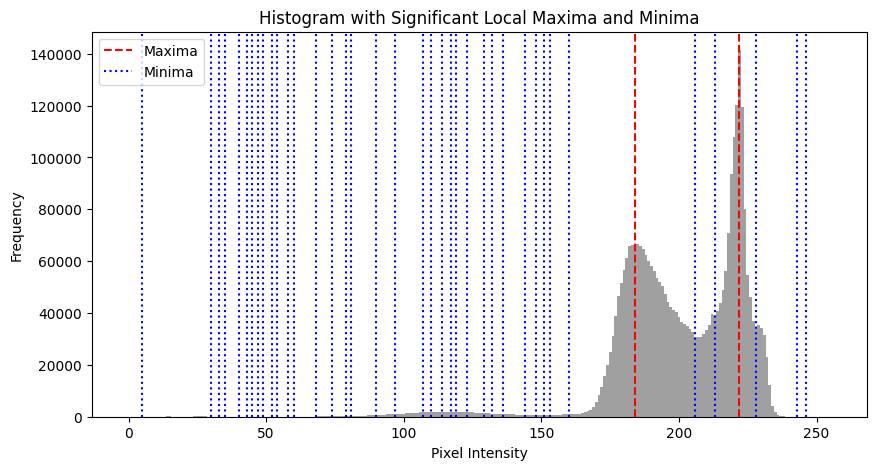

In [199]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in marginal:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    

    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

94
Image: 118
Significant maxima indices: [117 189]
Intensity values of significant maxima: [117. 189.]
Frequencies of significant maxima: [ 23040 130707]
Significant minima indices: [ 54  57  62  64  68  73  76  78  81  83  85  87  94 118 125 160 164 166
 170 215 217 219 224 227]
Intensity values of significant minima: [ 54.  57.  62.  64.  68.  73.  76.  78.  81.  83.  85.  87.  94. 118.
 125. 160. 164. 166. 170. 215. 217. 219. 224. 227.]
Frequencies of significant minima: [ 1201  1112   948   909   889   718   588   509   408   421   429   426
   284 22866 21391  4537  4463  4387  4465    16    13    12     1     2]


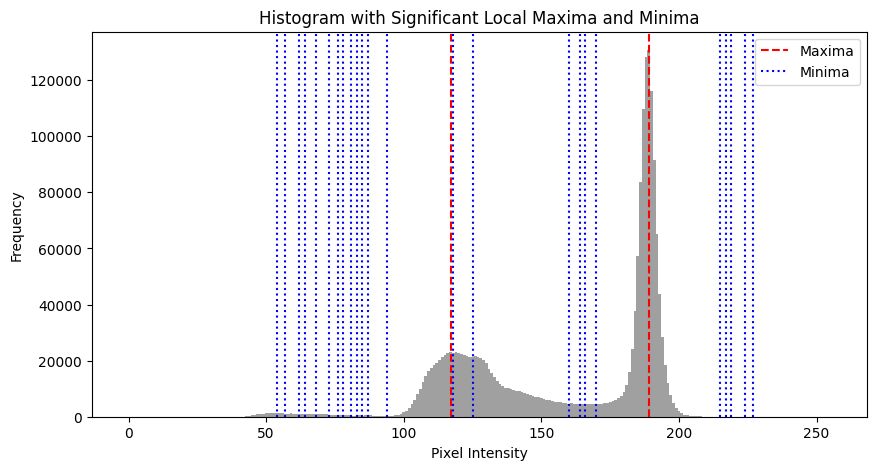

92
Image: 111
Significant maxima indices: [110 182]
Intensity values of significant maxima: [110. 182.]
Frequencies of significant maxima: [ 21582 139469]
Significant minima indices: [ 28  32  58  65  71  74  76  79  81  83  90  92 111 156 158 162 164 208
 213 220]
Intensity values of significant minima: [ 28.  32.  58.  65.  71.  74.  76.  79.  81.  83.  90.  92. 111. 156.
 158. 162. 164. 208. 213. 220.]
Frequencies of significant minima: [    0     2  1274   805   554   526   535   632   645   632   524   533
 21134  4392  4204  4022  4099     0     0     0]


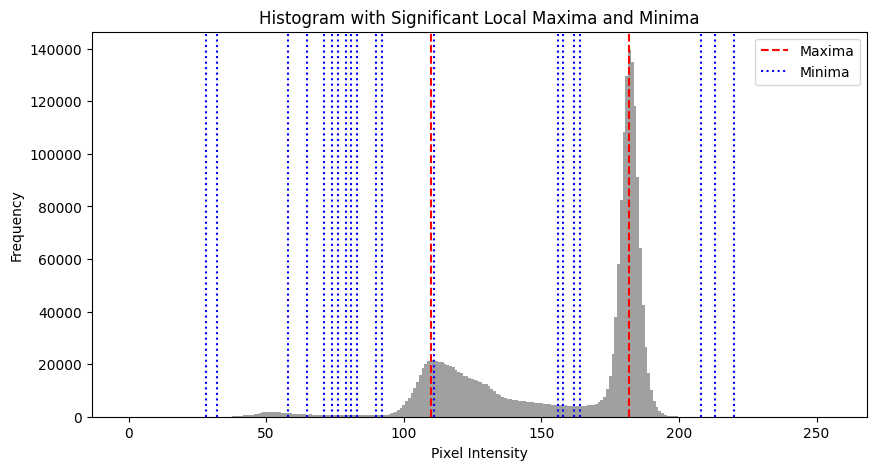

96
Image: 122
Significant maxima indices: [118 189]
Intensity values of significant maxima: [118. 189.]
Frequencies of significant maxima: [ 27519 110203]
Significant minima indices: [ 33  36  39  42  60  63  65  74  79  83  96 122 124 160 169 171 210 215
 218 223 226 229 235 238 245]
Intensity values of significant minima: [ 33.  36.  39.  42.  60.  63.  65.  74.  79.  83.  96. 122. 124. 160.
 169. 171. 210. 215. 218. 223. 226. 229. 235. 238. 245.]
Frequencies of significant minima: [   10     8     6     5   650   592   620   320   273   341   114 26284
 26707  5726  5035  5097    36    14    13    13    11    10    20    31
     0]


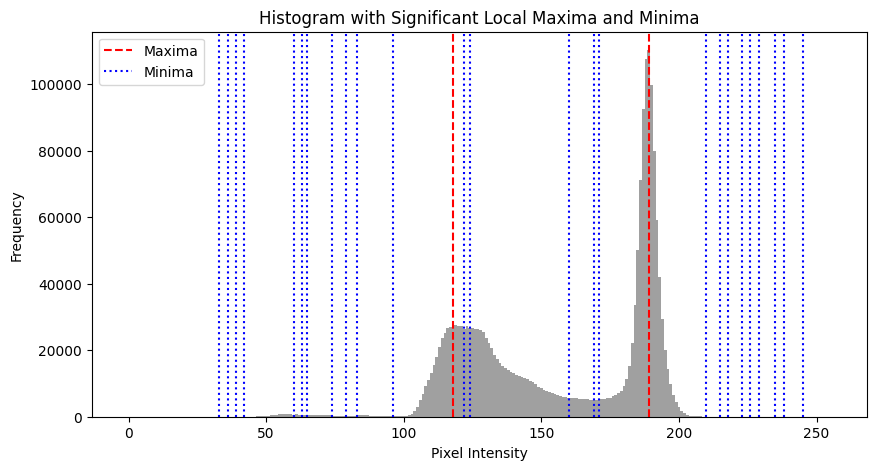

101
Image: 141
Significant maxima indices: [117 183]
Intensity values of significant maxima: [117. 183.]
Frequencies of significant maxima: [ 34205 151999]
Significant minima indices: [ 49  53  56  58  66  68  73  76  80  82  86  90  93  98 101 141 158 162
 204 206 209 217]
Intensity values of significant minima: [ 49.  53.  56.  58.  66.  68.  73.  76.  80.  82.  86.  90.  93.  98.
 101. 141. 158. 162. 204. 206. 209. 217.]
Frequencies of significant minima: [ 445  478  431  399  519  531  447  359  336  321  369  375  353  310
  331 6014 3961 3800    7    2    1    0]


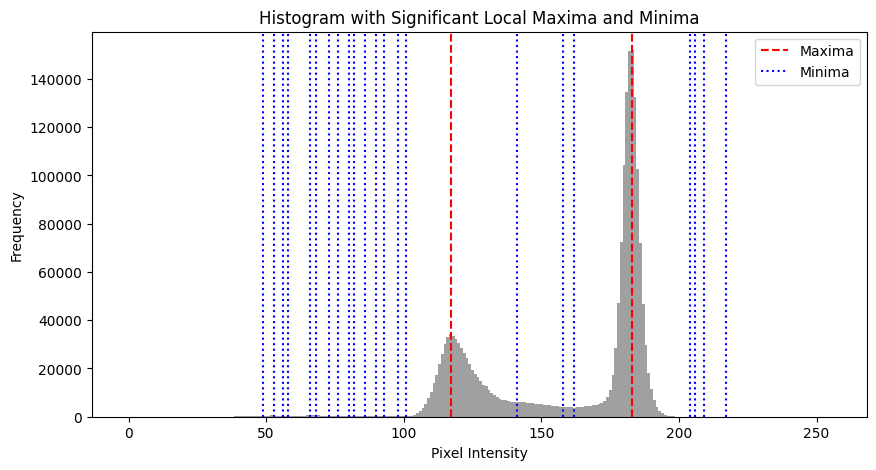

103
Image: 149
Significant maxima indices: [121 180]
Intensity values of significant maxima: [121. 180.]
Frequencies of significant maxima: [ 29934 183992]
Significant minima indices: [ 38  48  52  55  57  61  65  67  72  86  90  92  96  98 100 103 149 151
 159 162 164 200 213]
Intensity values of significant minima: [ 38.  48.  52.  55.  57.  61.  65.  67.  72.  86.  90.  92.  96.  98.
 100. 103. 149. 151. 159. 162. 164. 200. 213.]
Frequencies of significant minima: [  15  334  414  452  461  387  300  317  405  388  285  293  349  332
  312  313 4767 4492 3707 3754 3900    7    0]


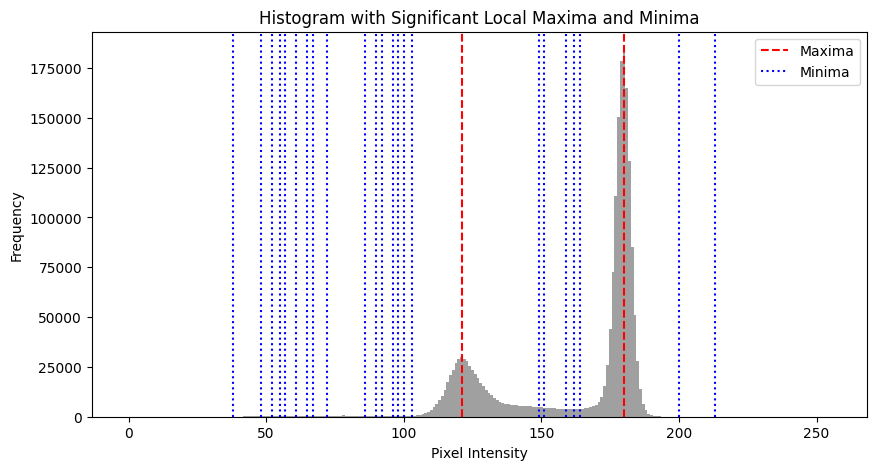

In [203]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, argrelextrema
from PIL import Image

def find_significant_maxima_and_minima(image_path):
    # Load the image in grayscale
    image = Image.open(image_path).convert('L')
    pixel_values = np.array(image).flatten()

    # Calculate histogram
    counts, bin_edges = np.histogram(pixel_values, bins=256, range=(0, 256))

    # Use find_peaks to identify peaks with a minimum height and prominence
    peaks, properties = find_peaks(counts, height=1000, prominence=10000)  # adjust these values based on your histogram

    # Use argrelextrema to find local minima
    minima_indices = argrelextrema(counts, np.less)[0]

    return peaks, minima_indices, counts, bin_edges, properties

maxima_dict = {}

for line in plasmatica:  # assuming 'normal' is a list of image paths
    maxima_indices, minima_indices, counts, bin_edges, properties = find_significant_maxima_and_minima(line)

    for idx in maxima_indices:
        maxima_dict[bin_edges[idx]] = counts[idx]
    
    max_value = max(maxima_dict, key=maxima_dict.get)

    for line in range(len(maxima_indices)): 
        if maxima_indices[line] > 100: 
            threshold_value_max = maxima_indices[line]
            break

    for line in minima_indices:
        if line > threshold_value_max: 
            break
        threshold_value_min = line
    
    print(threshold_value_min)
    
    # Print the local maxima values and their frequencies
    print("Image:", line)
    print("Significant maxima indices:", maxima_indices)
    print("Intensity values of significant maxima:", bin_edges[maxima_indices])
    print("Frequencies of significant maxima:", counts[maxima_indices])

    # Print the local minima values and their frequencies
    print("Significant minima indices:", minima_indices)
    print("Intensity values of significant minima:", bin_edges[minima_indices])
    print("Frequencies of significant minima:", counts[minima_indices])

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.bar(bin_edges[:-1], counts, width=np.diff(bin_edges), color='gray', alpha=0.75)
    for maxima in maxima_indices:
        plt.axvline(x=bin_edges[maxima], color='r', linestyle='--', label='Maxima' if maxima == maxima_indices[0] else "")
    for minima in minima_indices:
        plt.axvline(x=bin_edges[minima], color='b', linestyle=':', label='Minima' if minima == minima_indices[0] else "")
    plt.title('Histogram with Significant Local Maxima and Minima')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()